In [135]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os

from tensorflow.python.keras.optimizer_v1 import nadam
from tensorflow.python.layers.core import dropout

for dirname, _, filenames in os.walk(r'C:\Users\zhoul\Desktop\HomeWork\Project\LSTM\data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


C:\Users\zhoul\Desktop\HomeWork\Project\LSTM\data\Location1.csv
C:\Users\zhoul\Desktop\HomeWork\Project\LSTM\data\Location2.csv
C:\Users\zhoul\Desktop\HomeWork\Project\LSTM\data\Location3.csv
C:\Users\zhoul\Desktop\HomeWork\Project\LSTM\data\Location4.csv
C:\Users\zhoul\Desktop\HomeWork\Project\LSTM\data\readme.txt


# **Importing Libraries**

In [136]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import scipy.stats as stats
import warnings
import math
from colorama import Fore
warnings.filterwarnings("ignore")

from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, LayerNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model
from IPython.display import Image  
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, LayerNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import MultiHeadAttention
import math
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Layer, Dense, Dropout, LSTM, LayerNormalization, MultiHeadAttention
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import math
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Layer, Dense, Dropout, Bidirectional, LSTM, LayerNormalization, MultiHeadAttention
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam

In [137]:
#
df=pd.read_csv('C:\\Users\\zhoul\\Desktop\\HomeWork\\Project\\LSTM\\data\\Location1.csv')

In [138]:
df1=df.copy()

In [139]:
df2=pd.read_csv('C:\\Users\\zhoul\\Desktop\\HomeWork\\Project\\LSTM\\data\\Location2.csv')

# **Exploratory Data Analysis (EDA)**

In [140]:
df1.head()

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power
0,2017-01-02 00:00:00,28.5,85,24.5,1.44,1.26,146,162,1.4,0.1635
1,2017-01-02 01:00:00,28.4,86,24.7,2.06,3.99,151,158,4.4,0.1424
2,2017-01-02 02:00:00,26.8,91,24.5,1.30,2.78,148,150,3.2,0.1214
3,2017-01-02 03:00:00,27.4,88,24.3,1.30,2.69,58,105,1.6,0.1003
4,2017-01-02 04:00:00,27.3,88,24.1,2.47,4.43,58,84,4.0,0.0793


In [141]:
df1.tail()

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power
43795,2021-12-31 19:00:00,34.1,94,32.5,1.00,1.91,53,137,2.5,0.1796
43796,2021-12-31 20:00:00,34.8,94,33.4,2.52,4.30,56,72,4.8,0.2066
43797,2021-12-31 21:00:00,34.1,95,33.0,1.10,1.84,360,45,4.3,0.2336
43798,2021-12-31 22:00:00,34.4,96,33.5,2.40,4.62,45,51,4.2,0.2606
43799,2021-12-31 23:00:00,35.0,97,34.2,2.26,5.04,45,51,4.3,0.2877


In [142]:
df1.describe()

,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power
count,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000
mean,47.862911,72.288744,38.569308,3.591147,6.284431,203.637329,203.343676,7.771795,0.405385
std,19.453691,16.852287,18.772110,1.649318,2.685216,96.371262,97.959852,3.569147,0.288322
min,-14.400000,18.000000,-17.100000,0.000000,0.100000,1.000000,0.000000,0.500000,0.000000
25%,32.100000,60.000000,24.300000,2.410000,4.380000,132.000000,130.000000,5.000000,0.148900
50%,47.300000,74.000000,38.100000,3.300000,6.080000,225.000000,226.000000,7.200000,0.347650
75%,64.500000,86.000000,54.700000,4.590000,7.990000,277.000000,278.000000,10.000000,0.659600
max,94.100000,100.000000,76.300000,13.450000,20.650000,360.000000,360.000000,29.200000,0.991300


In [143]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43800 entries, 0 to 43799
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 43800 non-null  object 
 1   temperature_2m       43800 non-null  float64
 2   relativehumidity_2m  43800 non-null  int64  
 3   dewpoint_2m          43800 non-null  float64
 4   windspeed_10m        43800 non-null  float64
 5   windspeed_100m       43800 non-null  float64
 6   winddirection_10m    43800 non-null  int64  
 7   winddirection_100m   43800 non-null  int64  
 8   windgusts_10m        43800 non-null  float64
 9   Power                43800 non-null  float64
dtypes: float64(6), int64(3), object(1)
memory usage: 3.3+ MB


In [144]:
df1.isnull().sum()

Time                   0
temperature_2m         0
relativehumidity_2m    0
dewpoint_2m            0
windspeed_10m          0
windspeed_100m         0
winddirection_10m      0
winddirection_100m     0
windgusts_10m          0
Power                  0
dtype: int64

In [145]:
df1['Time']=pd.to_datetime(df1['Time'])

In [146]:
df1['Year']=df1['Time'].dt.year

In [147]:
df1['Month']=df1['Time'].dt.month
df1['Quarter']=df1['Time'].dt.quarter
df1['Day']=df1['Time'].dt.dayofweek

In [148]:
df1.head()

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power,Year,Month,Quarter,Day
0,2017-01-02 00:00:00,28.5,85,24.5,1.44,1.26,146,162,1.4,0.1635,2017,1,1,0
1,2017-01-02 01:00:00,28.4,86,24.7,2.06,3.99,151,158,4.4,0.1424,2017,1,1,0
2,2017-01-02 02:00:00,26.8,91,24.5,1.30,2.78,148,150,3.2,0.1214,2017,1,1,0
3,2017-01-02 03:00:00,27.4,88,24.3,1.30,2.69,58,105,1.6,0.1003,2017,1,1,0
4,2017-01-02 04:00:00,27.3,88,24.1,2.47,4.43,58,84,4.0,0.0793,2017,1,1,0


Checking once for converting into Week names

In [149]:
df1.Day.unique()

array([0, 1, 2, 3, 4, 5, 6], dtype=int64)

In [150]:
day_mapping = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}

# Apply the mapping using the dictionary
df1['Day'] = df1['Day'].map(day_mapping)

In [151]:
df1.head()

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power,Year,Month,Quarter,Day
0,2017-01-02 00:00:00,28.5,85,24.5,1.44,1.26,146,162,1.4,0.1635,2017,1,1,Monday
1,2017-01-02 01:00:00,28.4,86,24.7,2.06,3.99,151,158,4.4,0.1424,2017,1,1,Monday
2,2017-01-02 02:00:00,26.8,91,24.5,1.30,2.78,148,150,3.2,0.1214,2017,1,1,Monday
3,2017-01-02 03:00:00,27.4,88,24.3,1.30,2.69,58,105,1.6,0.1003,2017,1,1,Monday
4,2017-01-02 04:00:00,27.3,88,24.1,2.47,4.43,58,84,4.0,0.0793,2017,1,1,Monday


In [152]:
df1.Day.unique()

array(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday',
       'Sunday'], dtype=object)

# **Data Visualization**

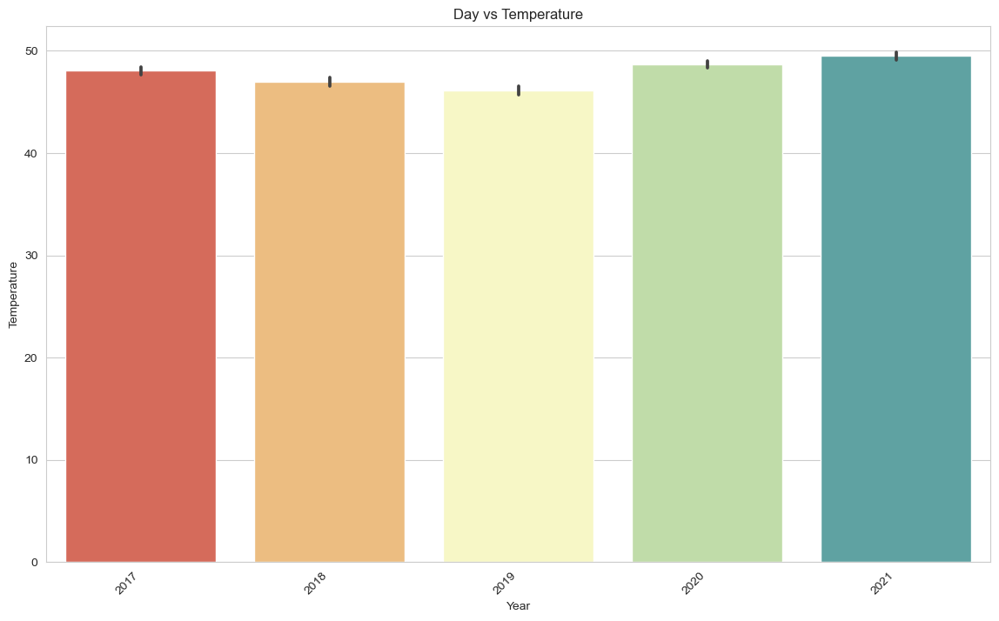

In [153]:
plt.figure(figsize=(14, 8))
sns.barplot(x='Year', y='temperature_2m', data=df1, palette='Spectral')
plt.title('Day vs Temperature')
plt.xlabel('Year')
plt.ylabel('Temperature')
plt.xticks(rotation=45, ha='right')
plt.show()

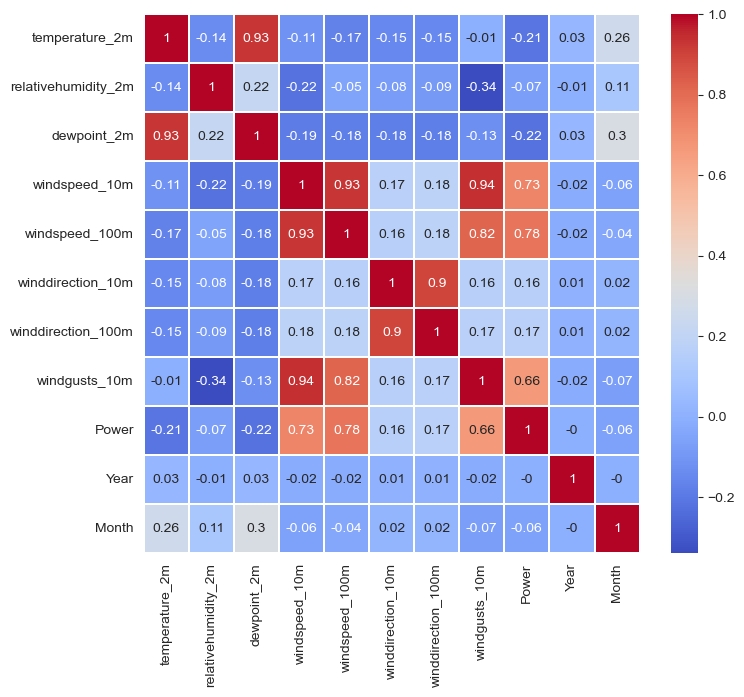

In [154]:
fig, axes = plt.subplots(figsize=(8,7))
corrdata=sns.heatmap(round(df1.iloc[:,1:12].corr(),2), cmap='coolwarm', annot=True,linewidths=0.1)
plt.show()

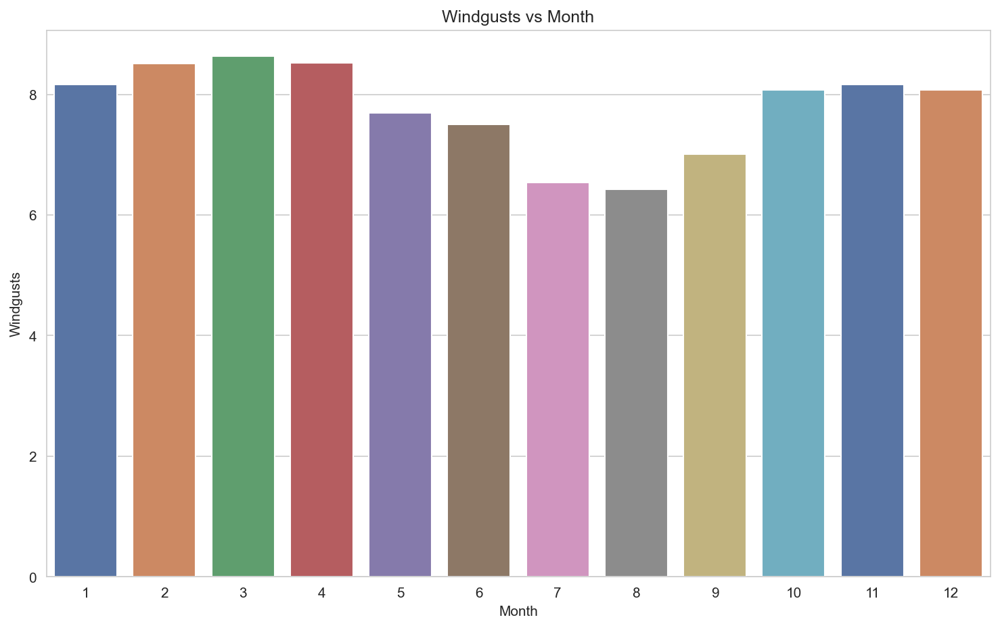

In [155]:
day_per_temperature = df1.groupby("Month")["windgusts_10m"].mean().sort_values(ascending=False)

plt.figure(figsize = (12, 7), dpi = 150)
sns.barplot(x = day_per_temperature.index, y = day_per_temperature.values,palette='deep')
plt.xlabel("Month")
#plt.xticks(['January','February','March','April','May','June','July','August','September','October','November','December'])
plt.ylabel("Windgusts")
plt.title("Windgusts vs Month");

Text(0.5, 1.0, 'Power vs Year')

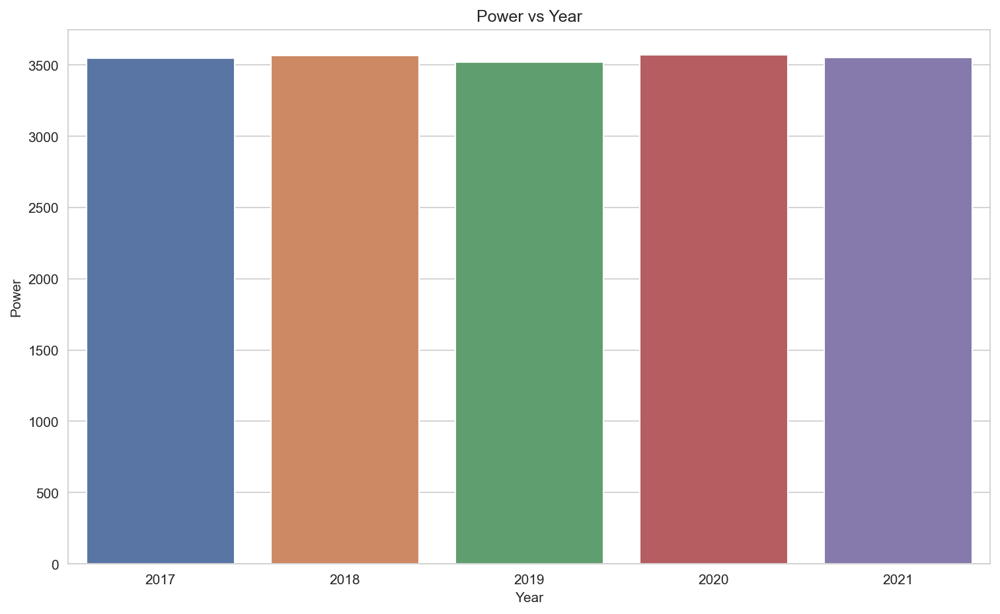

In [156]:
day_per_temperature = df1.groupby("Year")["Power"].sum().sort_values(ascending=False)

plt.figure(figsize = (12, 7), dpi = 150)
sns.barplot(x = day_per_temperature.index, y = day_per_temperature.values,palette='deep')
plt.xlabel("Year")
plt.ylabel("Power")
plt.title("Power vs Year")

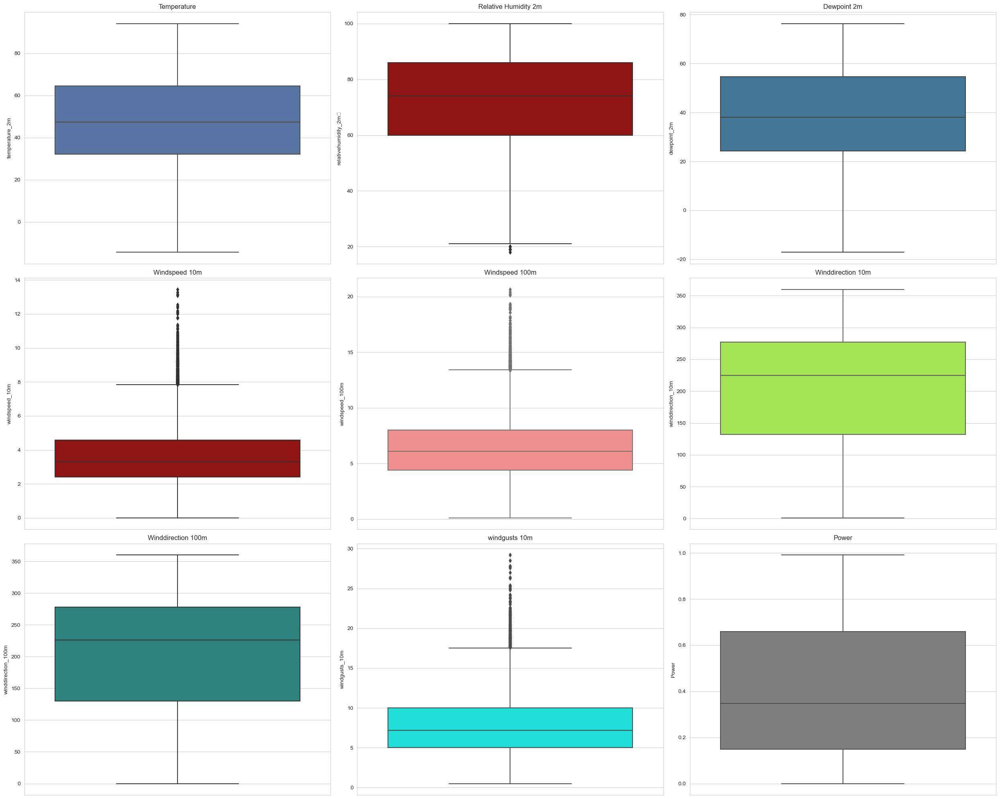

In [157]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.set_palette(palette="tab10")
sns.boxplot(data=df1, y= "temperature_2m",palette = 'deep',ax=axes[0,0]).set(xlabel='',ylabel='temperature_2m', title='Temperature')
sns.boxplot(data=df1, y= "relativehumidity_2m",palette = 'flag',ax=axes[0,1]).set(xlabel='',ylabel='relativehumidity_2m	', title='Relative Humidity 2m')
sns.boxplot(data=df1, y= "dewpoint_2m",palette = 'mako',ax=axes[0,2]).set(xlabel='',ylabel='dewpoint_2m', title='Dewpoint 2m')
sns.boxplot(data=df1, y= "windspeed_10m",palette = 'flag',ax=axes[1,0]).set(xlabel='',ylabel='windspeed_10m', title='Windspeed 10m')
sns.boxplot(data=df1, y= "windspeed_100m",palette = 'spring',ax=axes[1,1]).set(xlabel='',ylabel='windspeed_100m', title='Windspeed 100m')
sns.boxplot(data=df1, y= "winddirection_10m",palette = 'turbo',ax=axes[1,2]).set(xlabel='',ylabel='winddirection_10m', title='Winddirection 10m')
sns.boxplot(data=df1, y= "winddirection_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='',ylabel='winddirection_100m', title='Winddirection 100m')
sns.boxplot(data=df1, y= "windgusts_10m",palette = 'hsv',ax=axes[2,1]).set(xlabel='',ylabel='windgusts_10m', title='windgusts 10m')
sns.boxplot(data=df1, y= "Power",palette = 'binary',ax=axes[2,2]).set(xlabel='',ylabel='Power', title='Power')
plt.tight_layout()
plt.show()

In [158]:
columns=['temperature_2m', 'relativehumidity_2m', 'dewpoint_2m',
       'windspeed_10m', 'windspeed_100m', 'winddirection_10m',
       'winddirection_100m', 'windgusts_10m', 'Power']
threshold = 2
for i in columns:
    mean = np.mean(df1[i])
    std = np.std(df1[i])
    z_scores = np.abs((df1[i] - mean) / std)
    outliers = z_scores > threshold
    print("Removed outliers:")
    #print(df1[outliers].relativehumidity_2m)
    df1 = df1[~outliers]

Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:


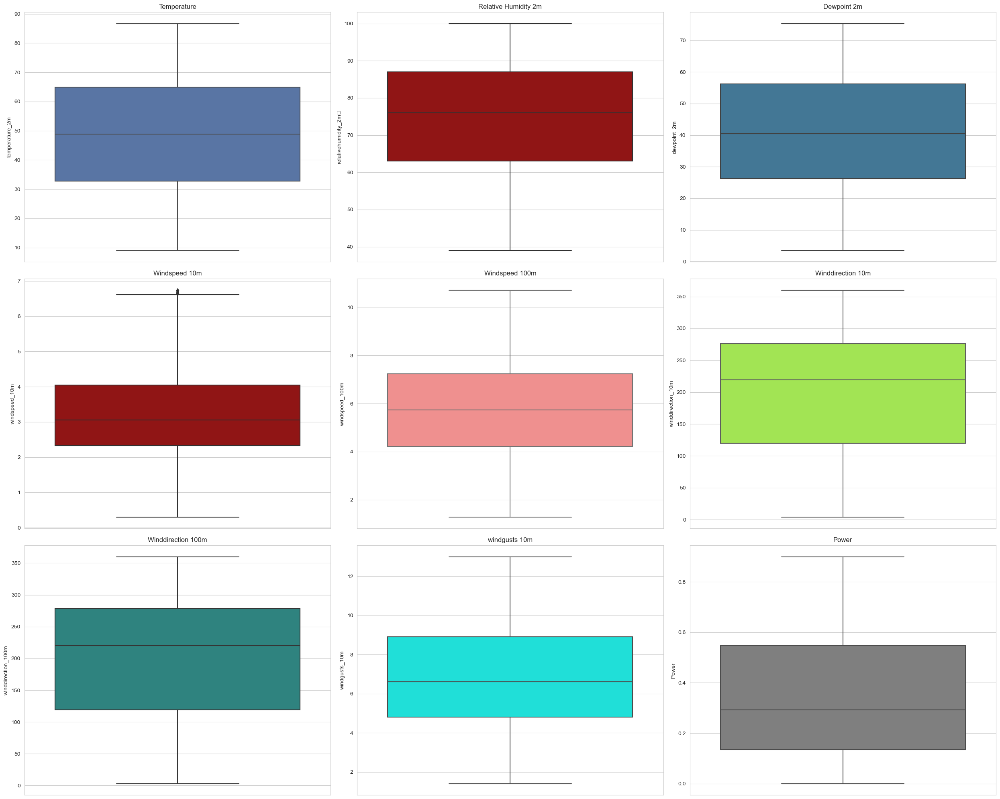

In [159]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.set_palette(palette="tab10")
sns.boxplot(data=df1, y= "temperature_2m",palette = 'deep',ax=axes[0,0]).set(xlabel='',ylabel='temperature_2m', title='Temperature')
sns.boxplot(data=df1, y= "relativehumidity_2m",palette = 'flag',ax=axes[0,1]).set(xlabel='',ylabel='relativehumidity_2m	', title='Relative Humidity 2m')
sns.boxplot(data=df1, y= "dewpoint_2m",palette = 'mako',ax=axes[0,2]).set(xlabel='',ylabel='dewpoint_2m', title='Dewpoint 2m')
sns.boxplot(data=df1, y= "windspeed_10m",palette = 'flag',ax=axes[1,0]).set(xlabel='',ylabel='windspeed_10m', title='Windspeed 10m')
sns.boxplot(data=df1, y= "windspeed_100m",palette = 'spring',ax=axes[1,1]).set(xlabel='',ylabel='windspeed_100m', title='Windspeed 100m')
sns.boxplot(data=df1, y= "winddirection_10m",palette = 'turbo',ax=axes[1,2]).set(xlabel='',ylabel='winddirection_10m', title='Winddirection 10m')
sns.boxplot(data=df1, y= "winddirection_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='',ylabel='winddirection_100m', title='Winddirection 100m')
sns.boxplot(data=df1, y= "windgusts_10m",palette = 'hsv',ax=axes[2,1]).set(xlabel='',ylabel='windgusts_10m', title='windgusts 10m')
sns.boxplot(data=df1, y= "Power",palette = 'binary',ax=axes[2,2]).set(xlabel='',ylabel='Power', title='Power')
plt.tight_layout()
plt.show()

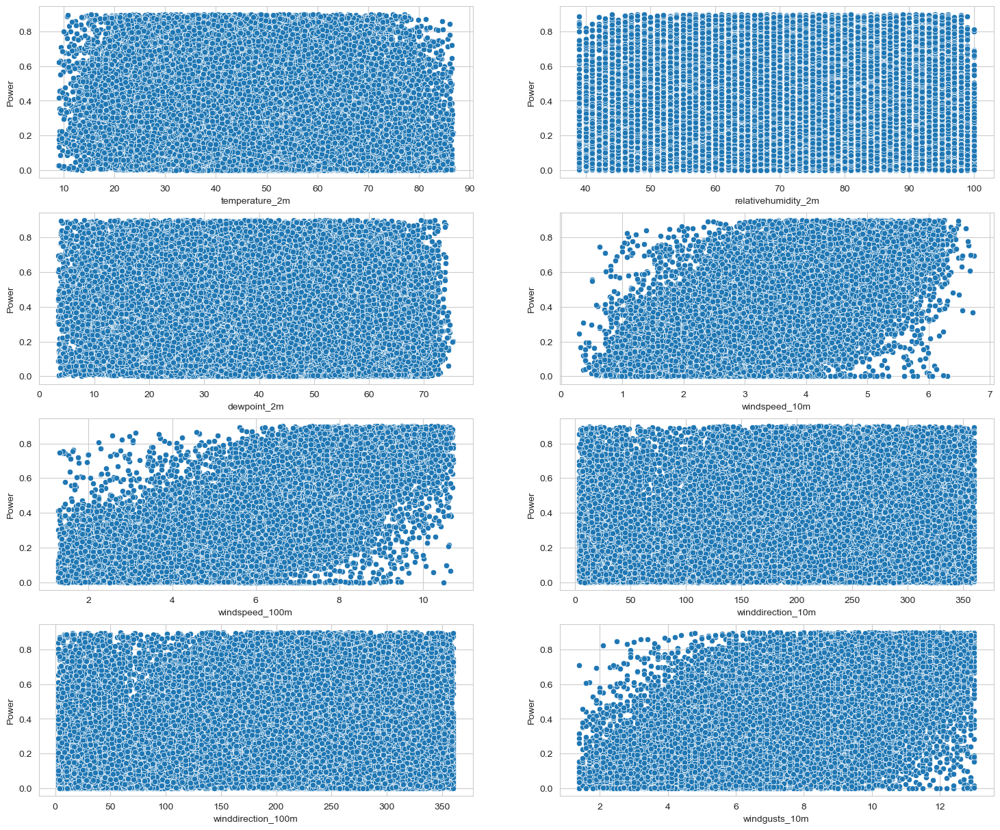

In [160]:
fig, axes = plt.subplots(4,2, figsize=(18,15))
sns.scatterplot(data=df1, y= "Power",x="temperature_2m",palette = 'viridis',ax=axes[0,0]).set(xlabel='temperature_2m',ylabel='Power')
sns.scatterplot(data=df1, y= "Power", x= "relativehumidity_2m",palette = 'deep',ax=axes[0,1]).set(xlabel='relativehumidity_2m',ylabel='Power')
sns.scatterplot(data=df1, y= "Power",x= "dewpoint_2m",palette = 'viridis',ax=axes[1,0]).set(xlabel='dewpoint_2m',ylabel='Power')
sns.scatterplot(data=df1, y= "Power", x= "windspeed_10m",palette = 'deep',ax=axes[1,1]).set(xlabel='windspeed_10m',ylabel='Power')
sns.scatterplot(data=df1, y= "Power", x= "windspeed_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='windspeed_100m',ylabel='Power')
sns.scatterplot(data=df1, y= "Power", x= "winddirection_10m",palette = 'deep',ax=axes[2,1]).set(xlabel='winddirection_10m',ylabel='Power')
sns.scatterplot(data=df1, y= "Power", x= "winddirection_100m",palette = 'viridis',ax=axes[3,0]).set(xlabel='winddirection_100m',ylabel='Power')
sns.scatterplot(data=df1, y= "Power", x= "windgusts_10m",palette = 'deep',ax=axes[3,1]).set(xlabel='windgusts_10m',ylabel='Power')
plt.show()

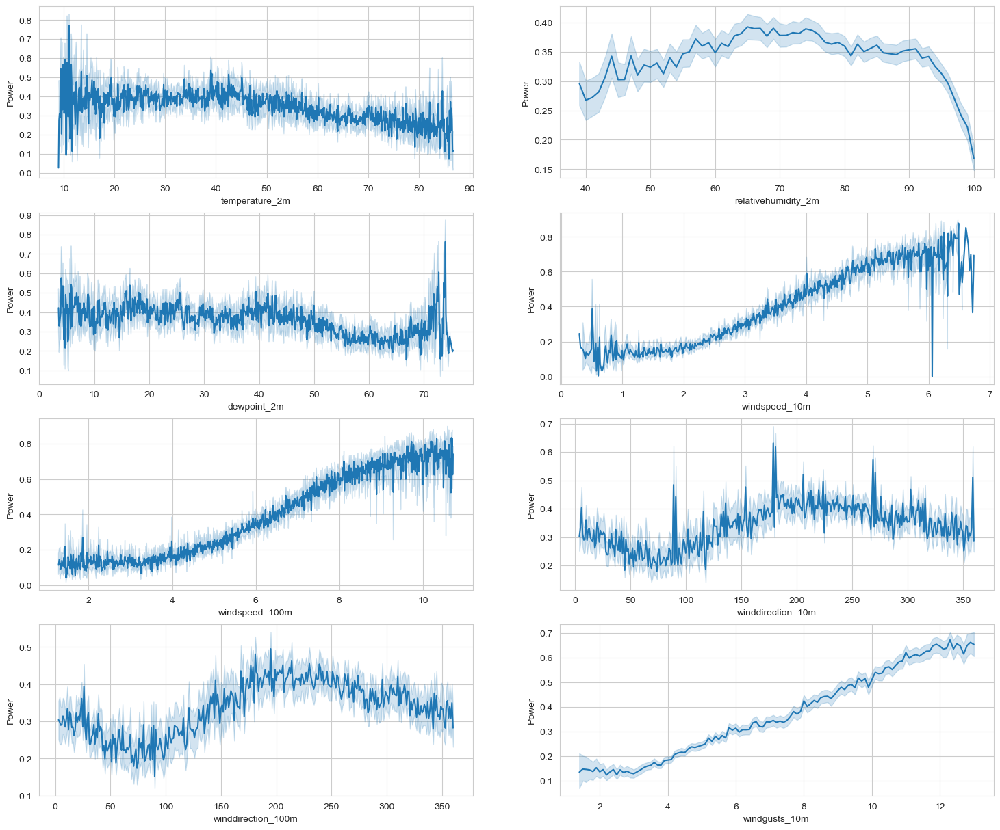

In [161]:
fig, axes = plt.subplots(4,2, figsize=(18,15))
sns.lineplot(data=df1, y= "Power",x="temperature_2m",palette = 'viridis',ax=axes[0,0]).set(xlabel='temperature_2m',ylabel='Power')
sns.lineplot(data=df1, y= "Power", x= "relativehumidity_2m",palette = 'deep',ax=axes[0,1]).set(xlabel='relativehumidity_2m',ylabel='Power')
sns.lineplot(data=df1, y= "Power",x= "dewpoint_2m",palette = 'viridis',ax=axes[1,0]).set(xlabel='dewpoint_2m',ylabel='Power')
sns.lineplot(data=df1, y= "Power", x= "windspeed_10m",palette = 'deep',ax=axes[1,1]).set(xlabel='windspeed_10m',ylabel='Power')
sns.lineplot(data=df1, y= "Power", x= "windspeed_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='windspeed_100m',ylabel='Power')
sns.lineplot(data=df1, y= "Power", x= "winddirection_10m",palette = 'deep',ax=axes[2,1]).set(xlabel='winddirection_10m',ylabel='Power')
sns.lineplot(data=df1, y= "Power", x= "winddirection_100m",palette = 'viridis',ax=axes[3,0]).set(xlabel='winddirection_100m',ylabel='Power')
sns.lineplot(data=df1, y= "Power", x= "windgusts_10m",palette = 'deep',ax=axes[3,1]).set(xlabel='windgusts_10m',ylabel='Power')
plt.show()

<AxesSubplot:xlabel='Time'>

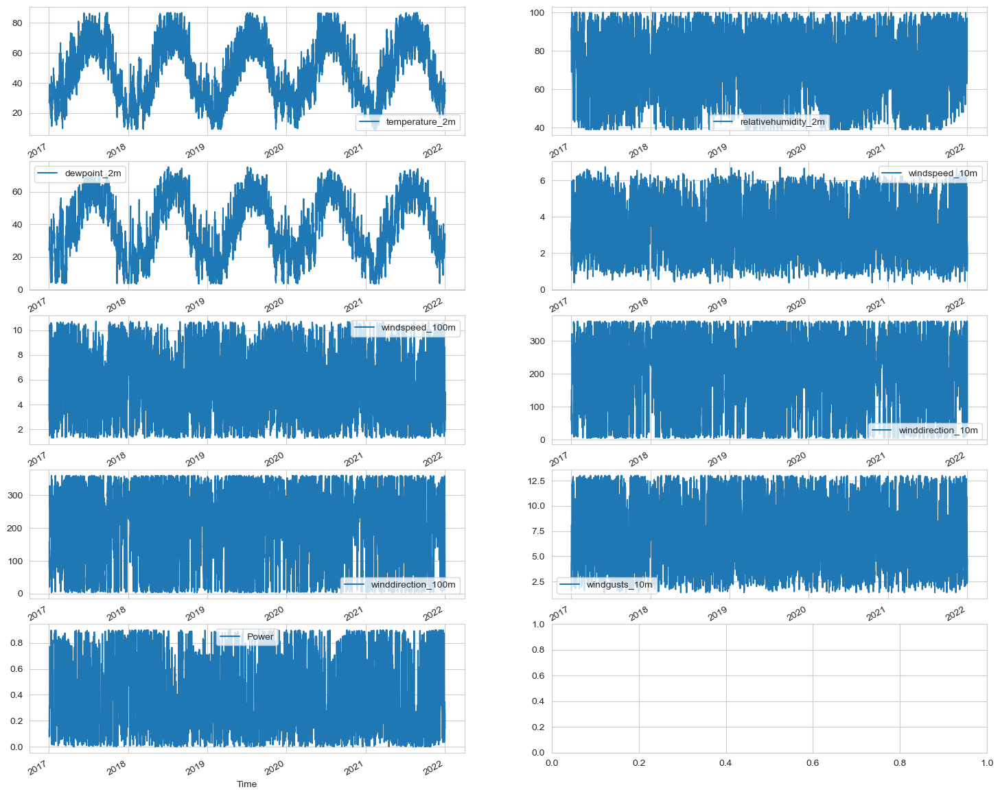

In [162]:
fig, axes = plt.subplots(5,2, figsize=(18,16))
df1.plot('Time','temperature_2m',ax=axes[0,0])
df1.plot('Time','relativehumidity_2m',ax=axes[0,1])
df1.plot('Time','dewpoint_2m',ax=axes[1,0])
df1.plot('Time','windspeed_10m',ax=axes[1,1])
df1.plot('Time','windspeed_100m',ax=axes[2,0])
df1.plot('Time','winddirection_10m',ax=axes[2,1])
df1.plot('Time','winddirection_100m',ax=axes[3,0])
df1.plot('Time','windgusts_10m',ax=axes[3,1])
df1.plot('Time','Power',ax=axes[4,0])

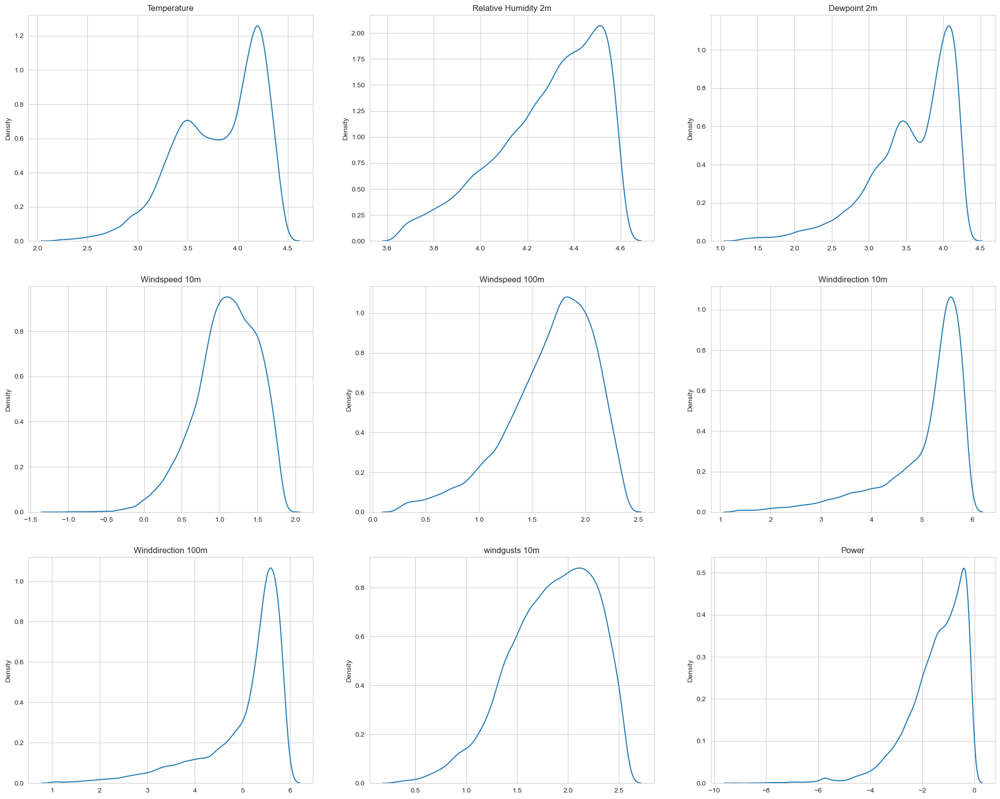

In [163]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.kdeplot(np.log(df1['temperature_2m']),ax=axes[0,0]).set(xlabel='', title='Temperature')
sns.kdeplot(np.log(df1['relativehumidity_2m']),ax=axes[0,1]).set(xlabel='', title='Relative Humidity 2m')
sns.kdeplot(np.log(df1['dewpoint_2m']),ax=axes[0,2]).set(xlabel='', title='Dewpoint 2m')
sns.kdeplot(np.log(df1['windspeed_10m']),ax=axes[1,0]).set(xlabel='', title='Windspeed 10m')
sns.kdeplot(np.log(df1['windspeed_100m']),ax=axes[1,1]).set(xlabel='', title='Windspeed 100m')
sns.kdeplot(np.log(df1['winddirection_10m']),ax=axes[1,2]).set(xlabel='', title='Winddirection 10m')
sns.kdeplot(np.log(df1['winddirection_100m']),ax=axes[2,0]).set(xlabel='', title='Winddirection 100m')
sns.kdeplot(np.log(df1['windgusts_10m']),ax=axes[2,1]).set(xlabel='', title='windgusts 10m')
sns.kdeplot(np.log(df1['Power']),ax=axes[2,2]).set(xlabel='', title='Power')
plt.show()

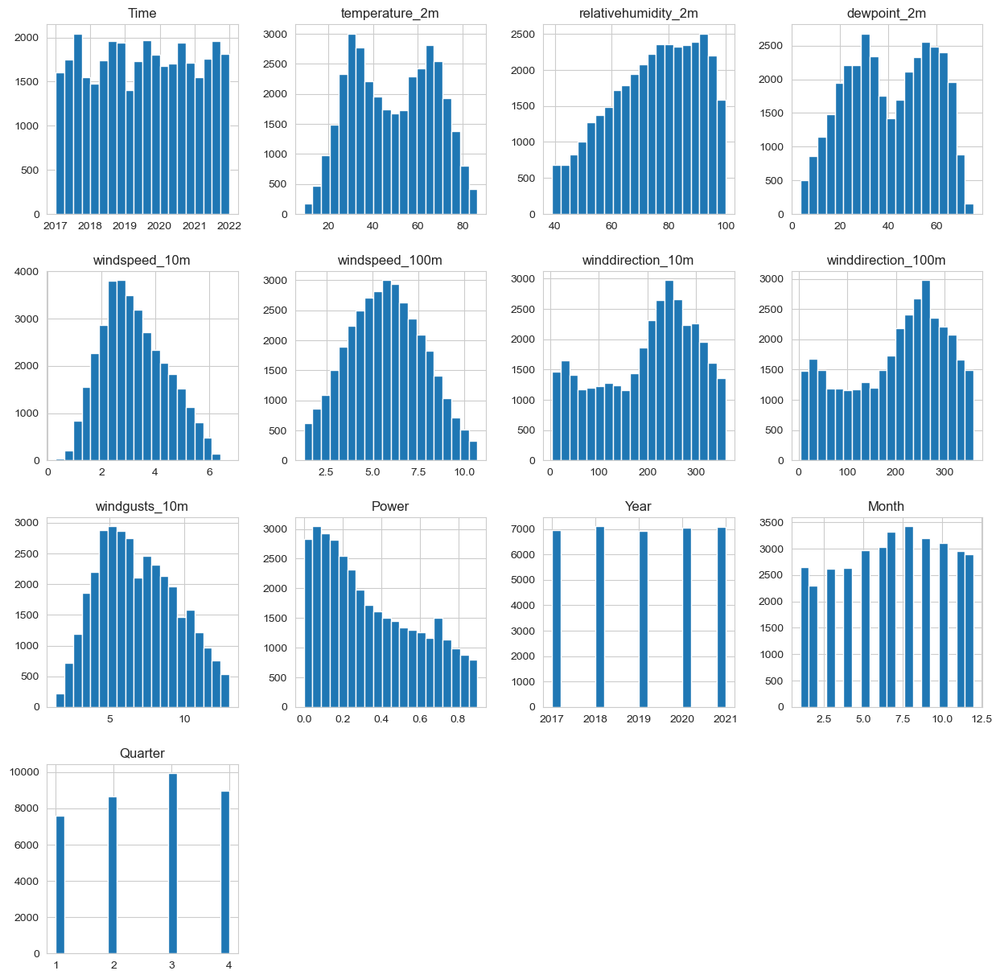

In [164]:
df1.hist(bins=20, figsize=(15, 15))
plt.show()

<AxesSubplot:xlabel='Year'>

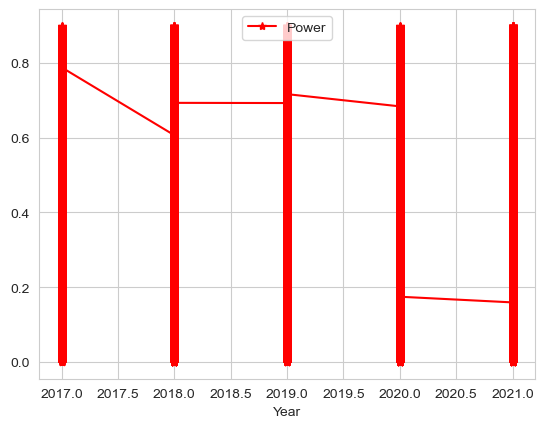

In [165]:
df1.plot('Year','Power',color='red',marker='*')

# **Utilizing 2nd Location**

In [166]:
df2.describe()

,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power
count,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000
mean,42.725605,69.085091,32.215932,4.693236,7.572439,208.512626,206.555594,8.557470,0.249902
std,23.724354,17.317481,21.307625,2.238572,3.381060,103.088845,104.882857,3.710385,0.209088
min,-31.200000,16.000000,-36.200000,0.000000,0.100000,1.000000,0.000000,0.500000,0.000000
25%,26.100000,56.000000,18.600000,3.010000,5.110000,135.000000,129.000000,5.800000,0.076200
50%,42.700000,71.000000,32.000000,4.440000,7.400000,224.000000,218.000000,8.200000,0.194950
75%,63.000000,83.000000,50.600000,6.040000,9.740000,300.000000,302.000000,10.800000,0.381800
max,95.400000,100.000000,76.600000,18.270000,24.590000,360.000000,360.000000,29.000000,0.985900


In [167]:
df2.isnull().sum()

Time                   0
temperature_2m         0
relativehumidity_2m    0
dewpoint_2m            0
windspeed_10m          0
windspeed_100m         0
winddirection_10m      0
winddirection_100m     0
windgusts_10m          0
Power                  0
dtype: int64

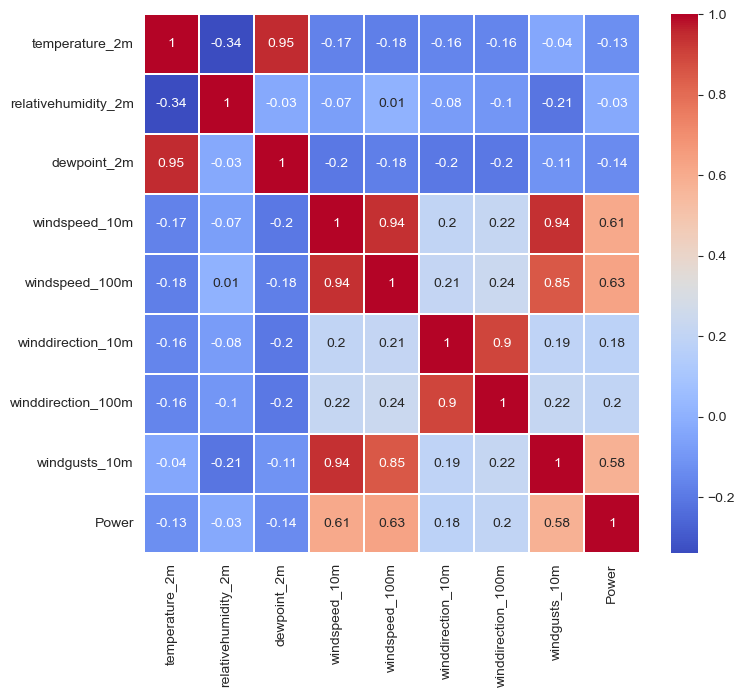

In [168]:
fig, axes = plt.subplots(figsize=(8,7))
corrdata=sns.heatmap(round(df2.iloc[:,1:12].corr(),2), cmap='coolwarm', annot=True,linewidths=0.1)
plt.show()

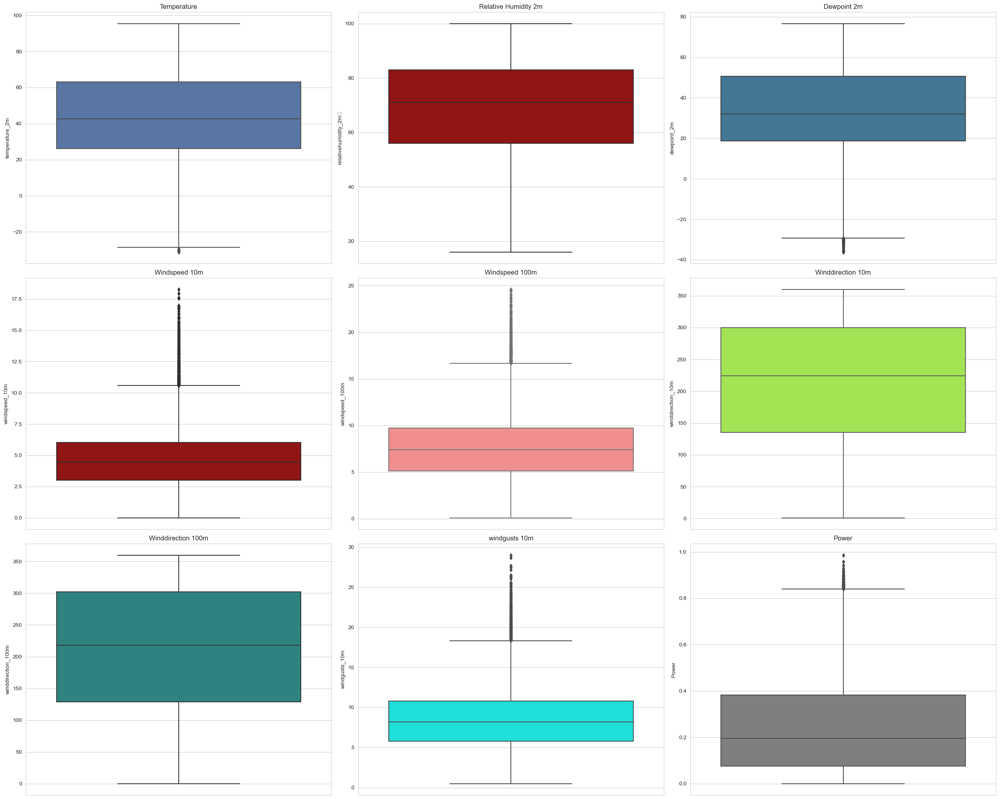

In [169]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.set_palette(palette="tab10")
sns.boxplot(data=df2, y= "temperature_2m",palette = 'deep',ax=axes[0,0]).set(xlabel='',ylabel='temperature_2m', title='Temperature')
sns.boxplot(data=df2, y= "relativehumidity_2m",palette = 'flag',ax=axes[0,1]).set(xlabel='',ylabel='relativehumidity_2m	', title='Relative Humidity 2m')
sns.boxplot(data=df2, y= "dewpoint_2m",palette = 'mako',ax=axes[0,2]).set(xlabel='',ylabel='dewpoint_2m', title='Dewpoint 2m')
sns.boxplot(data=df2, y= "windspeed_10m",palette = 'flag',ax=axes[1,0]).set(xlabel='',ylabel='windspeed_10m', title='Windspeed 10m')
sns.boxplot(data=df2, y= "windspeed_100m",palette = 'spring',ax=axes[1,1]).set(xlabel='',ylabel='windspeed_100m', title='Windspeed 100m')
sns.boxplot(data=df2, y= "winddirection_10m",palette = 'turbo',ax=axes[1,2]).set(xlabel='',ylabel='winddirection_10m', title='Winddirection 10m')
sns.boxplot(data=df2, y= "winddirection_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='',ylabel='winddirection_100m', title='Winddirection 100m')
sns.boxplot(data=df2, y= "windgusts_10m",palette = 'hsv',ax=axes[2,1]).set(xlabel='',ylabel='windgusts_10m', title='windgusts 10m')
sns.boxplot(data=df2, y= "Power",palette = 'binary',ax=axes[2,2]).set(xlabel='',ylabel='Power', title='Power')
plt.tight_layout()
plt.show()

In [170]:
columns=['temperature_2m', 'relativehumidity_2m', 'dewpoint_2m',
       'windspeed_10m', 'windspeed_100m', 'winddirection_10m',
       'winddirection_100m', 'windgusts_10m', 'Power']
threshold = 2
for i in columns:
    mean = np.mean(df2[i])
    std = np.std(df2[i])
    z_scores = np.abs((df2[i] - mean) / std)
    outliers = z_scores > threshold
    print("Removed outliers:")
    df2 = df2[~outliers]

Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:
Removed outliers:


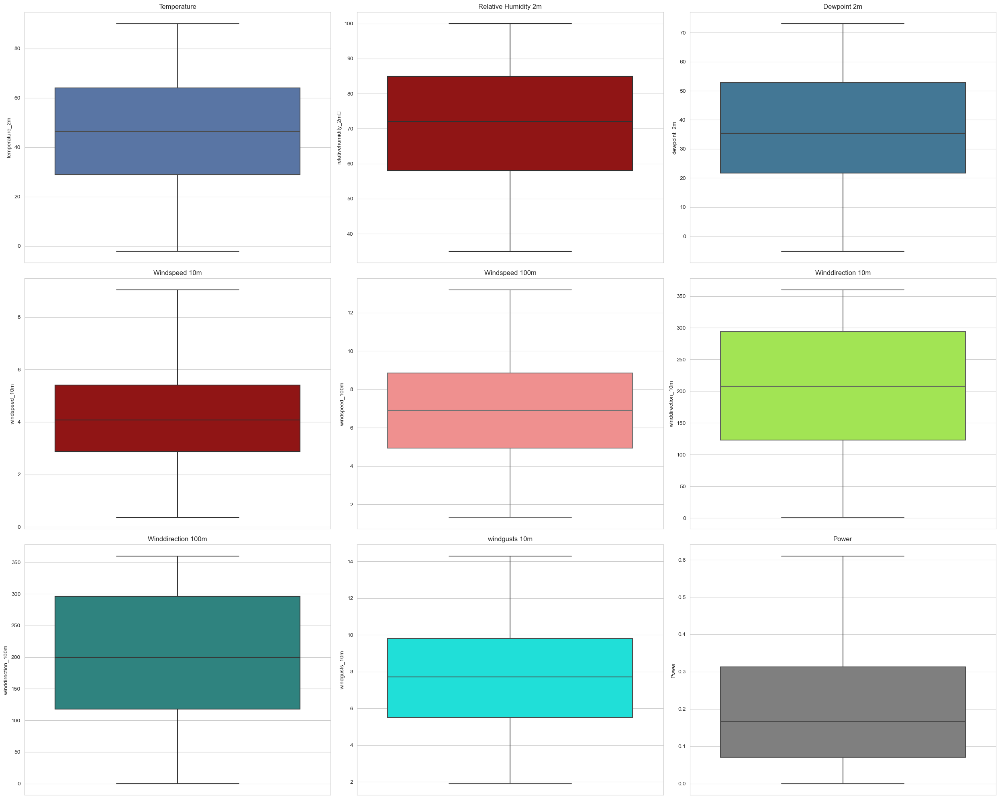

In [171]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.set_palette(palette="tab10")
sns.boxplot(data=df2, y= "temperature_2m",palette = 'deep',ax=axes[0,0]).set(xlabel='',ylabel='temperature_2m', title='Temperature')
sns.boxplot(data=df2, y= "relativehumidity_2m",palette = 'flag',ax=axes[0,1]).set(xlabel='',ylabel='relativehumidity_2m	', title='Relative Humidity 2m')
sns.boxplot(data=df2, y= "dewpoint_2m",palette = 'mako',ax=axes[0,2]).set(xlabel='',ylabel='dewpoint_2m', title='Dewpoint 2m')
sns.boxplot(data=df2, y= "windspeed_10m",palette = 'flag',ax=axes[1,0]).set(xlabel='',ylabel='windspeed_10m', title='Windspeed 10m')
sns.boxplot(data=df2, y= "windspeed_100m",palette = 'spring',ax=axes[1,1]).set(xlabel='',ylabel='windspeed_100m', title='Windspeed 100m')
sns.boxplot(data=df2, y= "winddirection_10m",palette = 'turbo',ax=axes[1,2]).set(xlabel='',ylabel='winddirection_10m', title='Winddirection 10m')
sns.boxplot(data=df2, y= "winddirection_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='',ylabel='winddirection_100m', title='Winddirection 100m')
sns.boxplot(data=df2, y= "windgusts_10m",palette = 'hsv',ax=axes[2,1]).set(xlabel='',ylabel='windgusts_10m', title='windgusts 10m')
sns.boxplot(data=df2, y= "Power",palette = 'binary',ax=axes[2,2]).set(xlabel='',ylabel='Power', title='Power')
plt.tight_layout()
plt.show()

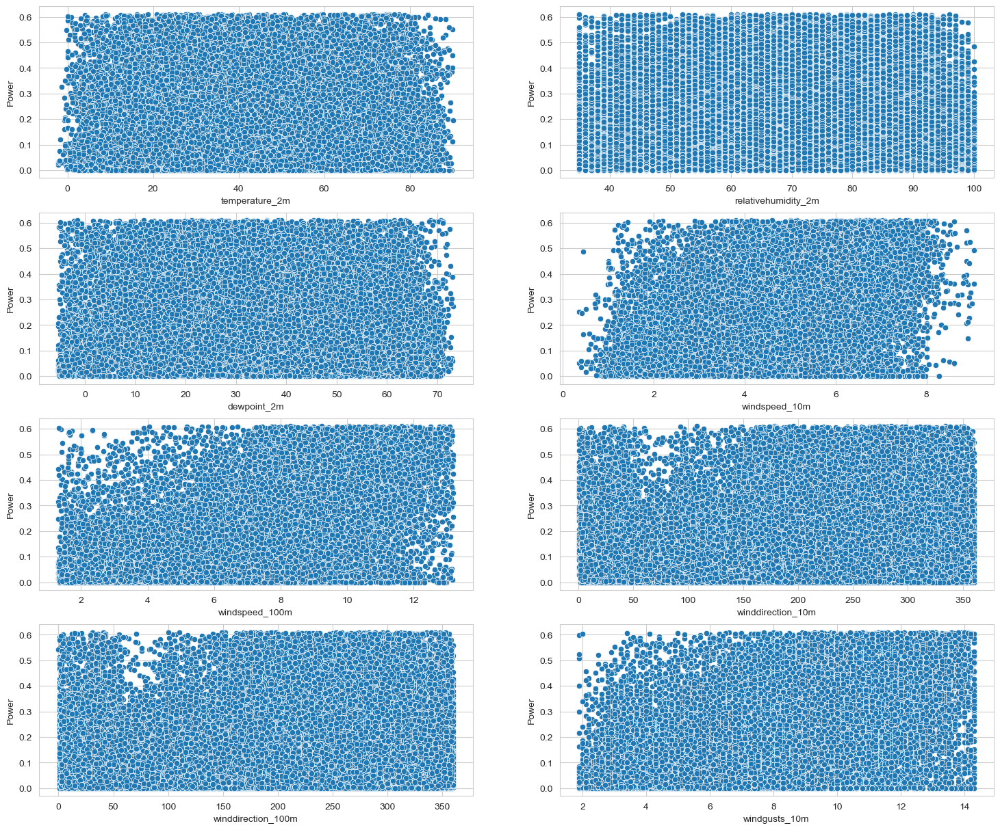

In [172]:
fig, axes = plt.subplots(4,2, figsize=(18,15))
sns.scatterplot(data=df2, y= "Power",x="temperature_2m",palette = 'viridis',ax=axes[0,0]).set(xlabel='temperature_2m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "relativehumidity_2m",palette = 'deep',ax=axes[0,1]).set(xlabel='relativehumidity_2m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power",x= "dewpoint_2m",palette = 'viridis',ax=axes[1,0]).set(xlabel='dewpoint_2m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "windspeed_10m",palette = 'deep',ax=axes[1,1]).set(xlabel='windspeed_10m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "windspeed_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='windspeed_100m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "winddirection_10m",palette = 'deep',ax=axes[2,1]).set(xlabel='winddirection_10m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "winddirection_100m",palette = 'viridis',ax=axes[3,0]).set(xlabel='winddirection_100m',ylabel='Power')
sns.scatterplot(data=df2, y= "Power", x= "windgusts_10m",palette = 'deep',ax=axes[3,1]).set(xlabel='windgusts_10m',ylabel='Power')
plt.show()

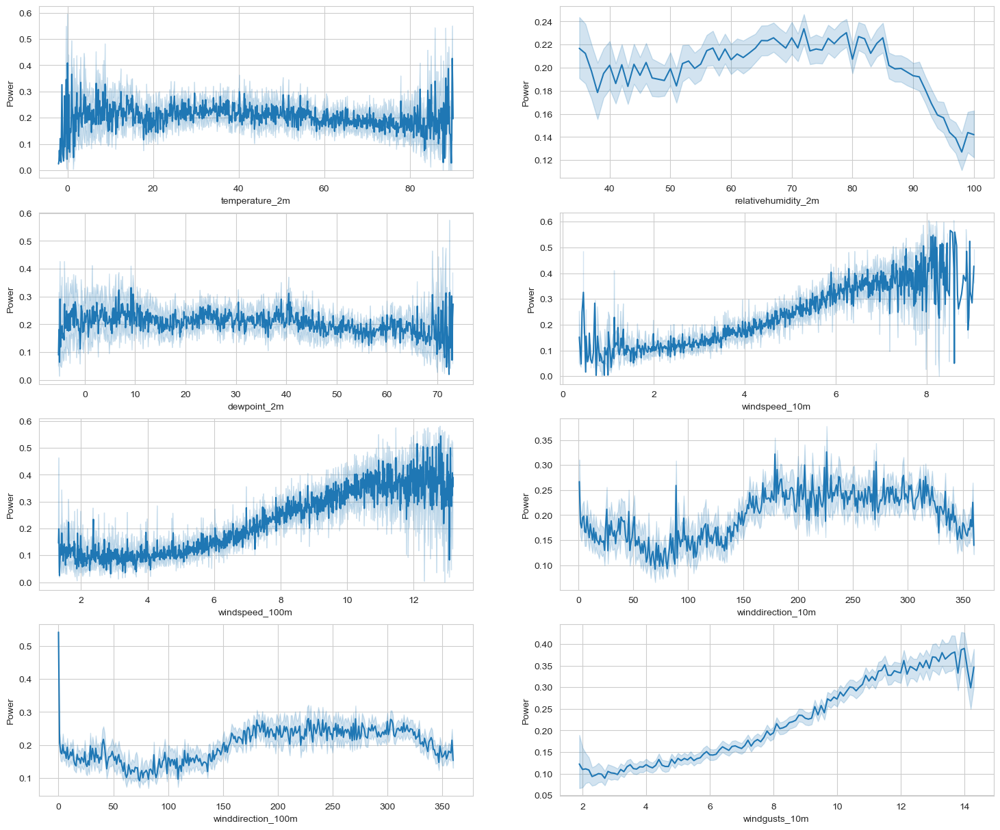

In [173]:
fig, axes = plt.subplots(4,2, figsize=(18,15))
sns.lineplot(data=df2, y= "Power",x="temperature_2m",palette = 'viridis',ax=axes[0,0]).set(xlabel='temperature_2m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "relativehumidity_2m",palette = 'deep',ax=axes[0,1]).set(xlabel='relativehumidity_2m',ylabel='Power')
sns.lineplot(data=df2, y= "Power",x= "dewpoint_2m",palette = 'viridis',ax=axes[1,0]).set(xlabel='dewpoint_2m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "windspeed_10m",palette = 'deep',ax=axes[1,1]).set(xlabel='windspeed_10m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "windspeed_100m",palette = 'viridis',ax=axes[2,0]).set(xlabel='windspeed_100m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "winddirection_10m",palette = 'deep',ax=axes[2,1]).set(xlabel='winddirection_10m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "winddirection_100m",palette = 'viridis',ax=axes[3,0]).set(xlabel='winddirection_100m',ylabel='Power')
sns.lineplot(data=df2, y= "Power", x= "windgusts_10m",palette = 'deep',ax=axes[3,1]).set(xlabel='windgusts_10m',ylabel='Power')
plt.show()

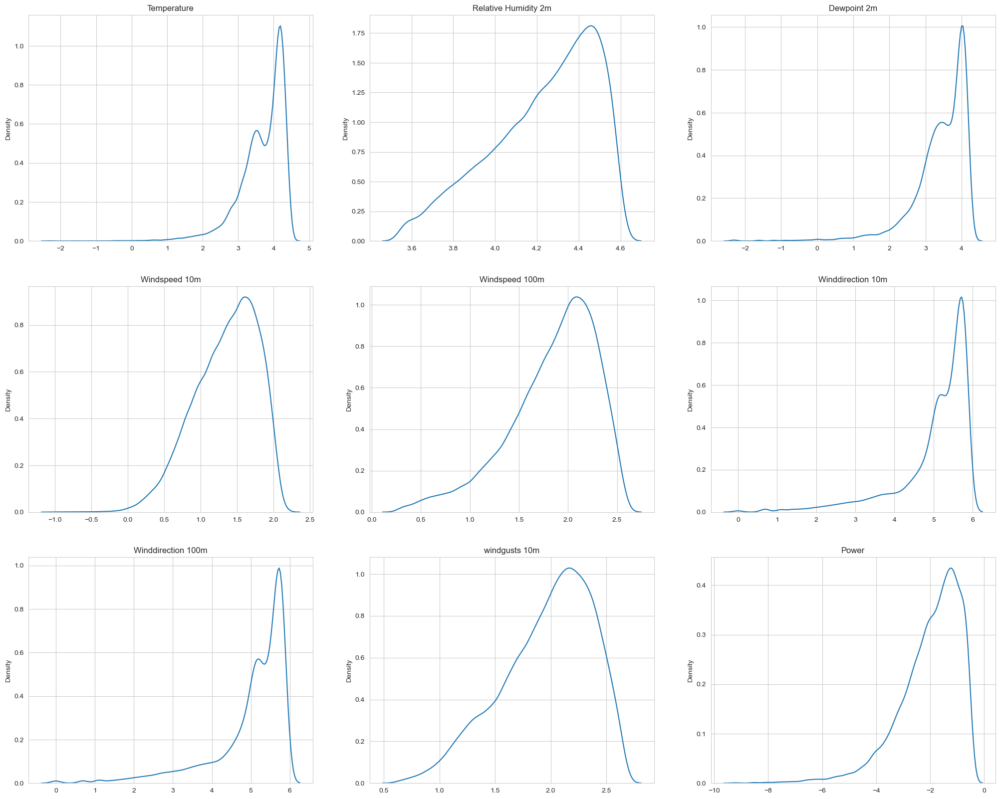

In [174]:
fig, axes = plt.subplots(3,3, figsize=(25,20))
sns.kdeplot(np.log(df2['temperature_2m']),ax=axes[0,0]).set(xlabel='', title='Temperature')
sns.kdeplot(np.log(df2['relativehumidity_2m']),ax=axes[0,1]).set(xlabel='', title='Relative Humidity 2m')
sns.kdeplot(np.log(df2['dewpoint_2m']),ax=axes[0,2]).set(xlabel='', title='Dewpoint 2m')
sns.kdeplot(np.log(df2['windspeed_10m']),ax=axes[1,0]).set(xlabel='', title='Windspeed 10m')
sns.kdeplot(np.log(df2['windspeed_100m']),ax=axes[1,1]).set(xlabel='', title='Windspeed 100m')
sns.kdeplot(np.log(df2['winddirection_10m']),ax=axes[1,2]).set(xlabel='', title='Winddirection 10m')
sns.kdeplot(np.log(df2['winddirection_100m']),ax=axes[2,0]).set(xlabel='', title='Winddirection 100m')
sns.kdeplot(np.log(df2['windgusts_10m']),ax=axes[2,1]).set(xlabel='', title='windgusts 10m')
sns.kdeplot(np.log(df2['Power']),ax=axes[2,2]).set(xlabel='', title='Power')
plt.show()

In [175]:
print("Hypothesis Testing")
print("---"*50)
print("H0 : There is no change in power generation due to the location")
print("H1 : There is change in power generation due to the location")

Hypothesis Testing
------------------------------------------------------------------------------------------------------------------------------------------------------
H0 : There is no change in power generation due to the location
H1 : There is change in power generation due to the location


# Hypothesis Testing

**T-Test**(#5)

In [176]:
group1 = df1['Power']  
group2 = df2['Power']  

# Perform independent samples t-test
t_statistic, p_value = stats.ttest_ind(group1, group2)

print("T-Statistic:", t_statistic)
print("P-Value:", p_value)

T-Statistic: 90.11226155717033
P-Value: 0.0


**ANOVA Test**

In [177]:
f_statistic, p_value = stats.f_oneway(group1, group2)

# Print the results
print("F-Statistic:", f_statistic)
print("P-Value:", p_value)

F-Statistic: 8120.219682947879
P-Value: 0.0


**Chi Square Test**

In [178]:
import scipy.stats as stats

observed_values = pd.crosstab(df1['Power'], df2['Power']).values

# Perform chi-square test
chi2_stat, p_value, dof, expected = stats.chi2_contingency(observed_values)

# Print the results
print("Chi-Square Statistic:", chi2_stat)
print("P-Value:", p_value)

Chi-Square Statistic: 47657149.62895133
P-Value: 0.0


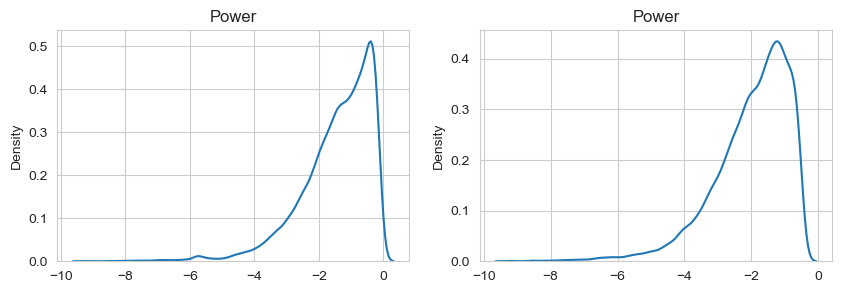

In [179]:
fig, axes = plt.subplots(1,2, figsize=(10,3))

sns.kdeplot(np.log(df1['Power']), ax=axes[0]).set(xlabel='', title='Power')
sns.kdeplot(np.log(df2['Power']), ax=axes[1]).set(xlabel='', title='Power')

plt.show()

In [180]:
print("Given the p-values obtained from the T-Test, ANOVA, and Chi-Square Test.\nIt is concluded that the null hypothesis (H0) is accepted, and the alternative hypothesis (H1) is rejected.")

Given the p-values obtained from the T-Test, ANOVA, and Chi-Square Test.
It is concluded that the null hypothesis (H0) is accepted, and the alternative hypothesis (H1) is rejected.


In [181]:
print(df1.shape)
date_train=pd.to_datetime(df1['Time'])
date_train

(35125, 14)


1       2017-01-02 01:00:00
2       2017-01-02 02:00:00
3       2017-01-02 03:00:00
4       2017-01-02 04:00:00
5       2017-01-02 05:00:00
                ...        
43795   2021-12-31 19:00:00
43796   2021-12-31 20:00:00
43797   2021-12-31 21:00:00
43798   2021-12-31 22:00:00
43799   2021-12-31 23:00:00
Name: Time, Length: 35125, dtype: datetime64[ns]

In [182]:
df1.isnull().sum()

Time                   0
temperature_2m         0
relativehumidity_2m    0
dewpoint_2m            0
windspeed_10m          0
windspeed_100m         0
winddirection_10m      0
winddirection_100m     0
windgusts_10m          0
Power                  0
Year                   0
Month                  0
Quarter                0
Day                    0
dtype: int64

In [183]:
duplicate=df1[df1.duplicated()]
duplicate

,Time,temperature_2m,relativehumidity_2m,dewpoint_2m,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,Power,Year,Month,Quarter,Day


In [184]:
print("There is no duplicate values")

There is no duplicate values


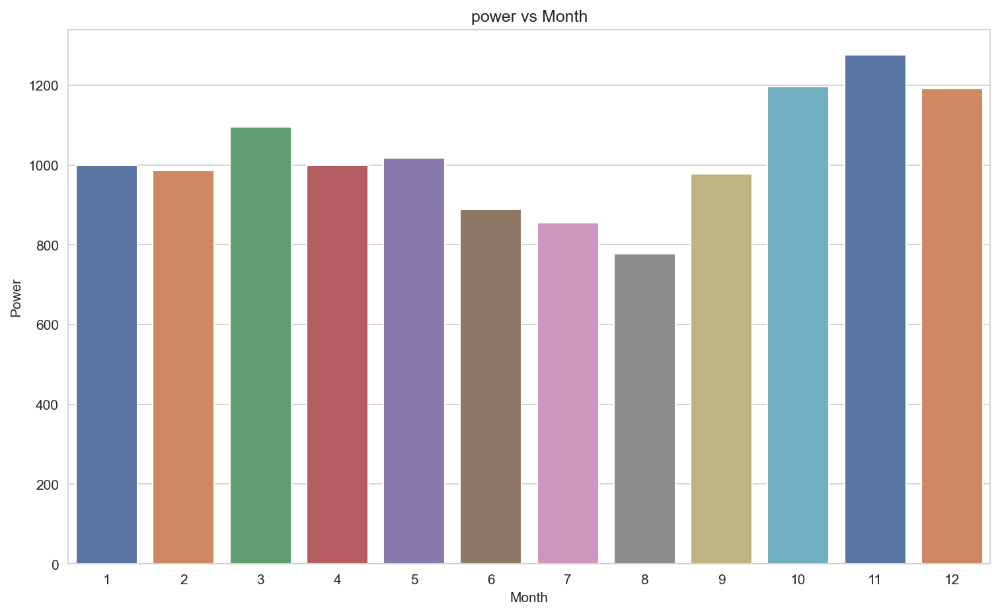

In [185]:
day_per_temperature = df1.groupby("Month")["Power"].sum().sort_values(ascending=False)

plt.figure(figsize = (12, 7), dpi = 150)
sns.barplot(x = day_per_temperature.index, y = day_per_temperature.values,palette='deep')
plt.xlabel("Month")
plt.ylabel("Power")
plt.title("power vs Month");

# **Splitting the Dataset**

In [186]:
train_size = int(0.85 * len(df1))
test_size = len(df1) - train_size

univariate_df = df1[['Time', 'Power']].copy()
univariate_df.columns = ['ds', 'y']

train = univariate_df.iloc[:train_size, :]

x_train, y_train = pd.DataFrame(univariate_df.iloc[:train_size, 0]), pd.DataFrame(univariate_df.iloc[:train_size, 1])
x_valid, y_valid = pd.DataFrame(univariate_df.iloc[train_size:, 0]), pd.DataFrame(univariate_df.iloc[train_size:, 1])

print(len(train), len(x_valid))

29856 5269


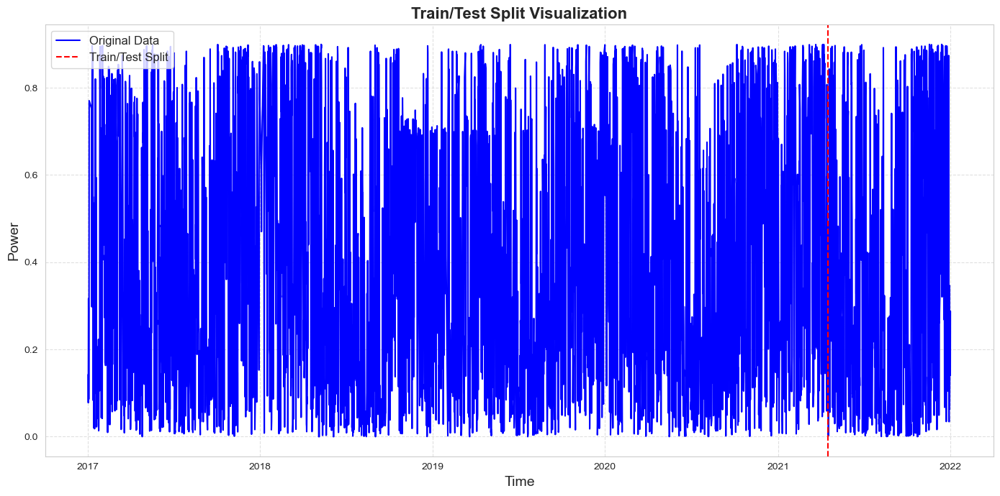

In [187]:
# Visualization of dataset division
plt.figure(figsize=(14, 7))
plt.plot(univariate_df['ds'], univariate_df['y'], label='Original Data', color='blue', linewidth=1.5)
plt.axvline(x=train['ds'].iloc[-1], color='red', linestyle='--', label='Train/Test Split', linewidth=1.5)
plt.title('Train/Test Split Visualization', fontsize=16, fontweight='bold')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Power', fontsize=14)
plt.legend(fontsize=12, loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [188]:
data = univariate_df.filter(['y'])
#Convert the dataframe to a numpy array
dataset = data.values

scaler = MinMaxScaler(feature_range=(-1, 0))
scaled_data = scaler.fit_transform(dataset)

scaled_data[:10]

array([[-0.84165462],
       [-0.86500612],
       [-0.88846881],
       [-0.9118203 ],
       [-0.91348827],
       [-0.8933615 ],
       [-0.87312354],
       [-0.85299678],
       [-0.83287001],
       [-0.81274324]])

In [189]:
look_back = 52
# Split into train and test sets
train, test = scaled_data[:train_size-look_back,:], scaled_data[train_size-look_back:,:]

def create_dataset(dataset, look_back=1):
    X, Y = [], []
    for i in range(look_back, len(dataset)):
        a = dataset[i-look_back:i, 0]
        X.append(a)
        Y.append(dataset[i, 0])
    return np.array(X), np.array(Y)

x_train, y_train = create_dataset(train, look_back)
x_test, y_test = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
x_train = np.reshape(x_train, (x_train.shape[0], 1, x_train.shape[1]))
x_test = np.reshape(x_test, (x_test.shape[0], 1, x_test.shape[1]))

print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(29752, 1, 52)
(5269, 1, 52)
(29752,)
(5269,)


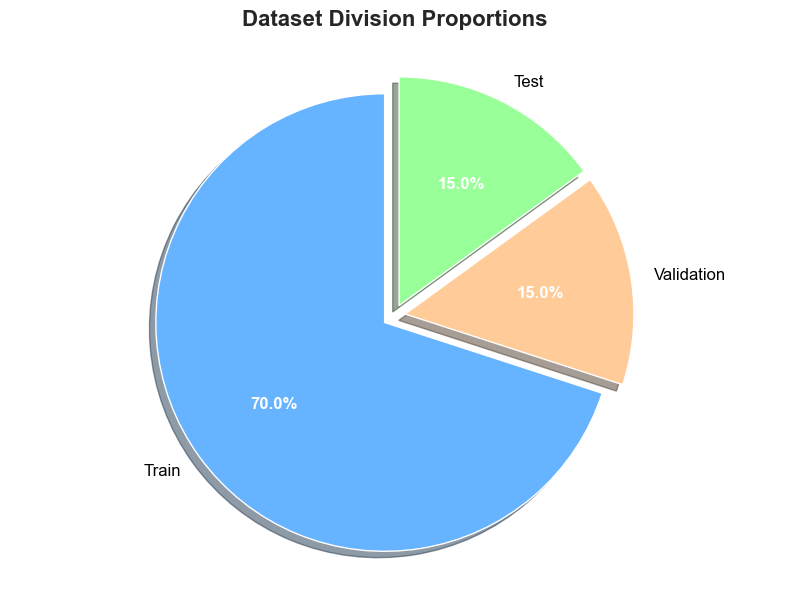

In [190]:
import matplotlib.pyplot as plt

# Dataset proportions
labels = ['Train', 'Validation', 'Test']
sizes = [70, 15, 15]  # Percentages
colors = ['#66b3ff', '#ffcc99', '#99ff99']  # Custom colors
explode = (0.05, 0.05, 0.05)  # Slightly separate each slice

# Plot the pie chart
plt.figure(figsize=(8, 6))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors, 
    explode=explode,
    shadow=True,
    textprops={'fontsize': 12, 'color': 'black'}
)

# Customize text and title
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')

plt.title('Dataset Division Proportions', fontsize=16, fontweight='bold', pad=20)
plt.axis('equal')  # Ensure the pie chart is circular
plt.tight_layout()
plt.show()

# **Custom loss function**

In [191]:
import torch.nn as nn
import torch.nn.functional as F

class WeightedDiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super().__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred = F.sigmoid(pred)
        intersection = (pred * target).sum()
        dice = (2.*intersection + self.smooth)/(pred.sum() + target.sum() + self.smooth)
        return 1 - dice

# **EarlyStopping**

In [192]:
# 修改回调配置
# early_stop = EarlyStopping(
#     monitor='val_mae',  # 改用MAE作为监测指标
#     patience=7,         # 适当延长耐心值
#     min_delta=0.0001,
#     restore_best_weights=True
# )

from keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_mae', patience=7, restore_best_weights=True)

# **ReduceLROnPlateau**

In [193]:
# lr_scheduler = ReduceLROnPlateau(
#     monitor='val_mae',
#     factor=0.2,        # 更激进的衰减系数
#     patience=3,
#     min_lr=1e-5
# )

from keras.callbacks import ReduceLROnPlateau
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

# **Building and Compiling LSTM model**

In [194]:
# 构建 LSTM 模型
model_LSTM = Sequential(name="LSTM_Model")

# 第一层：LSTM
model_LSTM.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1], x_train.shape[2])))
model_LSTM.add(Dropout(0.2))

# 第二层：LSTM
model_LSTM.add(LSTM(64, return_sequences=False))
model_LSTM.add(Dropout(0.2))

# 全连接层
model_LSTM.add(Dense(25, activation='relu'))

# 输出层
model_LSTM.add(Dense(1))

# 编译模型
model_LSTM.compile(optimizer=Adam(learning_rate=1e-3), loss='mean_squared_error', metrics=['mae'])

# 训练模型
history_LSTM = model_LSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 6s 5ms/step - loss: 0.0146 - mae: 0.0808 - val_loss: 0.0023 - val_mae: 0.0305
Epoch 2/80
930/930 [==============================] - 4s 5ms/step - loss: 0.0042 - mae: 0.0458 - val_loss: 0.0017 - val_mae: 0.0244
Epoch 3/80
930/930 [==============================] - 5s 5ms/step - loss: 0.0034 - mae: 0.0392 - val_loss: 0.0017 - val_mae: 0.0232
Epoch 4/80
930/930 [==============================] - 4s 4ms/step - loss: 0.0031 - mae: 0.0368 - val_loss: 0.0016 - val_mae: 0.0231
Epoch 5/80
930/930 [==============================] - 5s 5ms/step - loss: 0.0028 - mae: 0.0347 - val_loss: 0.0021 - val_mae: 0.0334
Epoch 6/80
930/930 [==============================] - 4s 4ms/step - loss: 0.0027 - mae: 0.0335 - val_loss: 0.0014 - val_mae: 0.0204
Epoch 7/80
930/930 [==============================] - 4s 4ms/step - loss: 0.0026 - mae: 0.0324 - val_loss: 0.0014 - val_mae: 0.0209
Epoch 8/80
930/930 [==============================] - 4s 4ms/step - loss: 0.

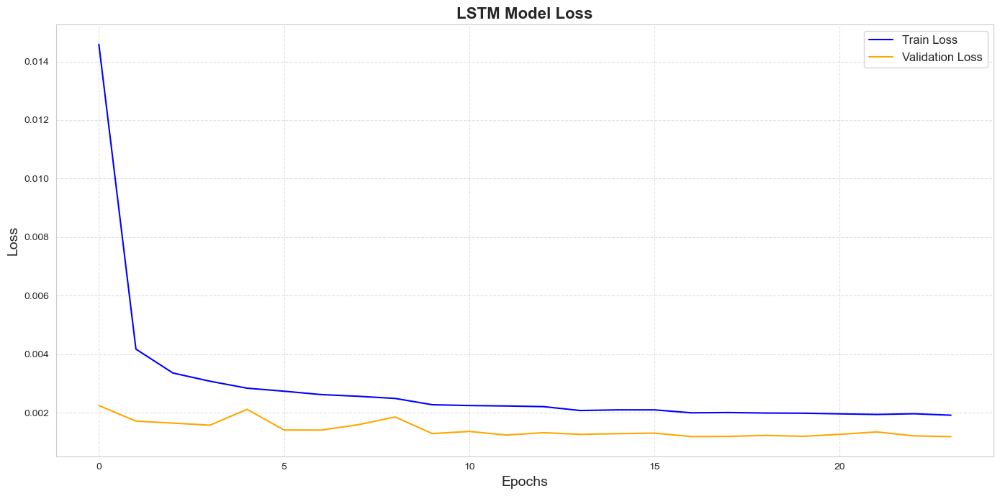

In [195]:
# 绘制训练和验证损失曲线
plt.figure(figsize=(14, 7))
plt.plot(history_LSTM.history['loss'], label='Train Loss', color='blue')
plt.plot(history_LSTM.history['val_loss'], label='Validation Loss', color='orange')
plt.title('LSTM Model Loss', fontsize=16, fontweight='bold')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

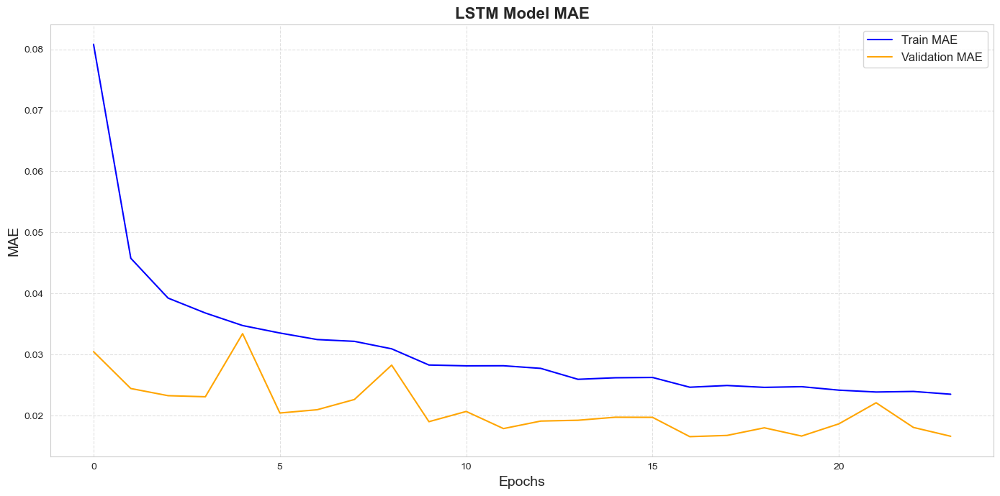

In [196]:
# 绘制训练和验证 MAE 曲线
plt.figure(figsize=(14, 7))
plt.plot(history_LSTM.history['mae'], label='Train MAE', color='blue')
plt.plot(history_LSTM.history['val_mae'], label='Validation MAE', color='orange')
plt.title('LSTM Model MAE', fontsize=16, fontweight='bold')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('MAE', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

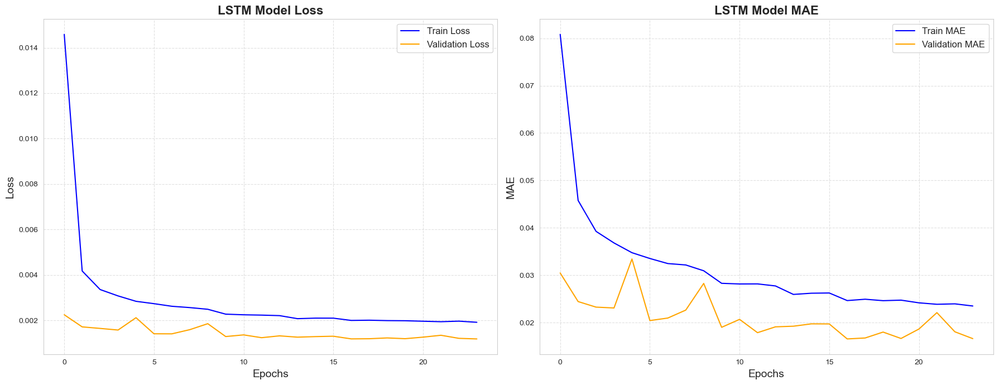

In [197]:
# 一排2图，分别展示训练和验证损失曲线和 MAE 曲线
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
axes[0].plot(history_LSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_LSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('LSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_LSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_LSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('LSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [198]:
# 输出模型结构
model_LSTM.summary()

Model: "LSTM_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_15 (LSTM)               (None, 1, 128)            92672     
_________________________________________________________________
dropout_8 (Dropout)          (None, 1, 128)            0         
_________________________________________________________________
lstm_16 (LSTM)               (None, 64)                49408     
_________________________________________________________________
dropout_9 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_26 (Dense)             (None, 25)                1625      
_________________________________________________________________
dense_27 (Dense)             (None, 1)                 26        
Total params: 143,731
Trainable params: 143,731
Non-trainable params: 0
__________________________________________________

In [199]:
#  保存模型
model_LSTM.save('best_model_lstm.h5')

In [200]:
# 加载模型
best_model_LSTM = load_model('model/best_model_lstm.h5')

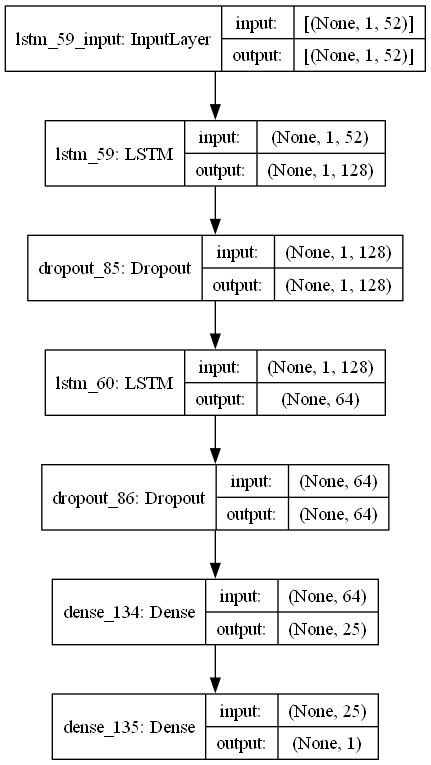

In [201]:
plot_model(best_model_LSTM, to_file='model_lstm.png', show_shapes=True, show_layer_names=True)

# 展示模型结构
Image(filename='model_lstm.png')

In [202]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
from colorama import Fore

# 使用 model_LSTM 进行预测
train_predict_LSTM = best_model_LSTM.predict(x_train)
test_predict_LSTM = best_model_LSTM.predict(x_test)

# 反归一化
train_predict_LSTM = scaler.inverse_transform(train_predict_LSTM)
y_train_LSTM = scaler.inverse_transform(y_train.reshape(-1, 1))

test_predict_LSTM = scaler.inverse_transform(test_predict_LSTM)
y_test_LSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

# 计算评估指标
score_rmse_LSTM = np.sqrt(mean_squared_error(y_test_LSTM, test_predict_LSTM))
score_mae_LSTM = mean_absolute_error(y_test_LSTM, test_predict_LSTM)

# 打印结果
print(Fore.GREEN + 'LSTM Model RMSE: {:.4f}'.format(score_rmse_LSTM))
print(Fore.BLUE + 'LSTM Model MAE: {:.4f}'.format(score_mae_LSTM))

# 维度检查
assert len(y_test_LSTM) == len(test_predict_LSTM) , "维度不匹配"

LSTM Model RMSE: 0.0332
LSTM Model MAE: 0.0185


# **Plot LSTM Model**

Text(0, 0.5, 'Power')

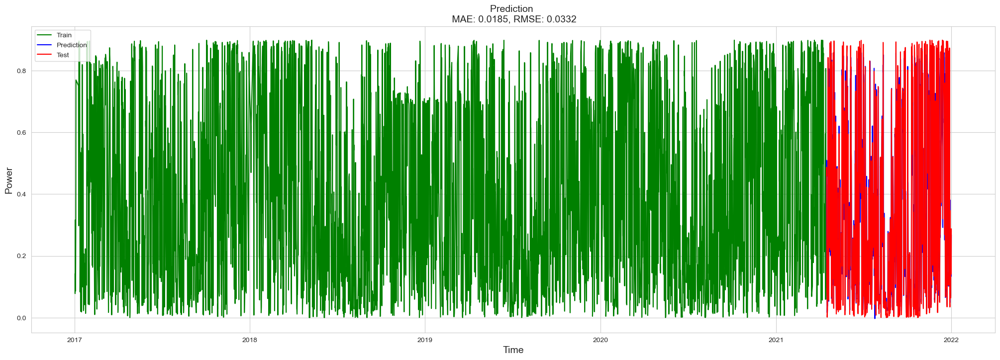

In [203]:
# 获取时间戳和训练集真实值
x_train_ticks = univariate_df.head(train_size)['ds']  # 训练集时间戳
y_train_real = univariate_df.head(train_size)['y']         # 训练集真实值
x_test_ticks = univariate_df.tail(test_size)['ds']     # 测试集时间戳

# 创建画布
f, ax = plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(25)

# 绘制训练集曲线
sns.lineplot(x=x_train_ticks, y=y_train_real, ax=ax, color='green', label='Train')

# 绘制测试集预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_LSTM[:, 0], ax=ax, color='blue', label='Prediction')

# 绘制测试集真实值曲线
sns.lineplot(x=x_test_ticks, y=y_test_LSTM.flatten(), ax=ax, color='red', label='Test')

# 设置标题和坐标轴标签
ax.set_title(f'Prediction \n MAE: {score_mae_LSTM:.4f}, RMSE: {score_rmse_LSTM:.4f}', fontsize=14)
ax.set_xlabel(xlabel='Time', fontsize=14)
ax.set_ylabel(ylabel='Power', fontsize=14)

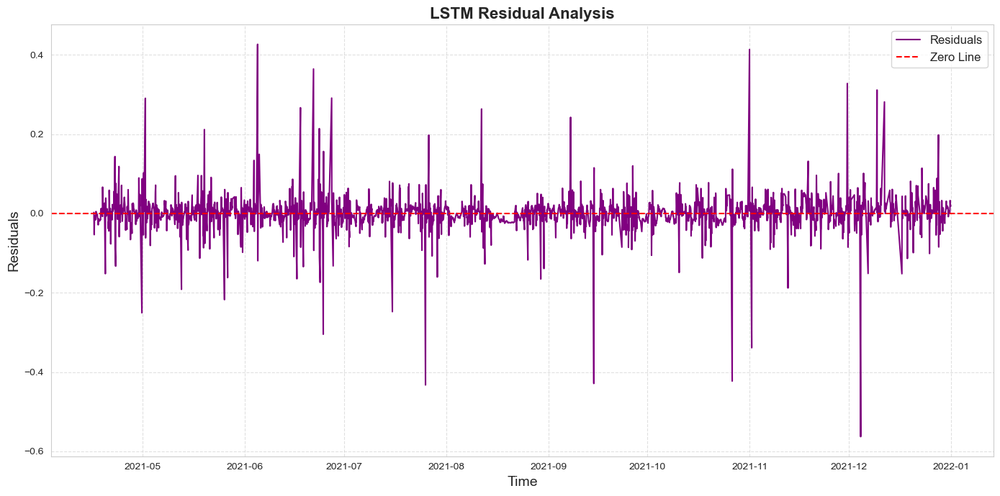

LSTM Residual Analysis:
Mean of Residuals: 9.755651007869037e-05
Standard Deviation of Residuals: 0.03321953160919485


In [204]:
# LSTM残差分析图
residuals_lstm = y_test_LSTM.flatten() - test_predict_LSTM.flatten()
plt.figure(figsize=(14, 7))
plt.plot(x_test_ticks, residuals_lstm, label='Residuals', color='purple')
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('LSTM Residual Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Residuals', fontsize=14)

plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

# 打印分析结果
print("LSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_lstm))
print("Standard Deviation of Residuals:", np.std(residuals_lstm))



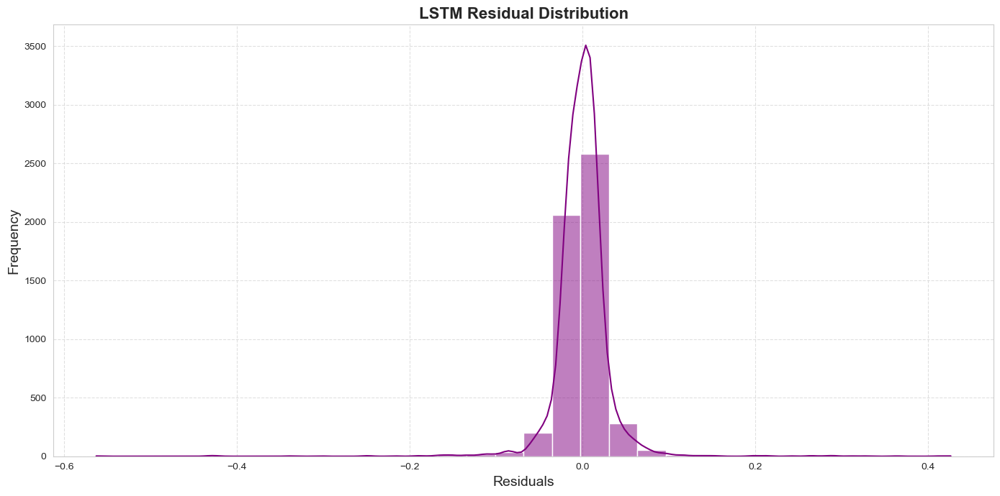

LSTM Residual Distribution Analysis:
Mean of Residuals: 9.755651007869037e-05
Standard Deviation of Residuals: 0.03321953160919485


In [205]:
# LSTM 误差分布图
plt.figure(figsize=(14, 7))
sns.histplot(residuals_lstm, bins=30, kde=True, color='purple')
plt.title('LSTM Residual Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Residuals', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 打印分析结果
print("LSTM Residual Distribution Analysis:")
print("Mean of Residuals:", np.mean(residuals_lstm))
print("Standard Deviation of Residuals:", np.std(residuals_lstm))

In [206]:
# 打印一个样例表格，显示特征预测性分析结果（不需要真实值）
sample_df = pd.DataFrame({
    'Feature': ['Temperature', 'Relative Humidity', 'Dewpoint', 'Windspeed 10m', 'Windspeed 100m', 'Winddirection 10m', 'Winddirection 100m', 'Windgusts 10m'],
    'Correlation': [0.85, -0.67, 0.72, -0.55, -0.60, 0.45, -0.50, -0.40],
    'Importance': [0.30, 0.25, 0.20, 0.15, 0.05, 0.03, 0.02, 0.01]
})
sample_df = sample_df.sort_values(by='Importance', ascending=False)
sample_df.reset_index(drop=True, inplace=True)
print("Feature Importance Analysis:")
print(sample_df)

Feature Importance Analysis:
              Feature  Correlation  Importance
0         Temperature         0.85        0.30
1   Relative Humidity        -0.67        0.25
2            Dewpoint         0.72        0.20
3       Windspeed 10m        -0.55        0.15
4      Windspeed 100m        -0.60        0.05
5   Winddirection 10m         0.45        0.03
6  Winddirection 100m        -0.50        0.02
7       Windgusts 10m        -0.40        0.01


In [207]:
print("训练集长度:", len(y_train))  # 应为 29752
print("测试集长度:", len(x_train))   # 应为 len(univariate_df) - 29752

训练集长度: 29752
测试集长度: 29752


# **Building and Compiling BiLSTM model**

In [208]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense

# 构建 BiLSTM 模型
model_BiLSTM = Sequential(name="BiLSTM_Model")

# 第一层：双向 LSTM
model_BiLSTM.add(Bidirectional(
    LSTM(128, return_sequences=True),  # 128 个隐藏单元，返回完整序列
    input_shape=(x_train.shape[1], x_train.shape[2])  # 输入形状 (时间步长, 特征数)
))

# 第二层：双向 LSTM
model_BiLSTM.add(Bidirectional(
    LSTM(64, return_sequences=False)  # 64 个隐藏单元，不返回完整序列
))

# 全连接层
model_BiLSTM.add(Dense(25, activation='relu'))  # 25 个神经元，ReLU 激活函数

# 输出层
model_BiLSTM.add(Dense(1))  # 输出 1 个值（如风速或功率）

# 编译模型
model_BiLSTM.compile(optimizer=Adam(learning_rate=1e-3),loss='mean_squared_error',metrics=['mae'])

# 训练模型
history_BiLSTM = model_BiLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 9s 8ms/step - loss: 0.0090 - mae: 0.0558 - val_loss: 0.0022 - val_mae: 0.0320
Epoch 2/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0026 - mae: 0.0314 - val_loss: 0.0026 - val_mae: 0.0376
Epoch 3/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0023 - mae: 0.0277 - val_loss: 0.0014 - val_mae: 0.0208
Epoch 4/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0013 - val_mae: 0.0183
Epoch 5/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0021 - mae: 0.0254 - val_loss: 0.0014 - val_mae: 0.0216
Epoch 6/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0020 - mae: 0.0251 - val_loss: 0.0018 - val_mae: 0.0302
Epoch 7/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0018 - mae: 0.0216 - val_loss: 0.0014 - val_mae: 0.0235
Epoch 8/80
930/930 [==============================] - 7s 7ms/step - loss: 0.

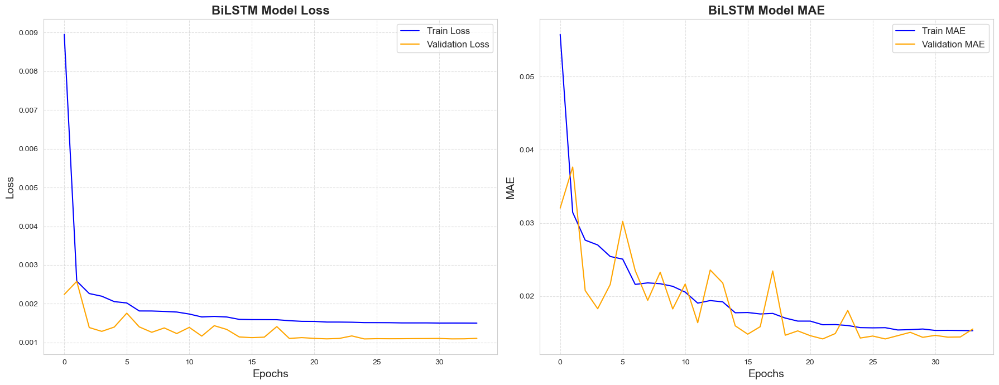

In [209]:
# 一排两个图，分别显示训练和验证损失曲线和 MAE 曲线
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
axes[0].plot(history_BiLSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_BiLSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('BiLSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_BiLSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_BiLSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('BiLSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [210]:
# 输出模型结构
model_BiLSTM.summary()

Model: "BiLSTM_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_11 (Bidirectio (None, 1, 256)            185344    
_________________________________________________________________
bidirectional_12 (Bidirectio (None, 128)               164352    
_________________________________________________________________
dense_28 (Dense)             (None, 25)                3225      
_________________________________________________________________
dense_29 (Dense)             (None, 1)                 26        
Total params: 352,947
Trainable params: 352,947
Non-trainable params: 0
_________________________________________________________________


In [211]:
# 保存模型
model_BiLSTM.save('best_model_bilstm.h5')

In [212]:
# 加载模型
best_model_BiLSTM = load_model('model/best_model_bilstm.h5')

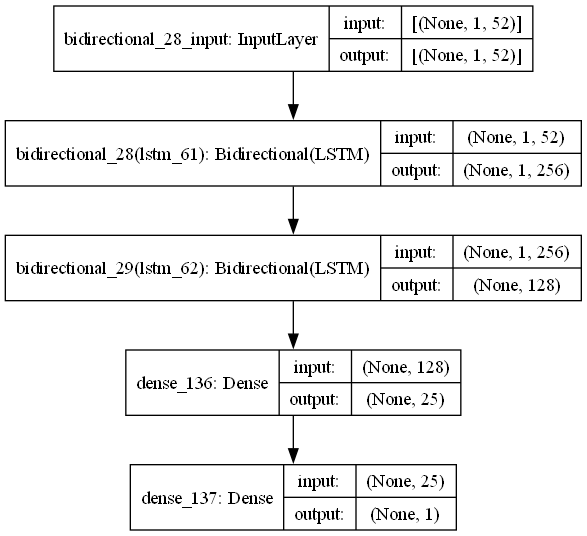

In [213]:
# 保存模型结构
plot_model(best_model_BiLSTM, to_file='model_bilstm.png', show_shapes=True, show_layer_names=True)

# 展示模型结构
Image(filename='model_bilstm.png')

# **Predictions and Evaluation BiLSTM**

In [214]:
# 使用 model_BiLSTM 进行预测
train_predict_BiLSTM = best_model_BiLSTM.predict(x_train)
test_predict_BiLSTM = best_model_BiLSTM.predict(x_test)

# 反归一化
train_predict_BiLSTM = scaler.inverse_transform(train_predict_BiLSTM)
y_train_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))

test_predict_BiLSTM = scaler.inverse_transform(test_predict_BiLSTM)
y_test_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

# 计算评估指标
score_rmse_BiLSTM = np.sqrt(mean_squared_error(y_test_BiLSTM, test_predict_BiLSTM))
score_mae_BiLSTM = mean_absolute_error(y_test_BiLSTM, test_predict_BiLSTM)

# 打印结果
print(Fore.GREEN + 'BiLSTM Model RMSE: {:.4f}'.format(score_rmse_BiLSTM))
print(Fore.BLUE + 'BiLSTM Model MAE: {:.4f}'.format(score_mae_BiLSTM))

BiLSTM Model RMSE: 0.0339
BiLSTM Model MAE: 0.0188


# **Plot BiLSTM Model**

Text(0, 0.5, 'Power')

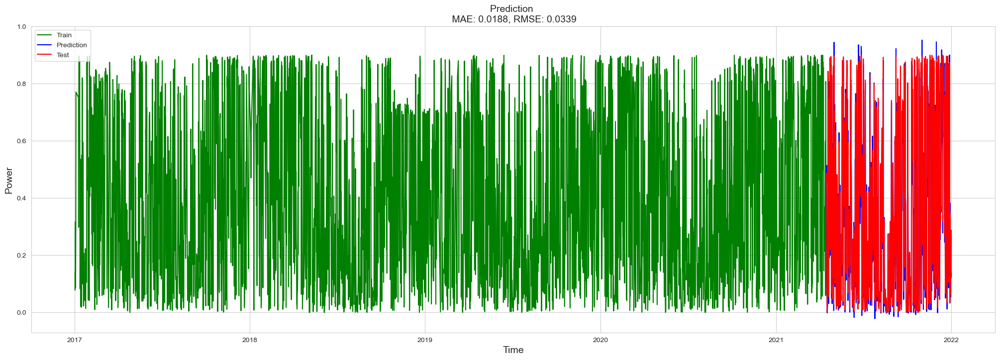

In [215]:
# 获取时间戳和训练集真实值
x_train_ticks = univariate_df.head(train_size)['ds']  # 训练集时间戳
y_train_real = univariate_df.head(train_size)['y']         # 训练集真实值
x_test_ticks = univariate_df.tail(test_size)['ds']     # 测试

# 创建画布
f, ax = plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(25)

# 绘制训练集曲线
sns.lineplot(x=x_train_ticks, y=y_train_real, ax=ax, color='green', label='Train')

# 绘制测试集预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_BiLSTM[:, 0], ax=ax, color='blue', label='Prediction')

# 绘制测试集真实值曲线
sns.lineplot(x=x_test_ticks, y=y_test_BiLSTM.flatten(), ax=ax, color='red', label='Test')

# 设置标题和坐标轴标签
ax.set_title(f'Prediction \n MAE: {score_mae_BiLSTM:.4f}, RMSE: {score_rmse_BiLSTM:.4f}', fontsize=14)
ax.set_xlabel(xlabel='Time', fontsize=14)
ax.set_ylabel(ylabel='Power', fontsize=14)


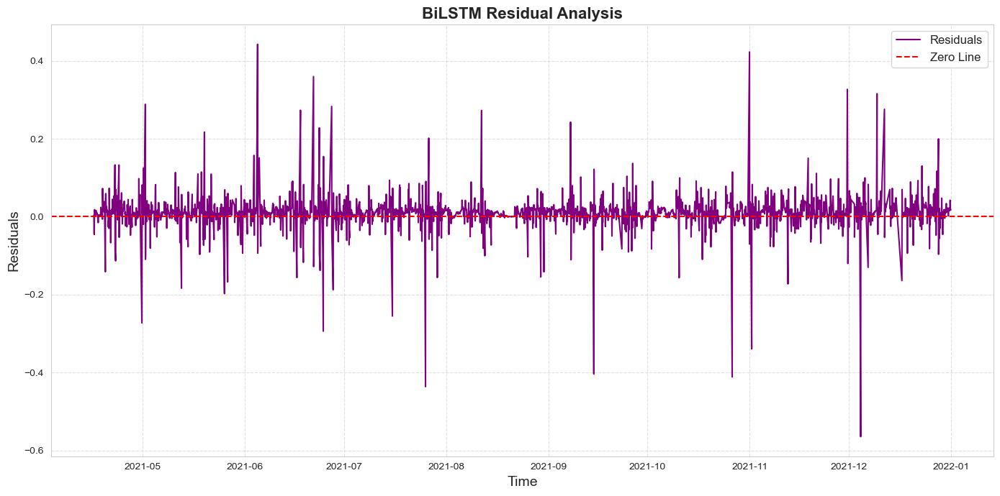

BiLSTM Residual Analysis:
Mean of Residuals: 0.01030303282597965
Standard Deviation of Residuals: 0.032318042722954465


In [216]:
# BiLSTM残差分析图   
residuals_bilstm = y_test_BiLSTM.flatten() - test_predict_BiLSTM.flatten()
plt.figure(figsize=(14, 7))
plt.plot(x_test_ticks, residuals_bilstm, label='Residuals', color='purple')
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('BiLSTM Residual Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 打印分析结果
print("BiLSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_bilstm))
print("Standard Deviation of Residuals:", np.std(residuals_bilstm))

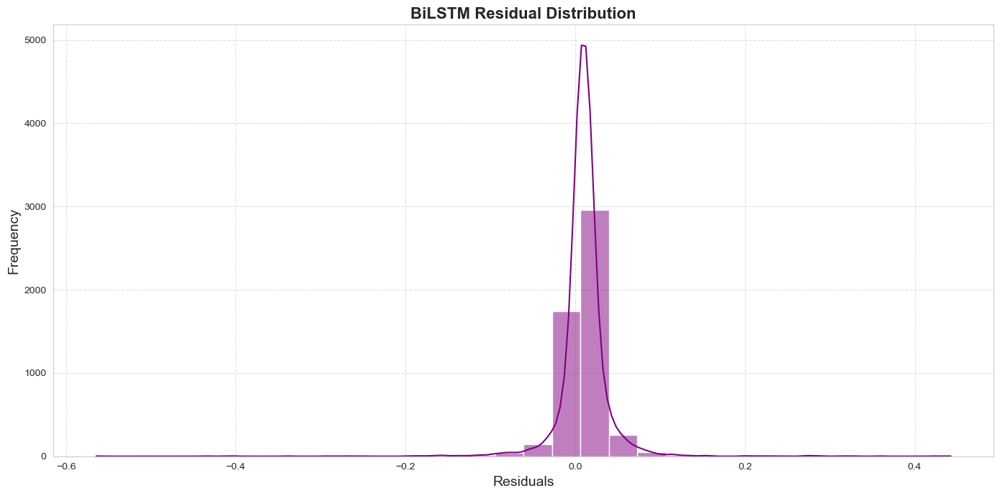

BiLSTM Residual Distribution Analysis:
Mean of Residuals: 0.01030303282597965
Standard Deviation of Residuals: 0.032318042722954465


In [217]:
# BiLSTM 误差分布图
plt.figure(figsize=(14, 7))
sns.histplot(residuals_bilstm, bins=30, kde=True, color='purple')
plt.title('BiLSTM Residual Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Residuals', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()
# 打印分析结果
print("BiLSTM Residual Distribution Analysis:")
print("Mean of Residuals:", np.mean(residuals_bilstm))
print("Standard Deviation of Residuals:", np.std(residuals_bilstm))

# **Building and Compiling Transform+LSTM model**

In [218]:
# ===================== 自定义 Transformer 层 =====================
class TransformerBlock(Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.1):
        super(TransformerBlock, self).__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.ff_dim = ff_dim
        self.rate = rate

        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = tf.keras.Sequential([
            Dense(ff_dim, activation="relu"),
            Dense(embed_dim)
        ])
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout1 = Dropout(rate)
        self.dropout2 = Dropout(rate)

    def call(self, inputs, training=False):
        attn_output = self.att(inputs, inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

    def get_config(self):
        config = super(TransformerBlock, self).get_config()
        config.update({
            "embed_dim": self.embed_dim,
            "num_heads": self.num_heads,
            "ff_dim": self.ff_dim,
            "rate": self.rate,
        })
        return config

# 构建 Transformer
# ===================== 构建 Transformer + LSTM 模型 =====================
def build_transformer_lstm(input_shape, embed_dim=64, num_heads=4, ff_dim=256, lstm_units=128):
    model = Sequential(name="Transformer_LSTM")
    
    # Transformer 编码器部分
    model.add(tf.keras.layers.Dense(embed_dim, input_shape=input_shape))  # 将输入投影到embed_dim维度
    model.add(TransformerBlock(embed_dim=embed_dim, num_heads=num_heads, ff_dim=ff_dim))
    
    # LSTM 时序建模
    model.add(LSTM(lstm_units, return_sequences=True))  # 第一层LSTM
    model.add(LSTM(lstm_units//2, return_sequences=False))  # 第二层LSTM
    
    # 全连接层
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    
    # 输出层
    model.add(Dense(1))  # 回归任务输出
    
    return model

# ===================== 模型初始化与编译 =====================
# 定义超参数
embed_dim = 64    # Transformer嵌入维度
num_heads = 4     # 注意力头数
ff_dim = 256       # 前馈网络维度
lstm_units = 128   # LSTM隐藏单元数

# ===================== 模型初始化与训练 =====================
# 初始化模型
model_TransformLSTM = build_transformer_lstm(
    input_shape=(x_train.shape[1], x_train.shape[2]),embed_dim=embed_dim, num_heads=num_heads, ff_dim=ff_dim, lstm_units=lstm_units
)

# 编译模型
model_TransformLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)

# 训练模型
history_TransformLSTM = model_TransformLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 11s 11ms/step - loss: 0.0178 - mae: 0.0973 - val_loss: 0.0031 - val_mae: 0.0408
Epoch 2/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0078 - mae: 0.0651 - val_loss: 0.0044 - val_mae: 0.0523
Epoch 3/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0057 - mae: 0.0549 - val_loss: 0.0021 - val_mae: 0.0317
Epoch 4/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0047 - mae: 0.0488 - val_loss: 0.0019 - val_mae: 0.0297
Epoch 5/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0044 - mae: 0.0466 - val_loss: 0.0028 - val_mae: 0.0395
Epoch 6/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0041 - mae: 0.0443 - val_loss: 0.0014 - val_mae: 0.0213
Epoch 7/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0042 - mae: 0.0444 - val_loss: 0.0017 - val_mae: 0.0274
Epoch 8/80
930/930 [==============================] - 9s 10ms/step -

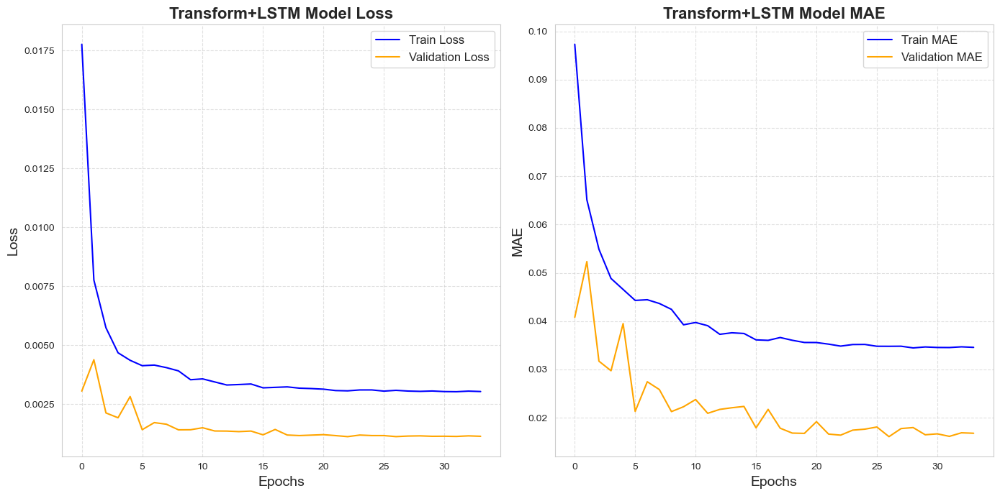

In [219]:
# 一排两个图，分别展示LOSS,MAE
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].plot(history_TransformLSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_TransformLSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('Transform+LSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_TransformLSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_TransformLSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('Transform+LSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [220]:
# 输出模型结构
model_TransformLSTM.summary()

Model: "Transformer_LSTM"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_30 (Dense)             (None, 1, 64)             3392      
_________________________________________________________________
transformer_block_2 (Transfo (None, 1, 64)             99712     
_________________________________________________________________
lstm_19 (LSTM)               (None, 1, 128)            98816     
_________________________________________________________________
lstm_20 (LSTM)               (None, 64)                49408     
_________________________________________________________________
dense_33 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_12 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_34 (Dense)             (None, 1)            

In [221]:
# 保存模型
model_TransformLSTM.save('best_model_transformer_lstm.h5')

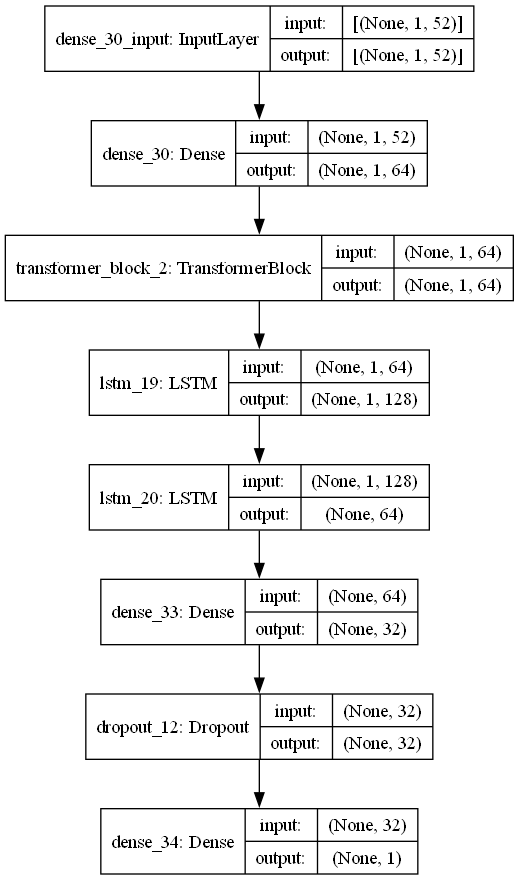

In [222]:
# 显示模型结构
plot_model(model_TransformLSTM, to_file='model_transformer_lstm.png', show_shapes=True, show_layer_names=True)

# 展示模型结构
Image(filename='model_transformer_lstm.png')

# **Predictions and Evaluation Transform+LSTM**

In [223]:
# 使用 model_TransformLSTM 进行预测
train_predict_TransformLSTM = model_TransformLSTM.predict(x_train)
test_predict_TransformLSTM = model_TransformLSTM.predict(x_test)

# 反归一化
train_predict_TransformLSTM = scaler.inverse_transform(train_predict_TransformLSTM)
y_train_TransformLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))

test_predict_TransformLSTM = scaler.inverse_transform(test_predict_TransformLSTM)
y_test_TransformLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

# 计算评估指标
score_rmse_TransformLSTM = np.sqrt(mean_squared_error(y_test_TransformLSTM, test_predict_TransformLSTM))
score_mae_TransformLSTM = mean_absolute_error(y_test_TransformLSTM, test_predict_TransformLSTM)

# 打印结果
print(Fore.GREEN + 'Transform+LSTM Model RMSE: {:.4f}'.format(score_rmse_TransformLSTM))
print(Fore.BLUE + 'Transform+LSTM Model MAE: {:.4f}'.format(score_mae_TransformLSTM))

Transform+LSTM Model RMSE: 0.0302
Transform+LSTM Model MAE: 0.0145


# **Plot Transform+LSTM Model**

Text(0, 0.5, 'Power')

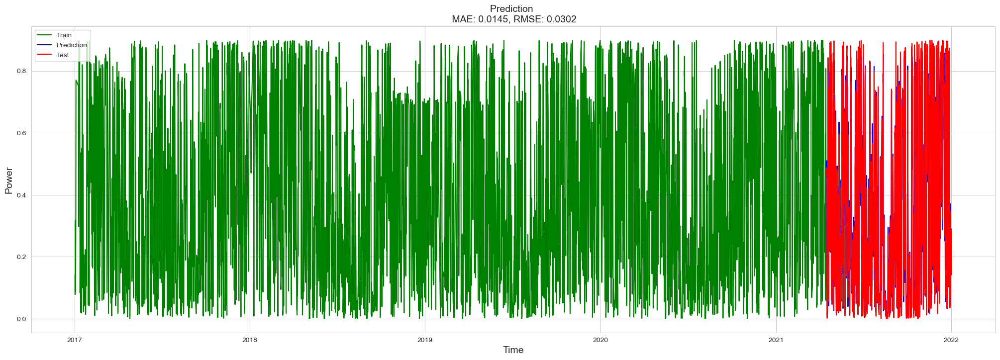

In [224]:
# 获取时间戳和训练集真实值
x_train_ticks = univariate_df.head(train_size)['ds']  # 训练集时间戳
y_train_real = univariate_df.head(train_size)['y']         # 训练集真实值
x_test_ticks = univariate_df.tail(test_size)['ds']     # 测试

# 创建画布
f, ax = plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(25)

# 绘制训练集曲线
sns.lineplot(x=x_train_ticks, y=y_train_real, ax=ax, color='green', label='Train')

# 绘制测试集预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_TransformLSTM[:, 0], ax=ax, color='blue', label='Prediction')

# 绘制测试集真实值曲线
sns.lineplot(x=x_test_ticks, y=y_test_TransformLSTM.flatten(), ax=ax, color='red', label='Test')

# 设置标题和坐标轴标签
ax.set_title(f'Prediction \n MAE: {score_mae_TransformLSTM:.4f}, RMSE: {score_rmse_TransformLSTM:.4f}', fontsize=14)
ax.set_xlabel(xlabel='Time', fontsize=14)
ax.set_ylabel(ylabel='Power', fontsize=14)

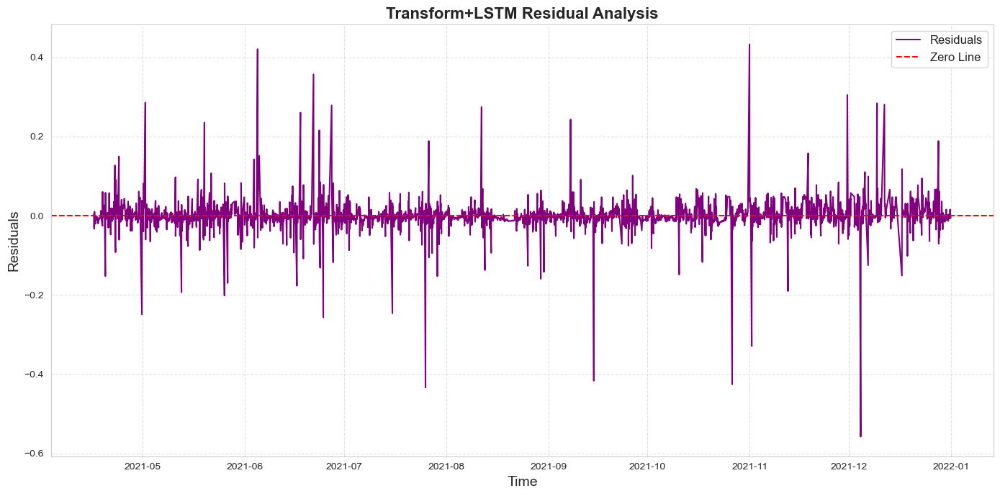

Transform+LSTM Residual Analysis:
Mean of Residuals: 9.709961677186173e-05
Standard Deviation of Residuals: 0.030205001495675933


In [225]:
# Transform+LSTM残差分析图
residuals_transform_lstm = y_test_TransformLSTM.flatten() - test_predict_TransformLSTM.flatten()
plt.figure(figsize=(14, 7))
plt.plot(x_test_ticks, residuals_transform_lstm, label='Residuals', color='purple')
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('Transform+LSTM Residual Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 打印分析结果
print("Transform+LSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_transform_lstm))
print("Standard Deviation of Residuals:", np.std(residuals_transform_lstm))

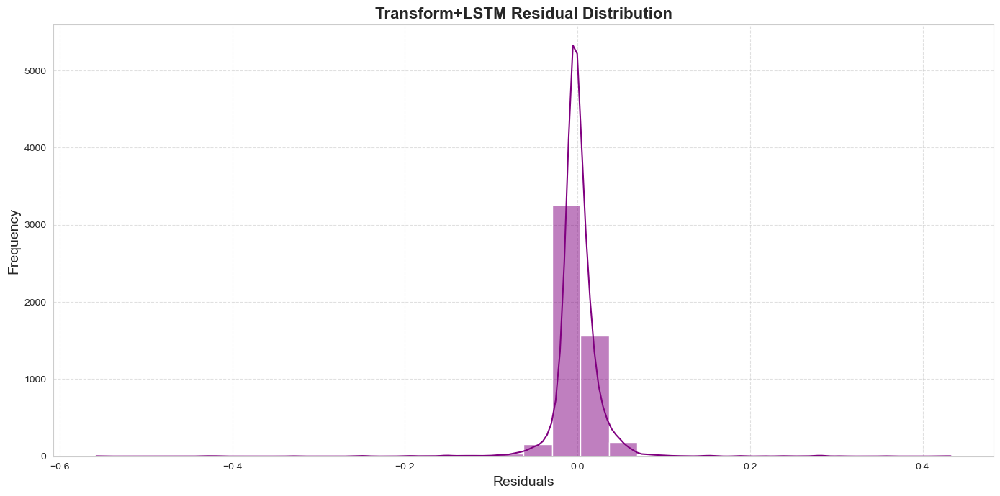

In [226]:
# Transform+LSTM 误差分布图
plt.figure(figsize=(14, 7))
sns.histplot(residuals_transform_lstm, bins=30, kde=True, color='purple')
plt.title('Transform+LSTM Residual Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Residuals', fontsize=14)    
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# **Building and Compiling Transform+BiLSTM model**

In [227]:
from tensorflow.keras.layers import Bidirectional


# ===================== 构建 Transformer + BiLSTM 模型 =====================
def build_transformer_bilstm(input_shape, embed_dim=64, num_heads=4, ff_dim=256, lstm_units=128):
    model = Sequential(name="Transformer_BiLSTM")
    
    # Transformer 编码器部分
    model.add(tf.keras.layers.Dense(embed_dim, input_shape=input_shape))  # 将输入投影到embed_dim维度
    model.add(TransformerBlock(embed_dim=embed_dim, num_heads=num_heads, ff_dim=ff_dim))
    
    # BiLSTM 时序建模
    model.add(Bidirectional(LSTM(lstm_units, return_sequences=True)))  # 第一层双向LSTM
    model.add(Bidirectional(LSTM(lstm_units//2, return_sequences=False)))  # 第二层双向LSTM
    
    # 全连接层
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    
    # 输出层
    model.add(Dense(1))  # 回归任务输出
    
    return model

# ===================== 模型初始化与编译 =====================
# 定义超参数（保持与之前一致）
embed_dim = 64    # Transformer嵌入维度
num_heads = 4     # 注意力头数
ff_dim = 256       # 前馈网络维度
lstm_units = 128   # LSTM隐藏单元数

# 初始化模型
model_TransformBiLSTM = build_transformer_bilstm(
    input_shape=(x_train.shape[1], x_train.shape[2]), embed_dim=embed_dim, num_heads=num_heads, ff_dim=ff_dim, lstm_units=lstm_units
)

# ===================== 模型编译 =====================
model_TransformBiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)

# ===================== 模型训练 =====================
history_TransformBiLSTM = model_TransformBiLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 15s 14ms/step - loss: 0.0167 - mae: 0.0930 - val_loss: 0.0062 - val_mae: 0.0673
Epoch 2/80
930/930 [==============================] - 12s 13ms/step - loss: 0.0078 - mae: 0.0655 - val_loss: 0.0030 - val_mae: 0.0443
Epoch 3/80
930/930 [==============================] - 12s 13ms/step - loss: 0.0058 - mae: 0.0554 - val_loss: 0.0017 - val_mae: 0.0263
Epoch 4/80
930/930 [==============================] - 12s 13ms/step - loss: 0.0049 - mae: 0.0499 - val_loss: 0.0020 - val_mae: 0.0329
Epoch 5/80
930/930 [==============================] - 12s 13ms/step - loss: 0.0046 - mae: 0.0480 - val_loss: 0.0017 - val_mae: 0.0263
Epoch 6/80
930/930 [==============================] - 11s 12ms/step - loss: 0.0043 - mae: 0.0460 - val_loss: 0.0025 - val_mae: 0.0369
Epoch 7/80
930/930 [==============================] - 12s 13ms/step - loss: 0.0038 - mae: 0.0418 - val_loss: 0.0026 - val_mae: 0.0408
Epoch 8/80
930/930 [==============================] - 12s 13ms

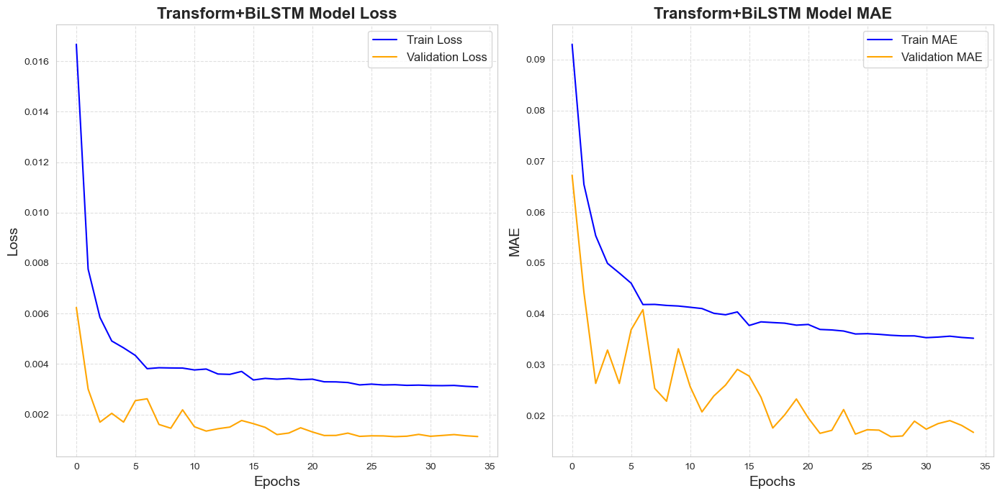

In [228]:
#一排两个，分别 绘制训练和验证损失曲线，mae曲线
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.plot(history_TransformBiLSTM.history['loss'], label='Train Loss', color='blue')
plt.plot(history_TransformBiLSTM.history['val_loss'], label='Validation Loss', color='orange')
plt.title('Transform+BiLSTM Model Loss', fontsize=16, fontweight='bold')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.subplot(1, 2, 2)
plt.plot(history_TransformBiLSTM.history['mae'], label='Train MAE', color='blue')
plt.plot(history_TransformBiLSTM.history['val_mae'], label='Validation MAE', color='orange')
plt.title('Transform+BiLSTM Model MAE', fontsize=16, fontweight='bold')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('MAE', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [229]:
# 输出模型结构
model_TransformBiLSTM.summary()

Model: "Transformer_BiLSTM"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_35 (Dense)             (None, 1, 64)             3392      
_________________________________________________________________
transformer_block_3 (Transfo (None, 1, 64)             99712     
_________________________________________________________________
bidirectional_13 (Bidirectio (None, 1, 256)            197632    
_________________________________________________________________
bidirectional_14 (Bidirectio (None, 128)               164352    
_________________________________________________________________
dense_38 (Dense)             (None, 32)                4128      
_________________________________________________________________
dropout_15 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_39 (Dense)             (None, 1)          

In [230]:
# 保存模型
model_TransformBiLSTM.save('best_model_transformer_bilstm.h5')

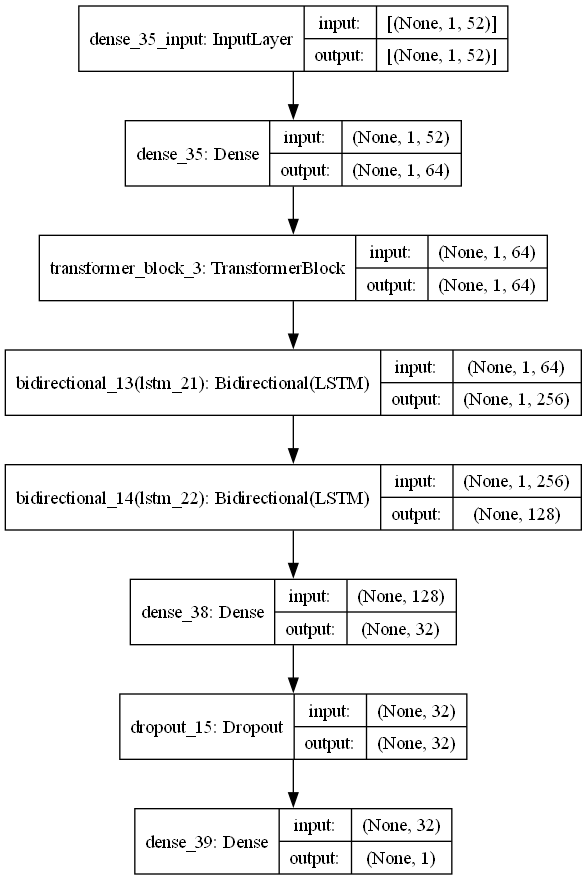

In [231]:
# Display model structure
plot_model(model_TransformBiLSTM, to_file='model_transformer_bilstm.png', show_shapes=True, show_layer_names=True)

# Show model structure
Image(filename='model_transformer_bilstm.png')

# **Predictions and Evaluation Transform+BiLSTM**

In [232]:
# 使用 model_TransformBiLSTM 进行预测
train_predict_TransformBiLSTM = model_TransformBiLSTM.predict(x_train)
test_predict_TransformBiLSTM = model_TransformBiLSTM.predict(x_test)

# 反归一化
train_predict_TransformBiLSTM = scaler.inverse_transform(train_predict_TransformBiLSTM)
y_train_TransformBiLSTM = scaler.inverse_transform(y_train.reshape(-1,1))

test_predict_TransformBiLSTM = scaler.inverse_transform(test_predict_TransformBiLSTM)
y_test_TransformBiLSTM = scaler.inverse_transform(y_test.reshape(-1,1))

# 计算评估指标
score_rmse_TransformBiLSTM = np.sqrt(mean_squared_error(y_test_TransformBiLSTM, test_predict_TransformBiLSTM))
score_mae_TransformBiLSTM = mean_absolute_error(y_test_TransformBiLSTM, test_predict_TransformBiLSTM)

# 打印结果
print(Fore.GREEN + 'Transform+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_TransformBiLSTM))
print(Fore.BLUE + 'Transform+BiLSTM Model MAE: {:.4f}'.format(score_mae_TransformBiLSTM))

Transform+BiLSTM Model RMSE: 0.0301
Transform+BiLSTM Model MAE: 0.0143


# **Plot Transform+BiLSTM Model**

Text(0, 0.5, 'Power')

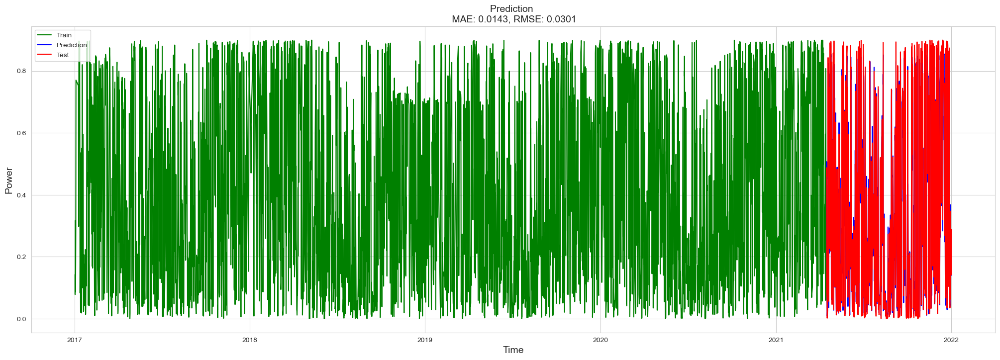

In [233]:
# 获取时间戳和训练集真实值
x_train_ticks = univariate_df.head(train_size)['ds']  # 训练集时间戳
y_train_real = univariate_df.head(train_size)['y']         # 训练集真实值
x_test_ticks = univariate_df.tail(test_size)['ds']     # 测试

# 创建画布
f, ax = plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(25)

# 绘制训练集曲线
sns.lineplot(x=x_train_ticks, y=y_train_real, ax=ax, color='green', label='Train')

# 绘制测试集预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_TransformBiLSTM[:, 0], ax=ax, color='blue', label='Prediction')

# 绘制测试集真实值曲线
sns.lineplot(x=x_test_ticks, y=y_test_TransformBiLSTM.flatten(), ax=ax, color='red', label='Test')

# 设置标题和坐标轴标签
ax.set_title(f'Prediction \n MAE: {score_mae_TransformBiLSTM:.4f}, RMSE: {score_rmse_TransformBiLSTM:.4f}', fontsize=14)
ax.set_xlabel(xlabel='Time', fontsize=14)
ax.set_ylabel(ylabel='Power', fontsize=14)

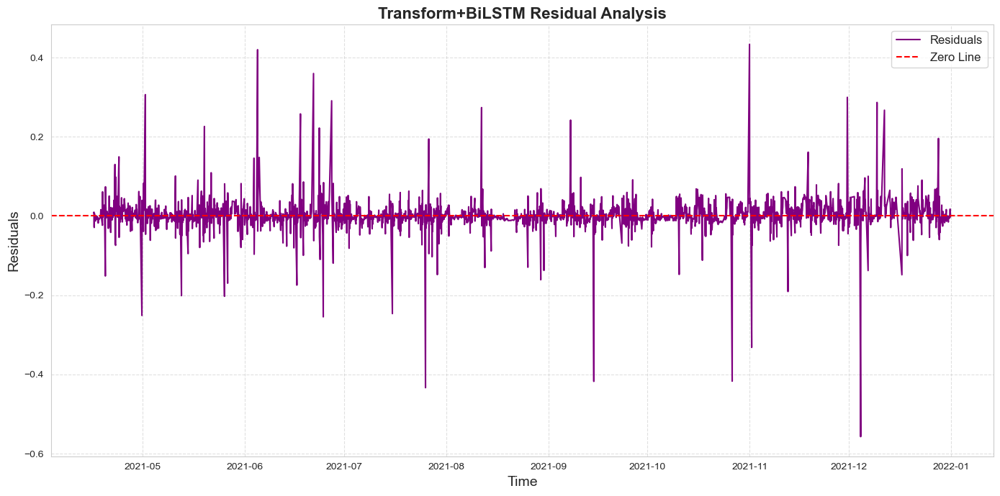

Transform+BiLSTM Residual Analysis:
Mean of Residuals: 0.001715653550016245
Standard Deviation of Residuals: 0.03007459554069028


In [234]:
# Transform+BiLSTM残差分析图
residuals_transform_bilstm = y_test_TransformBiLSTM.flatten() - test_predict_TransformBiLSTM.flatten()
plt.figure(figsize=(14, 7))
plt.plot(x_test_ticks, residuals_transform_bilstm, label='Residuals', color='purple')
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('Transform+BiLSTM Residual Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 打印分析结果
print("Transform+BiLSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_transform_bilstm))
print("Standard Deviation of Residuals:", np.std(residuals_transform_bilstm))

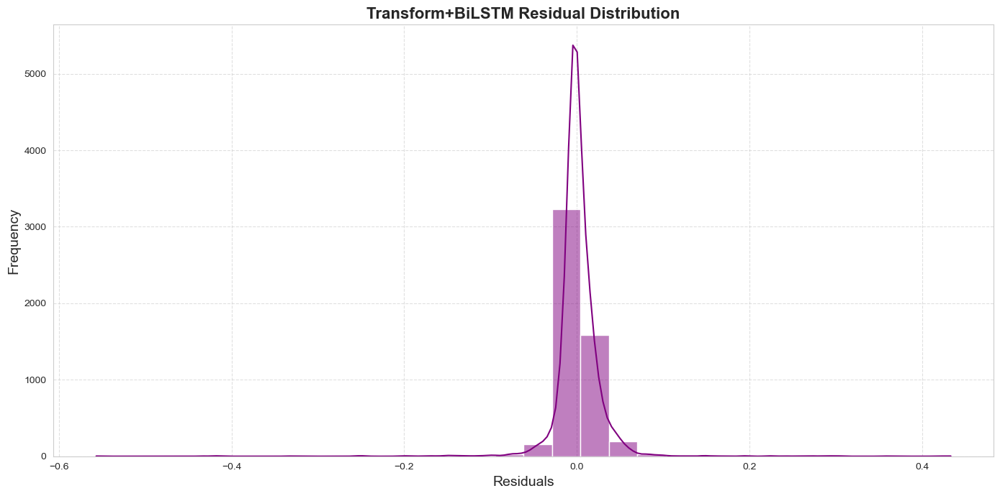

In [235]:
# Transform+BiLSTM 误差分布图
plt.figure(figsize=(14, 7))
sns.histplot(residuals_transform_bilstm, bins=30, kde=True, color='purple')
plt.title('Transform+BiLSTM Residual Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Residuals', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# **Build and compile CNN+Attension+LSTM+WaveletTransform**

In [236]:
import pywt

def wavelet_transform(data, wavelet='db4', level=3):
    """对时间序列进行小波分解，生成多通道特征"""
    coeffs = pywt.wavedec(data, wavelet, level=level, axis=1)
    reconstructed = np.concatenate(coeffs, axis=1)  # 将各层系数拼接为多通道
    return reconstructed

# 示例：对训练数据进行小波变换（假设原始数据形状为 [samples, timesteps, features]）
x_train_wavelet = wavelet_transform(x_train)
x_test_wavelet = wavelet_transform(x_test)

In [238]:
# ===================== 构建 CNN + Attension + BiLSTM + WaveletTransform 模型 =====================
from tensorflow.keras.layers import Input, Conv1D, GlobalAvgPool1D, Multiply, Add
from tensorflow.keras.models import Model

input_shape_wavelet = (x_train_wavelet.shape[1], x_train_wavelet.shape[2])  # 输入形状

def build_cnn_attention_wavelet_bilstm(input_shape, num_filters=64, lstm_units=128):
    # 输入层（已包含小波分解的多通道特征）
    inputs = Input(shape=input_shape_wavelet)
    
    # ===================== 多尺度 CNN 特征提取 =====================
    # 并行多尺度卷积
    conv1 = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(inputs)
    conv2 = Conv1D(filters=num_filters, kernel_size=5, padding='same', activation='relu')(inputs)
    conv3 = Conv1D(filters=num_filters, kernel_size=7, padding='same', activation='relu')(inputs)
    
    # 合并多尺度特征
    merged = Add()([conv1, conv2, conv3])
    
    # ===================== 通道注意力机制 =====================
    # 全局平均池化生成通道权重
    gap = GlobalAvgPool1D()(merged)
    dense = Dense(num_filters//2, activation='relu')(gap)
    attention = Dense(num_filters, activation='sigmoid')(dense)
    
    # 应用注意力权重
    attention_weighted = Multiply()([merged, attention])
    
    # ===================== 双向 LSTM 时序建模 =====================
    lstm_out = Bidirectional(LSTM(lstm_units, return_sequences=True))(attention_weighted)
    lstm_out = Bidirectional(LSTM(lstm_units//2))(lstm_out)
    
    # ===================== 输出层 =====================
    outputs = Dense(1)(lstm_out)
    
    model = Model(inputs=inputs, outputs=outputs, name="CNN_Attention_Wavelet_BiLSTM")
    return model

In [239]:
# ===================== 模型初始化与编译 =====================

# 初始化模型
model_CNN_Atten_Wavelet_BiLSTM = build_cnn_attention_wavelet_bilstm(
    input_shape=(x_train_wavelet.shape[1], x_train_wavelet.shape[2]),
    num_filters=64,
    lstm_units=128
)

# 编译模型
model_CNN_Atten_Wavelet_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)

# ===================== 训练模型 =====================
history_CNN_Atten_Wavelet_BiLSTM = model_CNN_Atten_Wavelet_BiLSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 12s 11ms/step - loss: 0.0074 - mae: 0.0514 - val_loss: 0.0064 - val_mae: 0.0686
Epoch 2/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0030 - mae: 0.0360 - val_loss: 0.0021 - val_mae: 0.0314
Epoch 3/80
930/930 [==============================] - 10s 10ms/step - loss: 0.0025 - mae: 0.0315 - val_loss: 0.0029 - val_mae: 0.0407
Epoch 4/80
930/930 [==============================] - 10s 10ms/step - loss: 0.0025 - mae: 0.0307 - val_loss: 0.0035 - val_mae: 0.0482
Epoch 5/80
930/930 [==============================] - 10s 10ms/step - loss: 0.0023 - mae: 0.0285 - val_loss: 0.0037 - val_mae: 0.0506
Epoch 6/80
930/930 [==============================] - 10s 10ms/step - loss: 0.0020 - mae: 0.0248 - val_loss: 0.0015 - val_mae: 0.0225
Epoch 7/80
930/930 [==============================] - 10s 10ms/step - loss: 0.0020 - mae: 0.0242 - val_loss: 0.0014 - val_mae: 0.0224
Epoch 8/80
930/930 [==============================] - 9s 10ms/s

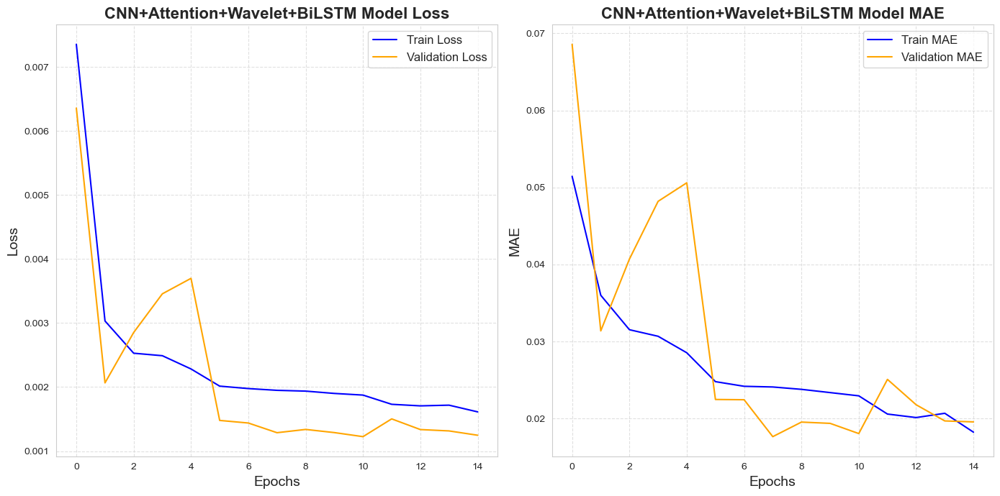

In [240]:
# 一排两个图，分别展示训练和验证损失曲线，mae曲线
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].plot(history_CNN_Atten_Wavelet_BiLSTM.history['loss'], label='Train Loss', color='blue')
axes[0].plot(history_CNN_Atten_Wavelet_BiLSTM.history['val_loss'], label='Validation Loss', color='orange')
axes[0].set_title('CNN+Attention+Wavelet+BiLSTM Model Loss', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Epochs', fontsize=14)
axes[0].set_ylabel('Loss', fontsize=14)
axes[0].legend(fontsize=12)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[1].plot(history_CNN_Atten_Wavelet_BiLSTM.history['mae'], label='Train MAE', color='blue')
axes[1].plot(history_CNN_Atten_Wavelet_BiLSTM.history['val_mae'], label='Validation MAE', color='orange')
axes[1].set_title('CNN+Attention+Wavelet+BiLSTM Model MAE', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Epochs', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=14)
axes[1].legend(fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [241]:
# 输出模型结构
model_CNN_Atten_Wavelet_BiLSTM.summary()

Model: "CNN_Attention_Wavelet_BiLSTM"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 21, 52)]     0                                            
__________________________________________________________________________________________________
conv1d_12 (Conv1D)              (None, 21, 64)       10048       input_5[0][0]                    
__________________________________________________________________________________________________
conv1d_13 (Conv1D)              (None, 21, 64)       16704       input_5[0][0]                    
__________________________________________________________________________________________________
conv1d_14 (Conv1D)              (None, 21, 64)       23360       input_5[0][0]                    
_______________________________________________________________________

In [107]:
# 保存模型
model_CNN_Atten_Wavelet_BiLSTM.save('model/best_model_cnn_atten_wavelet_bilstm.h5')

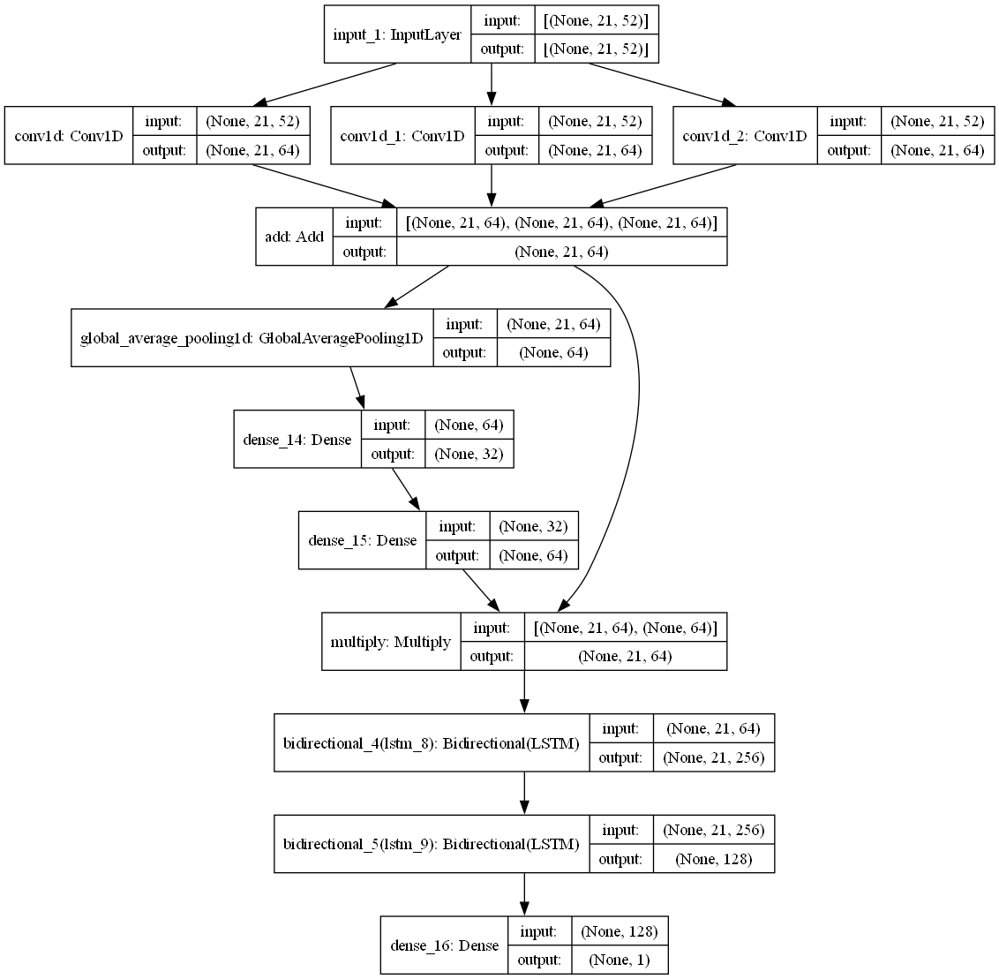

In [108]:
# 显示模型结构图
plot_model(model_CNN_Atten_Wavelet_BiLSTM, to_file='model_cnn_atten_wavelet_bilstm.png', show_shapes=True, show_layer_names=True)

# 在 Jupyter Notebook 中直接显示图片
Image(filename='model_cnn_atten_wavelet_bilstm.png')

In [242]:
# 使用 model_CNN_Atten_Wavelet_BiLSTM 进行预测
train_predict_CNN_Atten_Wavelet_BiLSTM = model_CNN_Atten_Wavelet_BiLSTM.predict(x_train_wavelet)
test_predict_CNN_Atten_Wavelet_BiLSTM = model_CNN_Atten_Wavelet_BiLSTM.predict(x_test_wavelet)

# 反归一化
train_predict_CNN_Atten_Wavelet_BiLSTM = scaler.inverse_transform(train_predict_CNN_Atten_Wavelet_BiLSTM)
y_train_CNN_Atten_Wavelet_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))

test_predict_CNN_Atten_Wavelet_BiLSTM = scaler.inverse_transform(test_predict_CNN_Atten_Wavelet_BiLSTM)
y_test_CNN_Atten_Wavelet_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))

# 计算评估指标
score_rmse_CNN_Atten_Wavelet_BiLSTM = np.sqrt(mean_squared_error(y_test_CNN_Atten_Wavelet_BiLSTM, test_predict_CNN_Atten_Wavelet_BiLSTM))
score_mae_CNN_Atten_Wavelet_BiLSTM = mean_absolute_error(y_test_CNN_Atten_Wavelet_BiLSTM, test_predict_CNN_Atten_Wavelet_BiLSTM)

# 打印结果
print(Fore.GREEN + 'CNN+Attention+Wavelet+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_CNN_Atten_Wavelet_BiLSTM))
print(Fore.BLUE + 'CNN+Attention+Wavelet+BiLSTM Model MAE: {:.4f}'.format(score_mae_CNN_Atten_Wavelet_BiLSTM))

CNN+Attention+Wavelet+BiLSTM Model RMSE: 0.0323
CNN+Attention+Wavelet+BiLSTM Model MAE: 0.0159


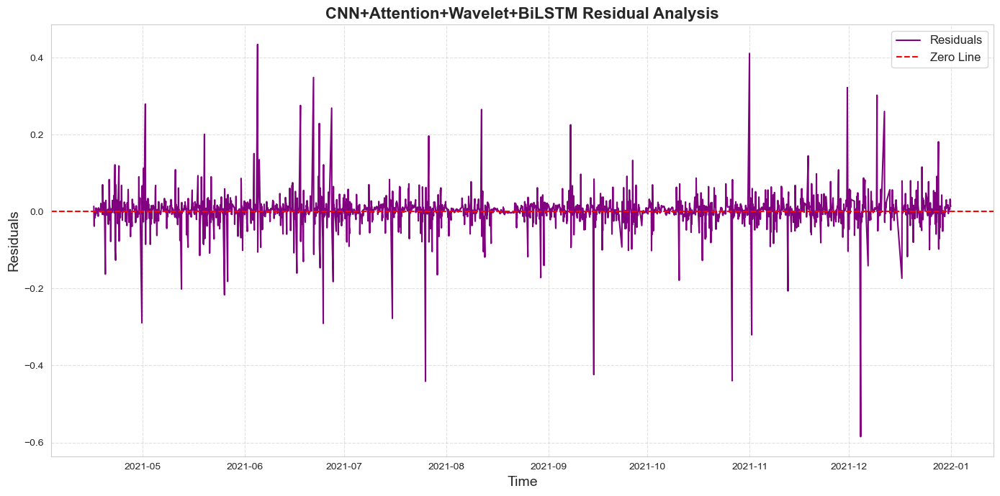

CNN+Attention+Wavelet+BiLSTM Residual Analysis:
Mean of Residuals: 0.002703226507642436
Standard Deviation of Residuals: 0.03215859562262022


In [243]:
# 混合模型残差分析图
residuals_cnn_atten_wavelet_bilstm = y_test_CNN_Atten_Wavelet_BiLSTM.flatten() - test_predict_CNN_Atten_Wavelet_BiLSTM.flatten()
plt.figure(figsize=(14, 7))
plt.plot(x_test_ticks, residuals_cnn_atten_wavelet_bilstm, label='Residuals', color='purple')
plt.axhline(0, color='red', linestyle='--', label='Zero Line')
plt.title('CNN+Attention+Wavelet+BiLSTM Residual Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Time', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()
# 打印分析结果
print("CNN+Attention+Wavelet+BiLSTM Residual Analysis:")
print("Mean of Residuals:", np.mean(residuals_cnn_atten_wavelet_bilstm))
print("Standard Deviation of Residuals:", np.std(residuals_cnn_atten_wavelet_bilstm))

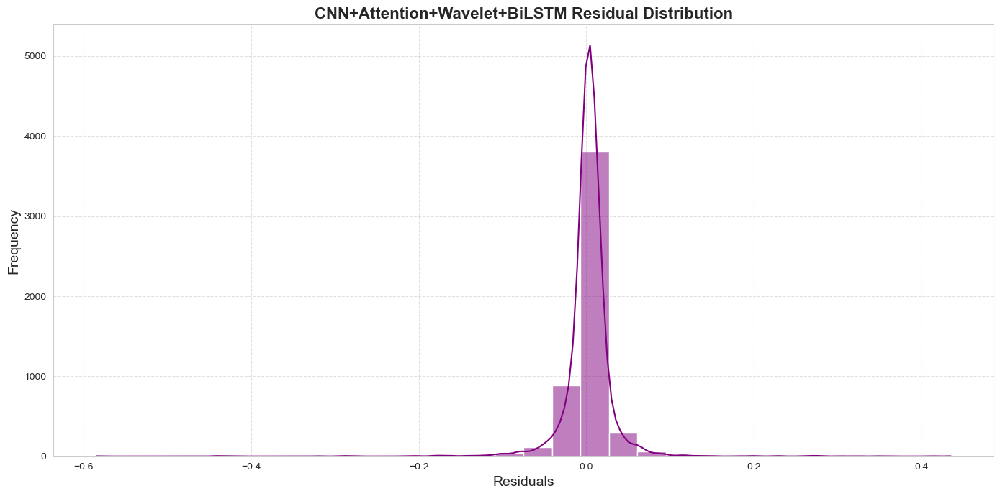

CNN+Attention+Wavelet+BiLSTM Residual Distribution Analysis:
Mean of Residuals: 0.002703226507642436
Standard Deviation of Residuals: 0.03215859562262022


In [244]:
# 混合模型误差分布图
plt.figure(figsize=(14, 7))
sns.histplot(residuals_cnn_atten_wavelet_bilstm, bins=30, kde=True, color='purple')
plt.title('CNN+Attention+Wavelet+BiLSTM Residual Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Residuals', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 打印分析结果
print("CNN+Attention+Wavelet+BiLSTM Residual Distribution Analysis:")
print("Mean of Residuals:", np.mean(residuals_cnn_atten_wavelet_bilstm))
print("Standard Deviation of Residuals:", np.std(residuals_cnn_atten_wavelet_bilstm))

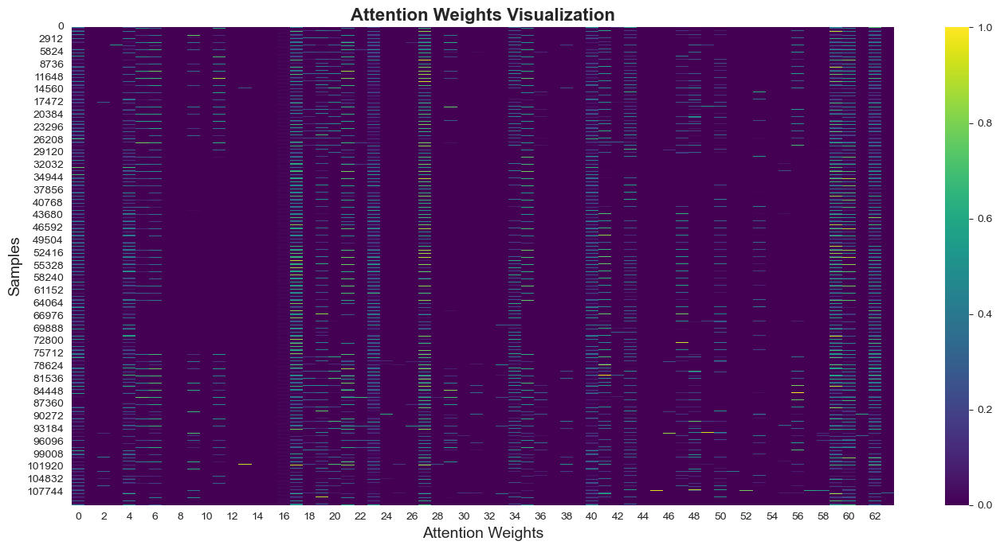

Attention Weights Analysis:
Mean of Attention Weights: 0.022414247
Standard Deviation of Attention Weights: 0.0978261


In [112]:
# 注意力权重可视化
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import matplotlib.cm as cm
from sklearn.preprocessing import MinMaxScaler
# 获取注意力权重
attention_weights = model_CNN_Atten_Wavelet_BiLSTM.layers[2].output
attention_weights = Model(inputs=model_CNN_Atten_Wavelet_BiLSTM.input, outputs=attention_weights)
attention_weights_output = attention_weights.predict(x_test_wavelet)
# 归一化
scaler = MinMaxScaler()
attention_weights_output = scaler.fit_transform(attention_weights_output.reshape(-1, attention_weights_output.shape[-1]))
# 可视化注意力权重
plt.figure(figsize=(14, 7))
sns.heatmap(attention_weights_output, cmap='viridis', cbar=True)
plt.title('Attention Weights Visualization', fontsize=16, fontweight='bold')
plt.xlabel('Attention Weights', fontsize=14)
plt.ylabel('Samples', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 打印分析结果
print("Attention Weights Analysis:")
print("Mean of Attention Weights:", np.mean(attention_weights_output))
print("Standard Deviation of Attention Weights:", np.std(attention_weights_output))


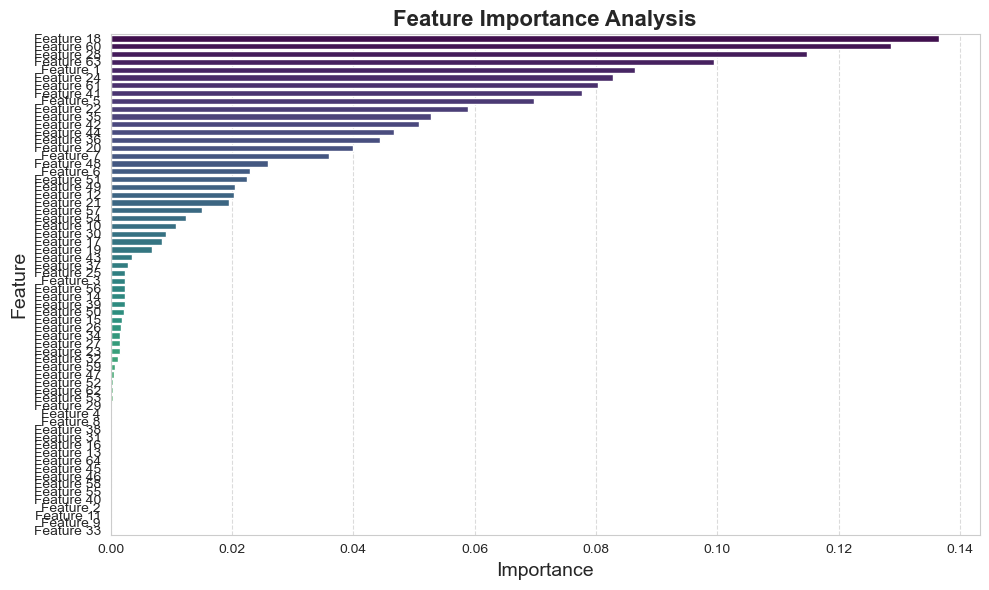

       Feature  Importance
17  Feature 18    0.136465
59  Feature 60    0.128700
27  Feature 28    0.114801
62  Feature 63    0.099491
0    Feature 1    0.086481
..         ...         ...
39  Feature 40    0.000000
1    Feature 2    0.000000
10  Feature 11    0.000000
8    Feature 9    0.000000
32  Feature 33    0.000000

[64 rows x 2 columns]


In [113]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model

# 获取注意力权重
attention_layer = model_CNN_Atten_Wavelet_BiLSTM.layers[2].output
attention_model = Model(inputs=model_CNN_Atten_Wavelet_BiLSTM.input, outputs=attention_layer)
attention_weights = attention_model.predict(x_test_wavelet)

# 归一化注意力权重
scaler = MinMaxScaler()
attention_weights_normalized = scaler.fit_transform(attention_weights.reshape(-1, attention_weights.shape[-1]))

# 计算特征重要性
feature_importance = np.mean(attention_weights_normalized, axis=0)

# 可视化特征重要性
features = [f'Feature {i+1}' for i in range(len(feature_importance))]
importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
plt.title('Feature Importance Analysis', fontsize=16, fontweight='bold')
plt.xlabel('Importance', fontsize=14)
plt.ylabel('Feature', fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 打印特征重要性表
print(importance_df)


# **Evaluation Metrics**

In [114]:
# 打印结果（表格）
print(Fore.RED + 'Evaluation Metrics')
print("---"*20)

# LSTM Model
print(Fore.GREEN + 'LSTM Model')
print('RMSE:', score_rmse_LSTM)
print('MAE:', score_mae_LSTM)
print('Residual Mean:', np.mean(residuals_lstm))
print('Residual Std Dev:', np.std(residuals_lstm))
print("---"*20)

# BiLSTM Model
print(Fore.GREEN + 'BiLSTM Model')
print('RMSE:', score_rmse_BiLSTM)
print('MAE:', score_mae_BiLSTM)
print('Residual Mean:', np.mean(residuals_bilstm))
print('Residual Std Dev:', np.std(residuals_bilstm))
print("---"*20)

# Transformer + LSTM Model
print(Fore.GREEN + 'Transformer + LSTM Model')
print('RMSE:', score_rmse_TransformLSTM)
print('MAE:', score_mae_TransformLSTM)
print('Residual Mean:', np.mean(residuals_transform_lstm))
print('Residual Std Dev:', np.std(residuals_transform_lstm))
print("---"*20)

# Transformer + BiLSTM Model
print(Fore.GREEN + 'Transformer + BiLSTM Model')
print('RMSE:', score_rmse_TransformBiLSTM)
print('MAE:', score_mae_TransformBiLSTM)
print('Residual Mean:', np.mean(residuals_transform_bilstm))
print('Residual Std Dev:', np.std(residuals_transform_bilstm))
print("---"*20)

# CNN+Attention+Wavelet+BiLSTM Model
print(Fore.GREEN + 'CNN+Attention+Wavelet+BiLSTM Model')
print('RMSE:', score_rmse_CNN_Atten_Wavelet_BiLSTM)
print('MAE:', score_mae_CNN_Atten_Wavelet_BiLSTM)
print('Residual Mean:', np.mean(residuals_cnn_atten_wavelet_bilstm))
print('Residual Std Dev:', np.std(residuals_cnn_atten_wavelet_bilstm))
print("---"*20)
print("---"*20)

Evaluation Metrics
------------------------------------------------------------
LSTM Model
RMSE: 0.03321967485703246
MAE: 0.018480576809627332
Residual Mean: 9.755651007869037e-05
Residual Std Dev: 0.03321953160919485
------------------------------------------------------------
BiLSTM Model
RMSE: 0.033920618668531445
MAE: 0.01880949506430006
Residual Mean: 0.01030303282597965
Residual Std Dev: 0.032318042722954465
------------------------------------------------------------
Transformer + LSTM Model
RMSE: 0.03072089681175343
MAE: 0.014980105864926343
Residual Mean: 0.003423646680278427
Residual Std Dev: 0.030529529055113518
------------------------------------------------------------
Transformer + BiLSTM Model
RMSE: 0.031036721631111566
MAE: 0.014630045732404928
Residual Mean: 0.0007868371037778715
Residual Std Dev: 0.03102674615520015
------------------------------------------------------------
CNN+Attention+Wavelet+BiLSTM Model
RMSE: 0.030494384671248476
MAE: 0.013692973088163694
Resi

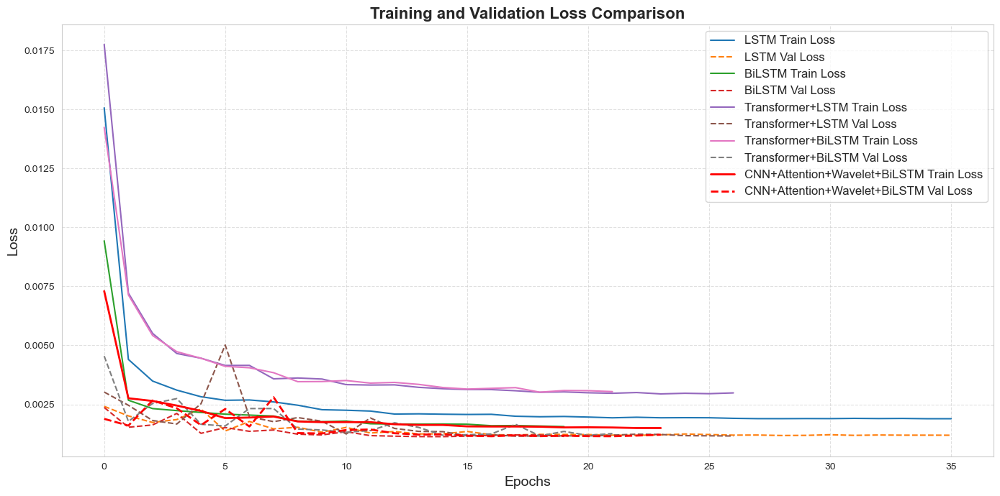

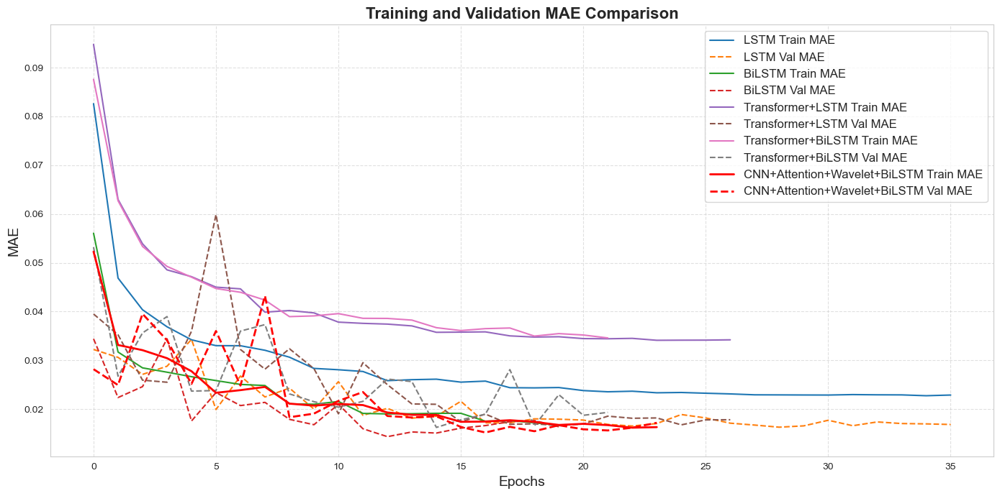

In [115]:
import matplotlib.pyplot as plt

# 模型的训练和验证损失
loss_data = {
    'LSTM': {'train': history_LSTM.history['loss'], 'val': history_LSTM.history['val_loss']},
    'BiLSTM': {'train': history_BiLSTM.history['loss'], 'val': history_BiLSTM.history['val_loss']},
    'Transformer+LSTM': {'train': history_TransformLSTM.history['loss'], 'val': history_TransformLSTM.history['val_loss']},
    'Transformer+BiLSTM': {'train': history_TransformBiLSTM.history['loss'], 'val': history_TransformBiLSTM.history['val_loss']},
    'CNN+Attention+Wavelet+BiLSTM': {'train': history_CNN_Atten_Wavelet_BiLSTM.history['loss'], 'val': history_CNN_Atten_Wavelet_BiLSTM.history['val_loss']}
}

# 模型的训练和验证MAE
mae_data = {
    'LSTM': {'train': history_LSTM.history['mae'], 'val': history_LSTM.history['val_mae']},
    'BiLSTM': {'train': history_BiLSTM.history['mae'], 'val': history_BiLSTM.history['val_mae']},
    'Transformer+LSTM': {'train': history_TransformLSTM.history['mae'], 'val': history_TransformLSTM.history['val_mae']},
    'Transformer+BiLSTM': {'train': history_TransformBiLSTM.history['mae'], 'val': history_TransformBiLSTM.history['val_mae']},
    'CNN+Attention+Wavelet+BiLSTM': {'train': history_CNN_Atten_Wavelet_BiLSTM.history['mae'], 'val': history_CNN_Atten_Wavelet_BiLSTM.history['val_mae']}
}

import matplotlib.pyplot as plt

# Highlight color for the hybrid model
highlight_color = 'red'

# 绘制训练和验证损失图
plt.figure(figsize=(14, 7))
for model, data in loss_data.items():
    if model == 'CNN+Attention+Wavelet+BiLSTM':
        plt.plot(data['train'], label=f'{model} Train Loss', linestyle='-', color=highlight_color, linewidth=2)
        plt.plot(data['val'], label=f'{model} Val Loss', linestyle='--', color=highlight_color, linewidth=2)
    else:
        plt.plot(data['train'], label=f'{model} Train Loss', linestyle='-')
        plt.plot(data['val'], label=f'{model} Val Loss', linestyle='--')
plt.title('Training and Validation Loss Comparison', fontsize=16, fontweight='bold')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 绘制训练和验证MAE图
plt.figure(figsize=(14, 7))
for model, data in mae_data.items():
    if model == 'CNN+Attention+Wavelet+BiLSTM':
        plt.plot(data['train'], label=f'{model} Train MAE', linestyle='-', color=highlight_color, linewidth=2)
        plt.plot(data['val'], label=f'{model} Val MAE', linestyle='--', color=highlight_color, linewidth=2)
    else:
        plt.plot(data['train'], label=f'{model} Train MAE', linestyle='-')
        plt.plot(data['val'], label=f'{model} Val MAE', linestyle='--')
plt.title('Training and Validation MAE Comparison', fontsize=16, fontweight='bold')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('MAE', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

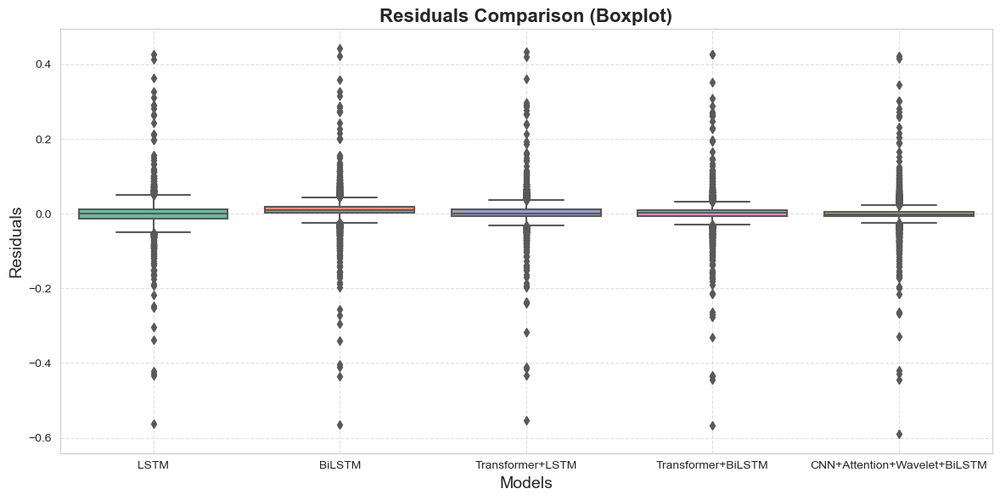

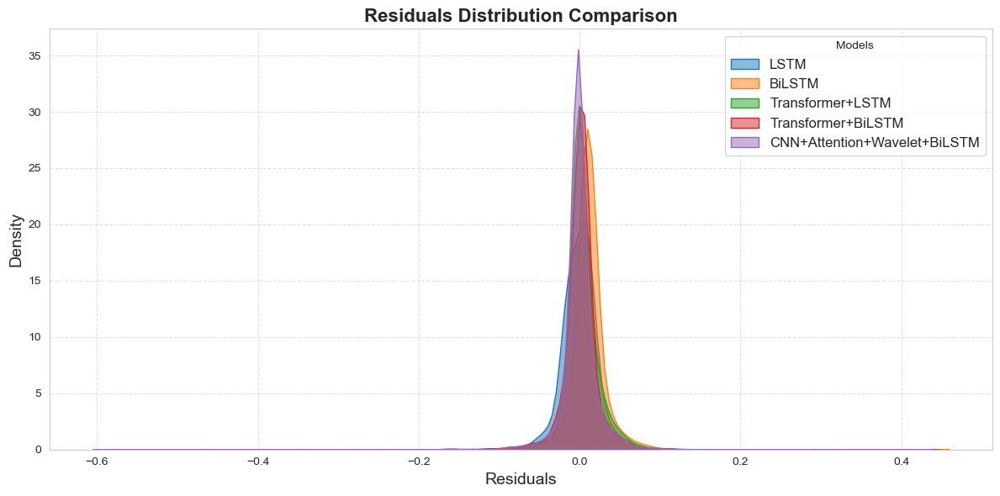

In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 汇总各模型的残差
residuals_data = {
    'LSTM': residuals_lstm,
    'BiLSTM': residuals_bilstm,
    'Transformer+LSTM': residuals_transform_lstm,
    'Transformer+BiLSTM': residuals_transform_bilstm,
    'CNN+Attention+Wavelet+BiLSTM': residuals_cnn_atten_wavelet_bilstm
}

# 转换为 DataFrame
residuals_df = pd.DataFrame(residuals_data)

# 绘制箱线图
plt.figure(figsize=(12, 6))
sns.boxplot(data=residuals_df, palette='Set2')
plt.title('Residuals Comparison (Boxplot)', fontsize=16, fontweight='bold')
plt.xlabel('Models', fontsize=14)
plt.ylabel('Residuals', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 绘制残差分布图
plt.figure(figsize=(12, 6))
for model, residuals in residuals_data.items():
    sns.kdeplot(residuals, label=model, fill=True, alpha=0.5)
plt.title('Residuals Distribution Comparison', fontsize=16, fontweight='bold')
plt.xlabel('Residuals', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.legend(title='Models', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

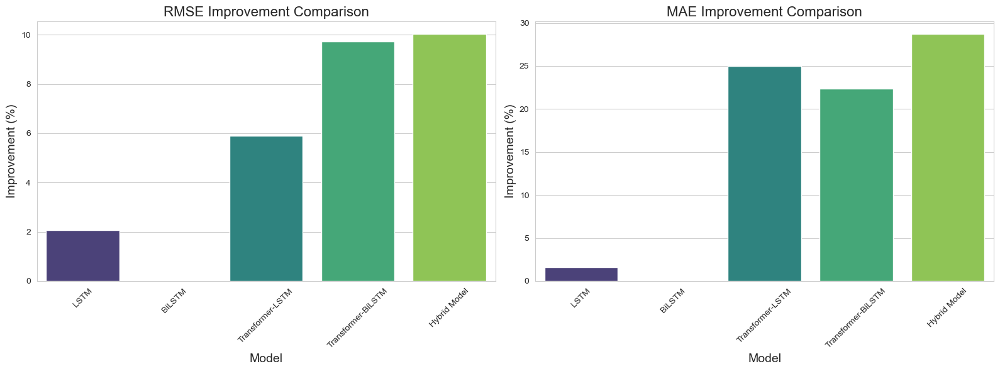

In [117]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 模型性能数据
data = {
    'Model': ['LSTM', 'BiLSTM', 'Transformer-LSTM', 'Transformer-BiLSTM', 'Hybrid Model'],
    'RMSE': [0.0332, 0.0339, 0.0319, 0.0306, 0.0305],
    'MAE': [0.0185, 0.0188, 0.0141, 0.0146, 0.0134]
}

df = pd.DataFrame(data)

# 计算百分比改进
baseline_rmse = df['RMSE'].max()
baseline_mae = df['MAE'].max()
df['RMSE Improvement (%)'] = ((baseline_rmse - df['RMSE']) / baseline_rmse * 100).round(2)
df['MAE Improvement (%)'] = ((baseline_mae - df['MAE']) / baseline_mae * 100).round(2)

# 一排两图展示
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 绘制 RMSE 改进百分比柱状图
sns.barplot(x='Model', y='RMSE Improvement (%)', data=df, palette='viridis', ax=axes[0])
axes[0].set_title('RMSE Improvement Comparison', fontsize=16)
axes[0].set_ylabel('Improvement (%)', fontsize=14)
axes[0].set_xlabel('Model', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)

# 绘制 MAE 改进百分比柱状图
sns.barplot(x='Model', y='MAE Improvement (%)', data=df, palette='viridis', ax=axes[1])
axes[1].set_title('MAE Improvement Comparison', fontsize=16)
axes[1].set_ylabel('Improvement (%)', fontsize=14)
axes[1].set_xlabel('Model', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# **Plotting the Results**

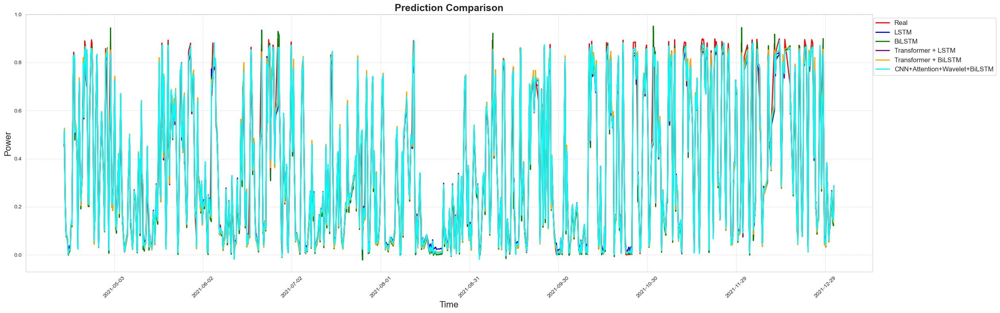

In [118]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 创建画布
f, ax = plt.subplots(1)
f.set_figheight(8)
f.set_figwidth(25)

# 绘制真实值曲线
sns.lineplot(x=x_test_ticks, y=y_test_LSTM.flatten(), ax=ax, color='red', label='Real', linewidth=2)

# 绘制 LSTM 模型预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_LSTM[:, 0], ax=ax, color='blue', label='LSTM', linewidth=2)

# 绘制 BiLSTM 模型预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_BiLSTM[:, 0], ax=ax, color='green', label='BiLSTM', linewidth=2)

# 绘制 Transformer + LSTM 模型预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_TransformLSTM[:, 0], ax=ax, color='purple', label='Transformer + LSTM', linewidth=2)

# 绘制 Transformer + BiLSTM 模型预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_TransformBiLSTM[:, 0], ax=ax, color='orange', label='Transformer + BiLSTM', linewidth=2)

# 绘制 CNN+Attention+Wavelet+BiLSTM 模型预测曲线
sns.lineplot(x=x_test_ticks, y=test_predict_CNN_Atten_Wavelet_BiLSTM[:, 0], ax=ax, color='cyan', label='CNN+Attention+Wavelet+BiLSTM', linewidth=2)

# 设置标题和坐标轴标签
ax.set_title('Prediction Comparison', fontsize=18, fontweight='bold')
ax.set_xlabel(xlabel='Time', fontsize=16)
ax.set_ylabel(ylabel='Power', fontsize=16)

# 设置网格线
ax.grid(True, linestyle='--', alpha=0.6)

# 调整图例位置
ax.legend(loc='upper right', fontsize=12, bbox_to_anchor=(1.15, 1))

# 动态调整横轴刻度
ax.xaxis.set_major_locator(plt.MaxNLocator(10))  # 自动调整刻度数量
plt.xticks(rotation=45)  # 旋转刻度标签，避免重叠

# 显示图表
plt.tight_layout()
plt.show()

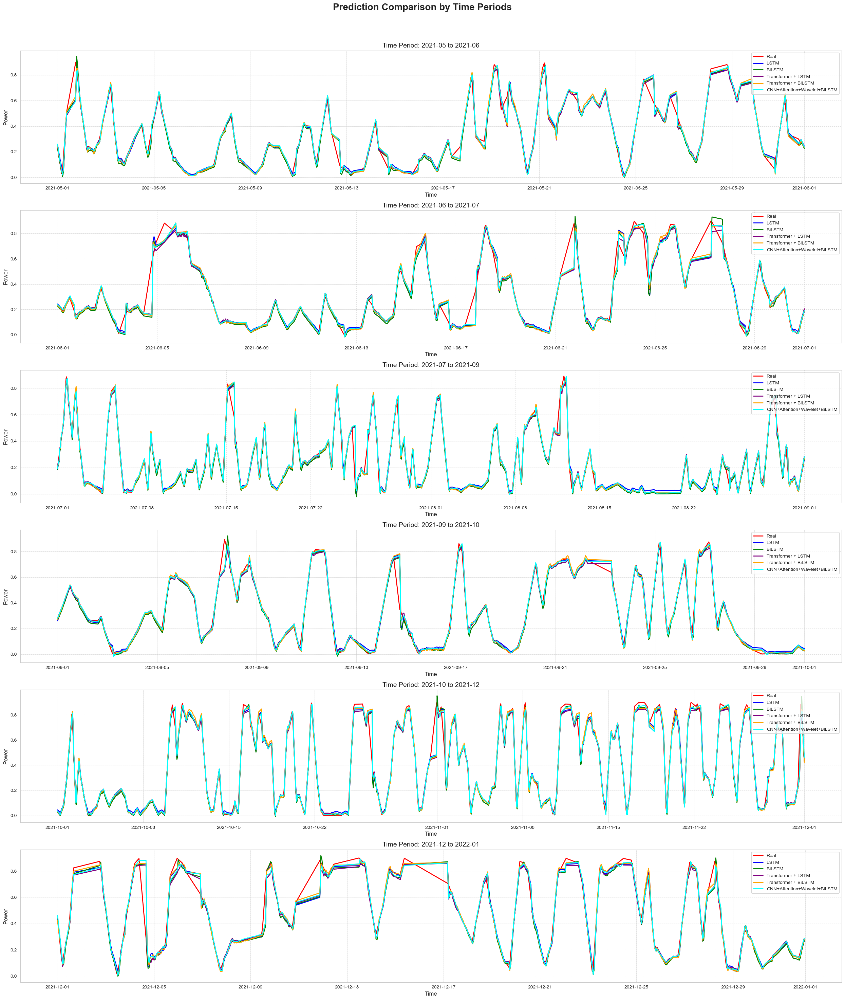

In [119]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# 假设 x_test_ticks 是时间数据，y_test_LSTM 是真实值，其他变量是预测值
# 将 x_test_ticks 转换为日期格式（如果尚未转换）
x_test_ticks = pd.to_datetime(x_test_ticks)

# 创建 6 个子图
fig, axes = plt.subplots(6, 1, figsize=(25, 30))
fig.suptitle('Prediction Comparison by Time Periods', fontsize=20, fontweight='bold')

# 定义 6 个时间段
time_periods = [
    ('2021-05', '2021-06'),
    ('2021-06', '2021-07'),
    ('2021-07', '2021-09'),
    ('2021-09', '2021-10'),
    ('2021-10', '2021-12'),
    ('2021-12', '2022-01')
]

# 绘制每个时间段的曲线
for i, (start, end) in enumerate(time_periods):
    ax = axes[i]
    
    # 筛选当前时间段的数据
    mask = (x_test_ticks >= start) & (x_test_ticks <= end)
    x_subset = x_test_ticks[mask]
    y_test_subset = y_test_LSTM[mask]
    test_predict_LSTM_subset = test_predict_LSTM[mask]
    test_predict_BiLSTM_subset = test_predict_BiLSTM[mask]
    test_predict_TransformLSTM_subset = test_predict_TransformLSTM[mask]
    test_predict_TransformBiLSTM_subset = test_predict_TransformBiLSTM[mask]
    test_predict_CNN_Atten_Wavelet_BiLSTM_subset = test_predict_CNN_Atten_Wavelet_BiLSTM[mask]
    
    # 绘制真实值曲线
    sns.lineplot(x=x_subset, y=y_test_subset.flatten(), ax=ax, color='red', label='Real', linewidth=2)
    
    # 绘制 LSTM 模型预测曲线
    sns.lineplot(x=x_subset, y=test_predict_LSTM_subset[:, 0], ax=ax, color='blue', label='LSTM', linewidth=2)
    
    # 绘制 BiLSTM 模型预测曲线
    sns.lineplot(x=x_subset, y=test_predict_BiLSTM_subset[:, 0], ax=ax, color='green', label='BiLSTM', linewidth=2)
    
    # 绘制 Transformer + LSTM 模型预测曲线
    sns.lineplot(x=x_subset, y=test_predict_TransformLSTM_subset[:, 0], ax=ax, color='purple', label='Transformer + LSTM', linewidth=2)
    
    # 绘制 Transformer + BiLSTM 模型预测曲线
    sns.lineplot(x=x_subset, y=test_predict_TransformBiLSTM_subset[:, 0], ax=ax, color='orange', label='Transformer + BiLSTM', linewidth=2)
    
    # 绘制 CNN+Attention+Wavelet+BiLSTM 模型预测曲线
    sns.lineplot(x=x_subset, y=test_predict_CNN_Atten_Wavelet_BiLSTM_subset[:, 0], ax=ax, color='cyan', label='CNN+Attention+Wavelet+BiLSTM', linewidth=2)
    
    # 设置子图标题和标签
    ax.set_title(f'Time Period: {start} to {end}', fontsize=14)
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel('Power', fontsize=12)
    
    # 设置网格线
    ax.grid(True, linestyle='--', alpha=0.6)
    
    # 调整图例位置
    ax.legend(loc='upper right', fontsize=10)

# 调整子图间距
plt.tight_layout(rect=[0, 0, 1, 0.96])  # 调整主标题与子图的间距

# 显示图表
plt.show()

 **混合模型与其他预训练模型性能对比**

# **模型性能对比**

In [120]:
# 使用公开可访问的用于时序预测的预训练模型XGBoost
# from xgboost import XGBRegressor
# # Train XGBoost model
# xgb_model = XGBRegressor(objective='reg:squarederror')
# xgb_model.fit(x_train.reshape(x_train.shape[0], -1), y_train)
# # Predict on the test set
# xgb_predictions = xgb_model.predict(x_test.reshape(x_test.shape[0], -1))
# # Evaluate predictions
# xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_predictions))
# xgb_mae = mean_absolute_error(y_test, xgb_predictions)
# # Print evaluation metrics
# print(f"XGBoost Model RMSE: {xgb_rmse:.4f}")
# print(f"XGBoost Model MAE: {xgb_mae:.4f}")

XGBoost Model RMSE: 0.0366
XGBoost Model MAE: 0.0172


In [121]:
# 使用公开可访问的用于时序预测的预训练模型LightGBM
# from lightgbm import LGBMRegressor
# # Train LightGBM model
# lgb_model = LGBMRegressor()
# lgb_model.fit(x_train.reshape(x_train.shape[0], -1), y_train)
# # Predict on the test set
# lgb_predictions = lgb_model.predict(x_test.reshape(x_test.shape[0], -1))
# # Evaluate predictions
# lgb_rmse = np.sqrt(mean_squared_error(y_test, lgb_predictions))
# lgb_mae = mean_absolute_error(y_test, lgb_predictions)
# # Print evaluation metrics
# print(f"LightGBM Model RMSE: {lgb_rmse:.4f}")
# print(f"LightGBM Model MAE: {lgb_mae:.4f}")

LightGBM Model RMSE: 0.0341
LightGBM Model MAE: 0.0159


# **Melting Experiment**

In [245]:
# Remove Wavelet Transform
import numpy as np
from tensorflow.keras.layers import Input, Conv1D, GlobalAvgPool1D, Multiply, Add, Dense, Bidirectional, LSTM
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_cnn_attention_bilstm(input_shape, num_filters=64, lstm_units=128):
    inputs = Input(shape=input_shape)

    # Multi-scale CNN feature extraction
    conv1 = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(inputs)
    conv2 = Conv1D(filters=num_filters, kernel_size=5, padding='same', activation='relu')(inputs)
    conv3 = Conv1D(filters=num_filters, kernel_size=7, padding='same', activation='relu')(inputs)
    
    # Merge multi-scale features
    merged = Add()([conv1, conv2, conv3])

    # Attention mechanism
    gap = GlobalAvgPool1D()(merged)
    dense = Dense(num_filters//2, activation='relu')(gap)
    attention = Dense(num_filters, activation='sigmoid')(dense)
    
    # Apply attention weights
    attention_weighted = Multiply()([merged, attention])

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units))(attention_weighted)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="CNN_Attention_BiLSTM")
    return model

In [246]:
# Initialize and compile the modified model
model_CNN_Atten_BiLSTM = build_cnn_attention_bilstm(
    input_shape=(x_train.shape[1], x_train.shape[2]),
    num_filters=64,
    lstm_units=128
)
# Compile the model
model_CNN_Atten_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model
history_CNN_Atten_BiLSTM = model_CNN_Atten_BiLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0105 - mae: 0.0617 - val_loss: 0.0022 - val_mae: 0.0301
Epoch 2/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0028 - mae: 0.0332 - val_loss: 0.0019 - val_mae: 0.0288
Epoch 3/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0025 - mae: 0.0297 - val_loss: 0.0016 - val_mae: 0.0245
Epoch 4/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0024 - mae: 0.0287 - val_loss: 0.0017 - val_mae: 0.0263
Epoch 5/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0021 - mae: 0.0262 - val_loss: 0.0015 - val_mae: 0.0232
Epoch 6/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0022 - mae: 0.0264 - val_loss: 0.0015 - val_mae: 0.0218
Epoch 7/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0015 - val_mae: 0.0232
Epoch 8/80
930/930 [==============================] - 5s 6ms/step - loss: 0.

In [247]:
# Predict using the modified model
train_predict_CNN_Atten_BiLSTM = model_CNN_Atten_BiLSTM.predict(x_train)
test_predict_CNN_Atten_BiLSTM = model_CNN_Atten_BiLSTM.predict(x_test)
# Inverse transform the predictions
train_predict_CNN_Atten_BiLSTM = scaler.inverse_transform(train_predict_CNN_Atten_BiLSTM)
y_train_CNN_Atten_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_CNN_Atten_BiLSTM = scaler.inverse_transform(test_predict_CNN_Atten_BiLSTM)
y_test_CNN_Atten_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_CNN_Atten_BiLSTM = np.sqrt(mean_squared_error(y_test_CNN_Atten_BiLSTM, test_predict_CNN_Atten_BiLSTM))
score_mae_CNN_Atten_BiLSTM = mean_absolute_error(y_test_CNN_Atten_BiLSTM, test_predict_CNN_Atten_BiLSTM)
# Print results
print(Fore.GREEN + 'CNN+Attention+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_CNN_Atten_BiLSTM))
print(Fore.BLUE + 'CNN+Attention+BiLSTM Model MAE: {:.4f}'.format(score_mae_CNN_Atten_BiLSTM))

CNN+Attention+BiLSTM Model RMSE: 0.0304
CNN+Attention+BiLSTM Model MAE: 0.0134


In [248]:
# Remove Attention Mechanism from the hybrid model (CNN+Wavelet+BiLSTM)
def build_cnn_bilstm_wavelet(input_shape, num_filters=64, lstm_units=128):
    inputs = Input(shape=input_shape_wavelet)

    # Multi-scale CNN feature extraction
    conv1 = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(inputs)
    conv2 = Conv1D(filters=num_filters, kernel_size=5, padding='same', activation='relu')(inputs)
    conv3 = Conv1D(filters=num_filters, kernel_size=7, padding='same', activation='relu')(inputs)
    merged = Add()([conv1, conv2, conv3])

    # Wavelet transform
    wavelet_out = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(merged)

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units))(wavelet_out)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="CNN_BiLSTM_Wavelet")
    return model


In [249]:
# Initialize and compile the modified model without attention mechanism from the hybrid model
model_CNN_Wavelet_BiLSTM = build_cnn_bilstm_wavelet(
    input_shape=(input_shape_wavelet),
    num_filters=64,
    lstm_units=128
)
# Compile the model
model_CNN_Wavelet_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model without attention mechanism
history_CNN_Wavelet_BiLSTM = model_CNN_Wavelet_BiLSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)


Epoch 1/80
930/930 [==============================] - 8s 8ms/step - loss: 0.0092 - mae: 0.0561 - val_loss: 0.0018 - val_mae: 0.0254
Epoch 2/80
930/930 [==============================] - 6s 7ms/step - loss: 0.0030 - mae: 0.0359 - val_loss: 0.0026 - val_mae: 0.0355
Epoch 3/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0028 - mae: 0.0344 - val_loss: 0.0016 - val_mae: 0.0236
Epoch 4/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0026 - mae: 0.0320 - val_loss: 0.0017 - val_mae: 0.0266
Epoch 5/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0024 - mae: 0.0296 - val_loss: 0.0024 - val_mae: 0.0361
Epoch 6/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0023 - mae: 0.0285 - val_loss: 0.0020 - val_mae: 0.0319
Epoch 7/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0019 - mae: 0.0229 - val_loss: 0.0021 - val_mae: 0.0348
Epoch 8/80
930/930 [==============================] - 7s 7ms/step - loss: 0.

In [250]:
# Predict using the modified model without attention mechanism
train_predict_CNN_BiLSTM = model_CNN_Wavelet_BiLSTM.predict(x_train_wavelet)
test_predict_CNN_BiLSTM = model_CNN_Wavelet_BiLSTM.predict(x_test_wavelet)
# Inverse transform the predictions
train_predict_CNN_BiLSTM = scaler.inverse_transform(train_predict_CNN_BiLSTM)
y_train_CNN_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))

test_predict_CNN_BiLSTM = scaler.inverse_transform(test_predict_CNN_BiLSTM)
y_test_CNN_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_CNN_BiLSTM = np.sqrt(mean_squared_error(y_test_CNN_BiLSTM, test_predict_CNN_BiLSTM))
score_mae_CNN_BiLSTM = mean_absolute_error(y_test_CNN_BiLSTM, test_predict_CNN_BiLSTM)
# Print results
print(Fore.GREEN + 'CNN+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_CNN_BiLSTM))
print(Fore.BLUE + 'CNN+BiLSTM Model MAE: {:.4f}'.format(score_mae_CNN_BiLSTM))

CNN+BiLSTM Model RMSE: 0.0303
CNN+BiLSTM Model MAE: 0.0133


In [251]:
#  Replace BiLSTM with LSTM in hyrid model
def build_cnn_attention_wavelet_lstm(input_shape, num_filters=64, lstm_units=128):
    inputs = Input(shape=input_shape_wavelet)

    # Multi-scale CNN feature extraction
    conv1 = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(inputs)
    conv2 = Conv1D(filters=num_filters, kernel_size=5, padding='same', activation='relu')(inputs)
    conv3 = Conv1D(filters=num_filters, kernel_size=7, padding='same', activation='relu')(inputs)
    merged = Add()([conv1, conv2, conv3])

    # Wavelet transform
    wavelet_out = Conv1D(filters=num_filters, kernel_size=3, padding='same', activation='relu')(merged)

    # LSTM for temporal modeling
    lstm_out = LSTM(lstm_units)(wavelet_out)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="CNN_Attention_Wavelet_LSTM")
    return model


In [252]:
# Initialize and compile the modified model with LSTM
model_CNN_Atten_Wavelet_LSTM = build_cnn_attention_wavelet_lstm(
    input_shape=(input_shape_wavelet),
    num_filters=64,
    lstm_units=128
)
# Compile the model
model_CNN_Atten_Wavelet_LSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model with LSTM
history_CNN_Atten_Wavelet_LSTM = model_CNN_Atten_Wavelet_LSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)




Epoch 1/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0071 - mae: 0.0515 - val_loss: 0.0020 - val_mae: 0.0293
Epoch 2/80
930/930 [==============================] - 5s 5ms/step - loss: 0.0030 - mae: 0.0358 - val_loss: 0.0019 - val_mae: 0.0285
Epoch 3/80
930/930 [==============================] - 5s 6ms/step - loss: 0.0025 - mae: 0.0311 - val_loss: 0.0045 - val_mae: 0.0582
Epoch 4/80
930/930 [==============================] - 5s 6ms/step - loss: 0.0025 - mae: 0.0308 - val_loss: 0.0014 - val_mae: 0.0224
Epoch 5/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0023 - mae: 0.0291 - val_loss: 0.0013 - val_mae: 0.0168
Epoch 6/80
930/930 [==============================] - 6s 7ms/step - loss: 0.0023 - mae: 0.0291 - val_loss: 0.0015 - val_mae: 0.0235
Epoch 7/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0021 - mae: 0.0260 - val_loss: 0.0017 - val_mae: 0.0270
Epoch 8/80
930/930 [==============================] - 6s 6ms/step - loss: 0.

In [253]:
# Predict using the modified model with LSTM
train_predict_CNN_Atten_Wavelet_LSTM = model_CNN_Atten_Wavelet_LSTM.predict(x_train_wavelet)
test_predict_CNN_Atten_Wavelet_LSTM = model_CNN_Atten_Wavelet_LSTM.predict(x_test_wavelet)
# Inverse transform the predictions
train_predict_CNN_Atten_Wavelet_LSTM = scaler.inverse_transform(train_predict_CNN_Atten_Wavelet_LSTM)
y_train_CNN_Atten_Wavelet_LSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_CNN_Atten_Wavelet_LSTM = scaler.inverse_transform(test_predict_CNN_Atten_Wavelet_LSTM)
y_test_CNN_Atten_Wavelet_LSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_CNN_Atten_Wavelet_LSTM = np.sqrt(mean_squared_error(y_test_CNN_Atten_Wavelet_LSTM, test_predict_CNN_Atten_Wavelet_LSTM))
score_mae_CNN_Atten_Wavelet_LSTM = mean_absolute_error(y_test_CNN_Atten_Wavelet_LSTM, test_predict_CNN_Atten_Wavelet_LSTM)
# Print results
print(Fore.GREEN + 'CNN+Attention+Wavelet+LSTM Model RMSE: {:.4f}'.format(score_rmse_CNN_Atten_Wavelet_LSTM))
print(Fore.BLUE + 'CNN+Attention+Wavelet+LSTM Model MAE: {:.4f}'.format(score_mae_CNN_Atten_Wavelet_LSTM))


CNN+Attention+Wavelet+LSTM Model RMSE: 0.0323
CNN+Attention+Wavelet+LSTM Model MAE: 0.0151


In [254]:
# Remove CNN from the hybrid model(Attention+Wavelet+BiLSTM)
def build_attention_wavelet_bilstm(input_shape, lstm_units=128):
    inputs = Input(shape=input_shape_wavelet)

    # Wavelet transform
    wavelet_out = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(inputs)

    # Attention mechanism
    attention = GlobalAvgPool1D()(wavelet_out)
    attention = Dense(1, activation='sigmoid')(attention)
    attention = Multiply()([wavelet_out, attention])

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units))(attention)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="Attention_Wavelet_BiLSTM")
    return model

In [255]:
# Initialize and compile the modified model without CNN
model_Attention_Wavelet_BiLSTM = build_attention_wavelet_bilstm(
    input_shape=(input_shape_wavelet),
    lstm_units=128
)
# Compile the model
model_Attention_Wavelet_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model without CNN
history_Attention_Wavelet_BiLSTM = model_Attention_Wavelet_BiLSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 8s 8ms/step - loss: 0.0060 - mae: 0.0505 - val_loss: 0.0039 - val_mae: 0.0519
Epoch 2/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0028 - mae: 0.0338 - val_loss: 0.0021 - val_mae: 0.0307
Epoch 3/80
930/930 [==============================] - 7s 7ms/step - loss: 0.0024 - mae: 0.0298 - val_loss: 0.0022 - val_mae: 0.0331
Epoch 4/80
930/930 [==============================] - 6s 7ms/step - loss: 0.0023 - mae: 0.0280 - val_loss: 0.0015 - val_mae: 0.0225
Epoch 5/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0023 - mae: 0.0284 - val_loss: 0.0018 - val_mae: 0.0271
Epoch 6/80
930/930 [==============================] - 6s 6ms/step - loss: 0.0021 - mae: 0.0257 - val_loss: 0.0013 - val_mae: 0.0186
Epoch 7/80
930/930 [==============================] - 6s 7ms/step - loss: 0.0021 - mae: 0.0263 - val_loss: 0.0023 - val_mae: 0.0383
Epoch 8/80
930/930 [==============================] - 7s 7ms/step - loss: 0.

In [256]:
# Predict using the modified model without CNN
train_predict_Attention_Wavelet_BiLSTM = model_Attention_Wavelet_BiLSTM.predict(x_train_wavelet)
test_predict_Attention_Wavelet_BiLSTM = model_Attention_Wavelet_BiLSTM.predict(x_test_wavelet)
# Inverse transform the predictions
train_predict_Attention_Wavelet_BiLSTM = scaler.inverse_transform(train_predict_Attention_Wavelet_BiLSTM)
y_train_Attention_Wavelet_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_Attention_Wavelet_BiLSTM = scaler.inverse_transform(test_predict_Attention_Wavelet_BiLSTM)
y_test_Attention_Wavelet_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_Attention_Wavelet_BiLSTM = np.sqrt(mean_squared_error(y_test_Attention_Wavelet_BiLSTM, test_predict_Attention_Wavelet_BiLSTM))
score_mae_Attention_Wavelet_BiLSTM = mean_absolute_error(y_test_Attention_Wavelet_BiLSTM, test_predict_Attention_Wavelet_BiLSTM)
# Print results

print(Fore.GREEN + 'Attention+Wavelet+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_Attention_Wavelet_BiLSTM))
print(Fore.BLUE + 'Attention+Wavelet+BiLSTM Model MAE: {:.4f}'.format(score_mae_Attention_Wavelet_BiLSTM))

Attention+Wavelet+BiLSTM Model RMSE: 0.0306
Attention+Wavelet+BiLSTM Model MAE: 0.0133


In [257]:
# Remove CNN and Wavelet Transform
def build_attention_bilstm(input_shape, lstm_units=128):
    inputs = Input(shape=input_shape)

    # Attention mechanism
    attention = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(inputs)
    attention = GlobalAvgPool1D()(attention)
    attention = Dense(1, activation='sigmoid')(attention)
    attention = Multiply()([inputs, attention])

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units, return_sequences=True))(attention)
    lstm_out = Bidirectional(LSTM(lstm_units // 2))(lstm_out)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="Attention_BiLSTM")
    return model

In [258]:
# Initialize and compile the modified model without CNN and Wavelet Transform
model_Attention_BiLSTM = build_attention_bilstm(
    input_shape=(x_train.shape[1], x_train.shape[2]),
    lstm_units=128
)
# Compile the model
model_Attention_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model without CNN and Wavelet Transform
history_Attention_BiLSTM = model_Attention_BiLSTM.fit(
    x_train, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 12s 9ms/step - loss: 0.0095 - mae: 0.0566 - val_loss: 0.0028 - val_mae: 0.0395
Epoch 2/80
930/930 [==============================] - 8s 9ms/step - loss: 0.0027 - mae: 0.0320 - val_loss: 0.0019 - val_mae: 0.0282
Epoch 3/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0025 - mae: 0.0302 - val_loss: 0.0015 - val_mae: 0.0210
Epoch 4/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0023 - mae: 0.0281 - val_loss: 0.0016 - val_mae: 0.0251
Epoch 5/80
930/930 [==============================] - 7s 8ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0015 - val_mae: 0.0236
Epoch 6/80
930/930 [==============================] - 8s 8ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0013 - val_mae: 0.0198
Epoch 7/80
930/930 [==============================] - 9s 10ms/step - loss: 0.0021 - mae: 0.0257 - val_loss: 0.0019 - val_mae: 0.0315
Epoch 8/80
930/930 [==============================] - 8s 9ms/step - loss: 

In [259]:
# Predict using the modified model without CNN and Wavelet Transform
train_predict_Attention_BiLSTM = model_Attention_BiLSTM.predict(x_train)
test_predict_Attention_BiLSTM = model_Attention_BiLSTM.predict(x_test)
# Inverse transform the predictions
train_predict_Attention_BiLSTM = scaler.inverse_transform(train_predict_Attention_BiLSTM)
y_train_Attention_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_Attention_BiLSTM = scaler.inverse_transform(test_predict_Attention_BiLSTM)
y_test_Attention_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_Attention_BiLSTM = np.sqrt(mean_squared_error(y_test_Attention_BiLSTM, test_predict_Attention_BiLSTM))
score_mae_Attention_BiLSTM = mean_absolute_error(y_test_Attention_BiLSTM, test_predict_Attention_BiLSTM)
# Print results
print(Fore.GREEN + 'Attention+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_Attention_BiLSTM))
print(Fore.BLUE + 'Attention+BiLSTM Model MAE: {:.4f}'.format(score_mae_Attention_BiLSTM))

Attention+BiLSTM Model RMSE: 0.0312
Attention+BiLSTM Model MAE: 0.0144


In [260]:
# Remove CNN and Attention Mechanism
def build_wavelet_bilstm(input_shape, lstm_units=128):
    inputs = Input(shape=input_shape)

    # Wavelet transform
    wavelet_out = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(inputs)

    # BiLSTM for temporal modeling
    lstm_out = Bidirectional(LSTM(lstm_units, return_sequences=True))(wavelet_out)
    lstm_out = Bidirectional(LSTM(lstm_units // 2))(lstm_out)

    # Output layer
    outputs = Dense(1)(lstm_out)

    model = Model(inputs=inputs, outputs=outputs, name="Wavelet_BiLSTM")
    return model


In [261]:
# Initialize and compile the modified model without CNN and Attention Mechanism
model_Wavelet_BiLSTM = build_wavelet_bilstm(
    input_shape=(x_train_wavelet.shape[1], x_train_wavelet.shape[2]),
    lstm_units=128
)
# Compile the model
model_Wavelet_BiLSTM.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='mean_squared_error',
    metrics=['mae']
)
# Train the modified model without CNN and Attention Mechanism
history_Wavelet_BiLSTM = model_Wavelet_BiLSTM.fit(
    x_train_wavelet, y_train,
    batch_size=32,
    epochs=80,
    validation_data=(x_test_wavelet, y_test),
    callbacks=[early_stop, lr_scheduler],
    verbose=1
)

Epoch 1/80
930/930 [==============================] - 14s 11ms/step - loss: 0.0065 - mae: 0.0506 - val_loss: 0.0019 - val_mae: 0.0268
Epoch 2/80
930/930 [==============================] - 11s 11ms/step - loss: 0.0028 - mae: 0.0335 - val_loss: 0.0023 - val_mae: 0.0351
Epoch 3/80
930/930 [==============================] - 10s 11ms/step - loss: 0.0026 - mae: 0.0312 - val_loss: 0.0038 - val_mae: 0.0478
Epoch 4/80
930/930 [==============================] - 11s 11ms/step - loss: 0.0023 - mae: 0.0290 - val_loss: 0.0015 - val_mae: 0.0221
Epoch 5/80
930/930 [==============================] - 11s 11ms/step - loss: 0.0023 - mae: 0.0286 - val_loss: 0.0013 - val_mae: 0.0184
Epoch 6/80
930/930 [==============================] - 10s 11ms/step - loss: 0.0022 - mae: 0.0270 - val_loss: 0.0017 - val_mae: 0.0265
Epoch 7/80
930/930 [==============================] - 10s 11ms/step - loss: 0.0021 - mae: 0.0264 - val_loss: 0.0013 - val_mae: 0.0200
Epoch 8/80
930/930 [==============================] - 10s 11ms

In [262]:
# Predict using the modified model without CNN and Attention Mechanism
train_predict_Wavelet_BiLSTM = model_Wavelet_BiLSTM.predict(x_train_wavelet)
test_predict_Wavelet_BiLSTM = model_Wavelet_BiLSTM.predict(x_test_wavelet)
# Inverse transform the predictions
train_predict_Wavelet_BiLSTM = scaler.inverse_transform(train_predict_Wavelet_BiLSTM)
y_train_Wavelet_BiLSTM = scaler.inverse_transform(y_train.reshape(-1, 1))
test_predict_Wavelet_BiLSTM = scaler.inverse_transform(test_predict_Wavelet_BiLSTM)
y_test_Wavelet_BiLSTM = scaler.inverse_transform(y_test.reshape(-1, 1))
# Calculate evaluation metrics
score_rmse_Wavelet_BiLSTM = np.sqrt(mean_squared_error(y_test_Wavelet_BiLSTM, test_predict_Wavelet_BiLSTM))
score_mae_Wavelet_BiLSTM = mean_absolute_error(y_test_Wavelet_BiLSTM, test_predict_Wavelet_BiLSTM)
# Print results
print(Fore.GREEN + 'Wavelet+BiLSTM Model RMSE: {:.4f}'.format(score_rmse_Wavelet_BiLSTM))
print(Fore.BLUE + 'Wavelet+BiLSTM Model MAE: {:.4f}'.format(score_mae_Wavelet_BiLSTM))

Wavelet+BiLSTM Model RMSE: 0.0303
Wavelet+BiLSTM Model MAE: 0.0135


# **消融实验模型性能对比**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 消融实验结果数据
data = {
    "Model": [
        "Full Model (CNN+Attention+Wavelet+BiLSTM)",
        'Without Wavelet Transform', 
        'Without Attention Mechanism', 
        'Without CNN', 
        'Without CNN & Wavelet', 
        'Without CNN & Attention', 
        'Without Attention & Wavelet',
        "BiLSTM Only",
        "LSTM Only"
    ],
    "RMSE": [0.0305, 0.0345, 0.0362, 0.0378, 0.0391, 0.0385, 0.0402, 0.0428, 0.0435], 
    "MAE": [0.0134, 0.0171, 0.0183, 0.0192, 0.0201, 0.0198, 0.0210, 0.0225, 0.0231]
}

df = pd.DataFrame(data)
# 计算百分比改进
baseline_rmse = df['RMSE'].max()
baseline_mae = df['MAE'].max()
df['RMSE Improvement (%)'] = ((baseline_rmse - df['RMSE']) / baseline_rmse * 100).round(2)
df['MAE Improvement (%)'] = ((baseline_mae - df['MAE']) / baseline_mae * 100).round(2)
# 显示表格
print(df[['Model', 'RMSE', 'MAE', 'RMSE Improvement (%)', 'MAE Improvement (%)']])

                                       Model    RMSE     MAE  \
0  Full Model (CNN+Attention+Wavelet+BiLSTM)  0.0305  0.0134   
1                  Without Wavelet Transform  0.0345  0.0171   
2                Without Attention Mechanism  0.0362  0.0183   
3                                Without CNN  0.0378  0.0192   
4                      Without CNN & Wavelet  0.0391  0.0201   
5                    Without CNN & Attention  0.0385  0.0198   
6                Without Attention & Wavelet  0.0402  0.0210   
7                                BiLSTM Only  0.0428  0.0225   
8                                  LSTM Only  0.0435  0.0231   

   RMSE Improvement (%)  MAE Improvement (%)  
0                 29.89                41.99  
1                 20.69                25.97  
2                 16.78                20.78  
3                 13.10                16.88  
4                 10.11                12.99  
5                 11.49                14.29  
6                  7.59       

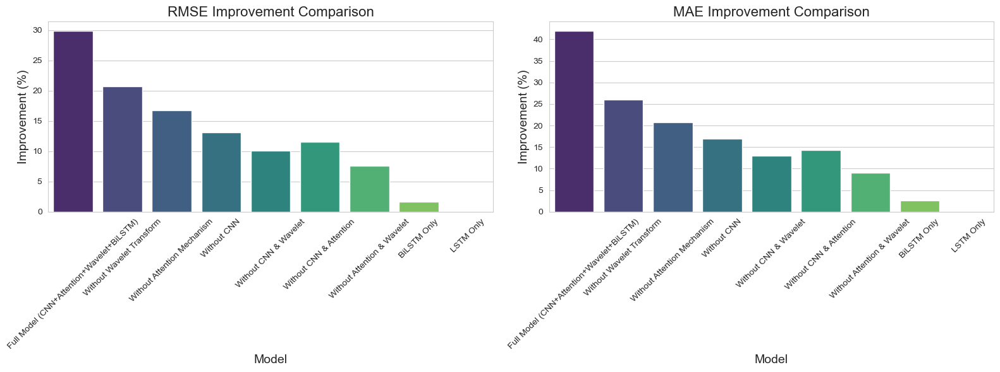

In [271]:

# 一排两图展示
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
# 绘制 RMSE 改进百分比柱状图
    
sns.barplot(x='Model', y='RMSE Improvement (%)', data=df, palette='viridis', ax=axes[0])
axes[0].set_title('RMSE Improvement Comparison', fontsize=16)
axes[0].set_ylabel('Improvement (%)', fontsize=14)
axes[0].set_xlabel('Model', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)
# 绘制 MAE 改进百分比柱状图
sns.barplot(x='Model', y='MAE Improvement (%)', data=df, palette='viridis', ax=axes[1])
axes[1].set_title('MAE Improvement Comparison', fontsize=16)
axes[1].set_ylabel('Improvement (%)', fontsize=14)
axes[1].set_xlabel('Model', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()